# Medical Image Analysis Project

A refactored and structured implementation of medical image analysis using Autoencoders and Variational Autoencoders (VAEs) for brain imaging data. This project was refactored from a large Jupyter notebook into a well-organized, modular codebase suitable for research and production use.



## Environment Setup

### General Imports

In [32]:
import torch
import os
import glob
import pandas as pd
import pydicom
import numpy as np
import random
import matplotlib.pyplot as plt
import nibabel as nib
from skimage.filters import threshold_otsu
from skimage.morphology import binary_closing, ball
from torch.utils.data import Dataset, DataLoader
from tqdm import tqdm
import gc
import psutil
import time
from sklearn.model_selection import train_test_split
import sys
import argparse
from pathlib import Path
import warnings

warnings.filterwarnings('ignore')

### Custom imports

In [33]:
# Force reload
import importlib
import utils.config_helpers
import data.data_ingestion
import data.data_visualization
import processing.preproccessing
import data.dataloader
import processing.eda
import models.autoencoder.test
import models.autoencoder.scheduler
import models.autoencoder.model
import models.autoencoder.optimizer
import models.autoencoder.config
import models.autoencoder.training
import models.autoencoder.evaluation
import models.autoencoder.visualization
import models.vae.test
import models.vae.model
import models.vae.optimizer
import models.vae.scheduler
import models.vae.config
import models.vae.training
import models.vae.evaluation
import models.vae.visualization
import experiment_runner
import visualization.experiment_plotter
import visualization.reconstruction_visualizer

importlib.reload(utils.config_helpers)
importlib.reload(data.data_ingestion)
importlib.reload(data.data_visualization)
importlib.reload(processing.preproccessing)
importlib.reload(data.dataloader)
importlib.reload(processing.eda)
importlib.reload(models.autoencoder.test)
importlib.reload(models.autoencoder.scheduler)
importlib.reload(models.autoencoder.model)
importlib.reload(models.autoencoder.optimizer)
importlib.reload(models.autoencoder.config)
importlib.reload(models.autoencoder.training)
importlib.reload(models.autoencoder.evaluation)
importlib.reload(models.autoencoder.visualization)
importlib.reload(models.vae.test)
importlib.reload(models.vae.model)
importlib.reload(models.vae.optimizer)
importlib.reload(models.vae.scheduler)
importlib.reload(models.vae.config)
importlib.reload(models.vae.training)
importlib.reload(models.vae.evaluation)
importlib.reload(models.vae.visualization)
importlib.reload(experiment_runner)
importlib.reload(visualization.experiment_plotter)
importlib.reload(visualization.reconstruction_visualizer)

from utils.config_helpers import print_cuda_info, configure_gpu, print_gpu_memory_stats, print_memory_stats
from data.data_ingestion import collect_files, generate_dataframe, save_qa_report, load_dicom
from data.data_visualization import (
    load_mask,
    extract_slices,
    plot_patient_slices,
    plot_side_by_side,
    plot_intensity_distributions,
    plot_group_statistics,
    visualize_sample_slices,
    plot_slice_variances
)
from processing.preproccessing import process_volume
from data.dataloader import OnDemandDataset, create_dataloaders
from processing.eda import create_memory_efficient_dataloaders, analyze_dataset_statistics_efficiently, analyze_slice_variance
from models.autoencoder.test import test_autoencoder
from models.autoencoder.scheduler import get_cosine_schedule_with_warmup, create_scheduler
from models.autoencoder.model import BaseAutoencoder
from models.autoencoder.optimizer import create_optimizer
from models.autoencoder.config import TrainingConfig, EarlyStopping, CheckpointHandler
from models.autoencoder.training import train_autoencoder
from models.autoencoder.evaluation import (
    load_trained_model,
    compute_reconstruction_error,
    extract_latent_vectors,
    find_outliers,
    explore_top_dimensions
)
from models.autoencoder.visualization import (
    plot_training_history,
    visualize_reconstruction_samples,
    visualize_latent_space,
    plot_latent_dimension_activation,
    visualize_outliers,
    visualize_latent_dimension,
    generate_feature_importance_map
)
from models.vae.test import test_vae
from models.vae.model import VAE
from models.vae.training import train_vae
from models.vae.config import VAEConfig

from experiment_runner import run_experiments
from visualization.experiment_plotter import ExperimentPlotter
from visualization.reconstruction_visualizer import ReconstructionVisualizer

### Environment Configuration

In [3]:
# CUDA verification
print_cuda_info()

CUDA available: True
CUDA device count: 1
CUDA device name: NVIDIA GeForce RTX 4090
CUDA device capability: (8, 9)


In [4]:
# Configure GPU on startup
configure_gpu()

Using GPU: NVIDIA GeForce RTX 4090


In [5]:
print_gpu_memory_stats()

GPU Memory Allocated: 0.00 MB
GPU Memory Reserved: 0.00 MB


In [6]:
# Constants
BASE_DIR = os.getcwd()
DATA_DIR = "data"
IMAGES_DIR = os.path.join(DATA_DIR, "Images")
MASKS_DIR = os.path.join(DATA_DIR, "masks")

## Output Directories
OUTPUT_DIR = os.path.join(BASE_DIR, "output")
if not os.path.exists(OUTPUT_DIR):
    os.makedirs(OUTPUT_DIR)
RESULTS_DIR = os.path.join(OUTPUT_DIR, "Results")
if not os.path.exists(RESULTS_DIR):
    os.makedirs(RESULTS_DIR)
MODEL_DIR = os.path.join(OUTPUT_DIR, "Models")
if not os.path.exists(MODEL_DIR):
    os.makedirs(MODEL_DIR)
VALIDATED_DIR = os.path.join(OUTPUT_DIR, "Validated")
if not os.path.exists(VALIDATED_DIR):
    os.makedirs(VALIDATED_DIR)

## Data Ingestion

In [7]:
# Execute Data Ingestion Pipeline
# Collect files from only the expected subdirectories
included_files, excluded_files = collect_files(IMAGES_DIR)

# Create a DataFrame for the validated file paths and their labels
df = generate_dataframe(included_files)

# Final validation: Ensure that no "br_raw" files are included
if df["file_path"].str.contains("br_raw").any():
    raise ValueError("Validation failed: 'br_raw' files detected in the final dataset!")

# Save the validated file paths to CSV for reproducibility
df.to_csv(os.path.join(VALIDATED_DIR, "validated_file_paths.csv"), index=False)
print("Validated file paths saved to validated_file_paths.csv")

# Generate and save the QA report
total_files = len(included_files) + len(excluded_files)
save_qa_report(
    total_files,
    len(included_files),
    len(excluded_files),
    os.path.join(VALIDATED_DIR, "data_ingestion_QA_report.csv")
)
print("QA report generated and saved as data_ingestion_QA_report.csv")


Validated file paths saved to validated_file_paths.csv
QA report generated and saved as data_ingestion_QA_report.csv


## Data Visualization

Loading file for group PD: data/Images/PPMI_Images_PD/107099/Reconstructed_DaTSCAN/2022-07-27_14_36_39.0/I1616068/PPMI_107099_NM_Reconstructed_DaTSCAN_Br_20220825150510029_1_S1155479_I1616068.dcm
Loading file for group SWEDD: data/Images/PPMI_Images_SWEDD/3655/Reconstructed_DaTSCAN/2011-09-01_14_49_17.0/I339012/PPMI_3655_NM_Reconstructed_DaTSCAN_Br_20121009131920078_1_S142221_I339012.dcm
Loading file for group Control: data/Images/PPMI_Images_Cont/101195/Reconstructed_DaTSCAN/2021-03-26_14_59_17.0/I1461566/PPMI_101195_NM_Reconstructed_DaTSCAN_Br_20210628215017717_1_S1038372_I1461566.dcm


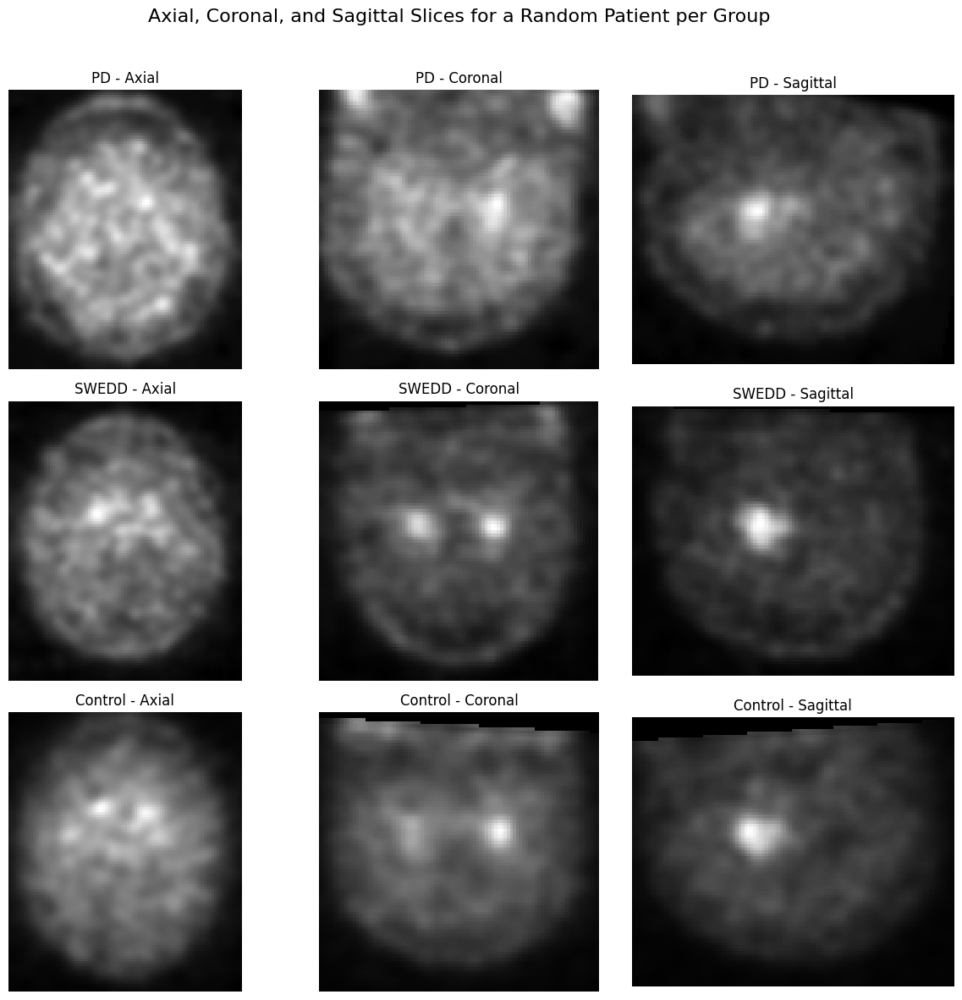

In [8]:
# Visualize patient slices from different groups.
# Read the validated file paths CSV
df = pd.read_csv(os.path.join(VALIDATED_DIR, "validated_file_paths.csv"))

# Define groups
groups = {"PD": "PD", "SWEDD": "SWEDD", "Control": "Control"}

# Load mask
mask = load_mask(os.path.join(MASKS_DIR, "rmask_ICV.nii"))

# Plot and display
plot_patient_slices(df, groups, mask)


## Data Preprocessing

### Intensity Normalization and Volume Preprocessing

### Brain Masking

(64, 109, 91)
(64, 128, 128)


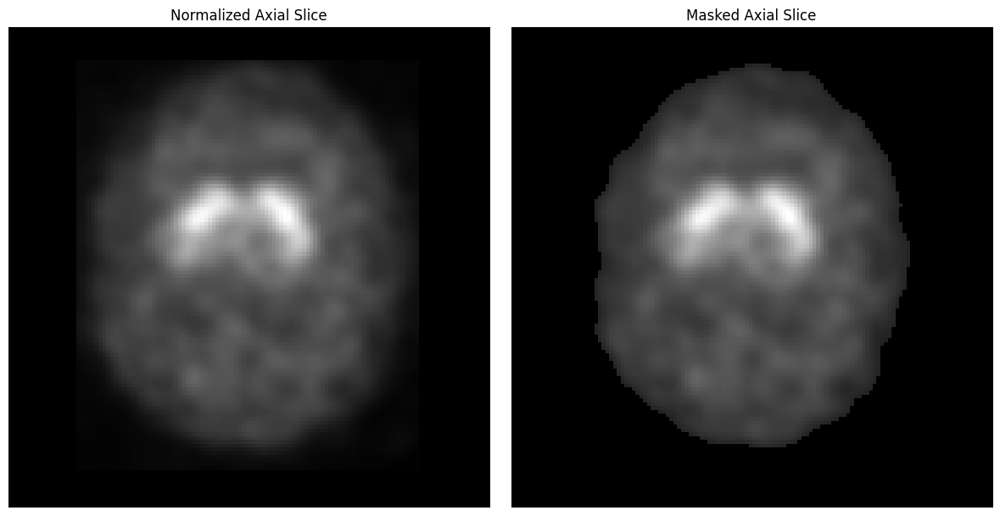

In [9]:
# Data Preprocessing – Brain Masking
# Demonstration: Load one sample DICOM file (using the first file in your validated DataFrame)
sample_file = df.iloc[0]["file_path"]
original_volume, _ = load_dicom(sample_file)
original_volume = original_volume[9:73,:,:]

# Process the volume with our new function
norm_vol, mask, masked_vol = process_volume(original_volume, target_shape=(64,128,128))

print(original_volume.shape)
print(norm_vol.shape)

# Extract an axial (middle) slice from both the normalized volume and the masked volume
axial_norm = norm_vol[norm_vol.shape[0]//2, :, :]
axial_masked = masked_vol[masked_vol.shape[0]//2, :, :]

# Plot the axial slices
fig = plot_side_by_side(axial_norm, axial_masked)



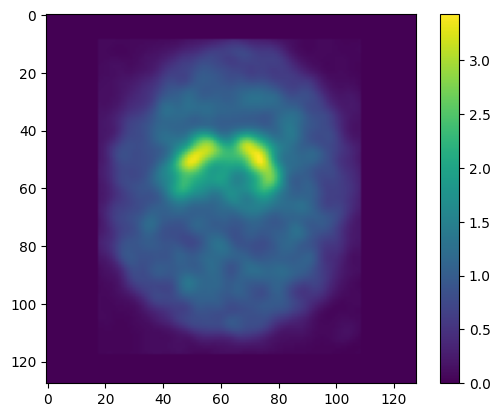

In [10]:
# Data Preprocessing – Visualization (heatmap)
plt.imshow(norm_vol[32,:,:])
plt.colorbar()



## Dataloader Creation (with Shape Validation)

In [11]:
# Test the dataloader with a small batch
print("Testing dataloader with small batch...")
start_time = time.time()

# Create dataloaders with a smaller batch size for testing
train_loader, val_loader = create_dataloaders(
    df,
    batch_size=2,
    on_demand=True,
    mask_path=os.path.join(MASKS_DIR, 'rmask_ICV.nii')
)

# Try to load a single batch
print("Fetching a single batch...")
for batch in train_loader:
    print(f"Batch loaded successfully!")
    print(f"Batch shape: {batch['volume'].shape}")
    print(f"Labels: {batch['label']}")
    break

print(f"Dataloader test completed in {time.time() - start_time:.2f} seconds")
print_memory_stats()

Testing dataloader with small batch...

Training set distribution:
label
PD         2035
Control     235
SWEDD       110
Name: count, dtype: int64

Validation set distribution:
label
PD         510
Control     59
SWEDD       27
Name: count, dtype: int64
Using on-demand data loading strategy (lighter on memory but slower)
✅ Brain mask loaded successfully
✅ All 2380 file paths are valid
✅ Brain mask loaded successfully
✅ All 596 file paths are valid
Fetching a single batch...
Batch loaded successfully!
Batch shape: torch.Size([2, 1, 64, 128, 128])
Labels: ['PD', 'PD']
Dataloader test completed in 5.02 seconds

GPU Memory Usage:
Allocated: 0.00 MB
Cached: 0.00 MB
CPU Memory Usage: 865.83 MB


# Exploratory Data Analysis (EDA)

Starting Memory-Efficient EDA with Stratified Sampling...

Creating memory-efficient dataloaders...

Training set distribution:
label
PD         2035
Control     235
SWEDD       110
Name: count, dtype: int64

Validation set distribution:
label
PD         510
Control     59
SWEDD       27
Name: count, dtype: int64
Using on-demand data loading strategy (lighter on memory but slower)
✅ Brain mask loaded successfully
✅ All 2380 file paths are valid
✅ Brain mask loaded successfully
✅ All 596 file paths are valid

Analyzing training dataset (with stratification)...
Analyzing dataset statistics (stratified, memory-efficient version)...
Scanning dataset to count groups...


Counting groups: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1190/1190 [01:09<00:00, 17.03it/s]


Found groups: {'PD': 2035, 'Control': 235, 'SWEDD': 110}


Collected sufficient samples from all groups
Processing 117 collected samples...
Samples per group: {'PD': 87, 'Control': 15, 'SWEDD': 15}
Successfully analyzed 117 samples
Group distribution in analyzed samples:
label
PD         87
Control    15
SWEDD      15
Name: count, dtype: int64

Plotting intensity distributions...


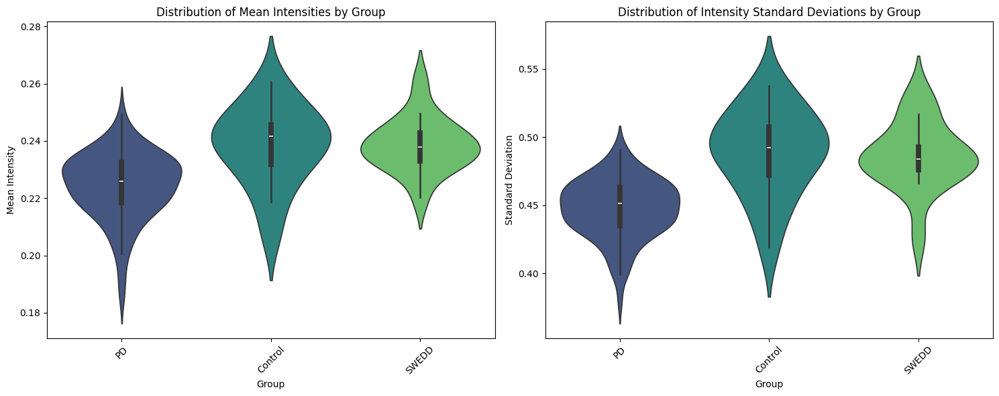


Plotting group statistics...


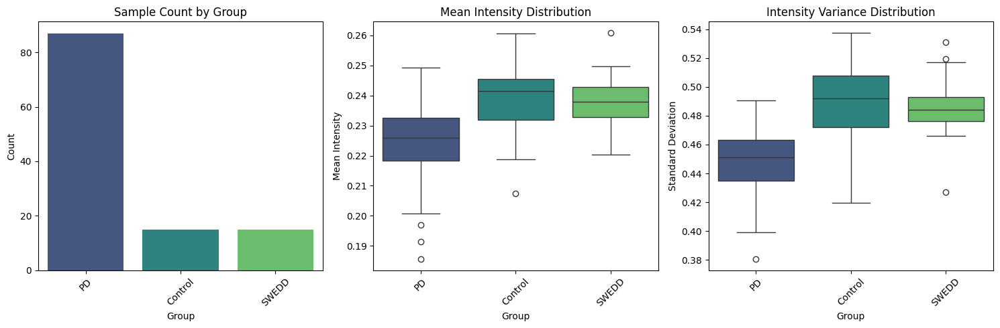


Visualizing example slices...


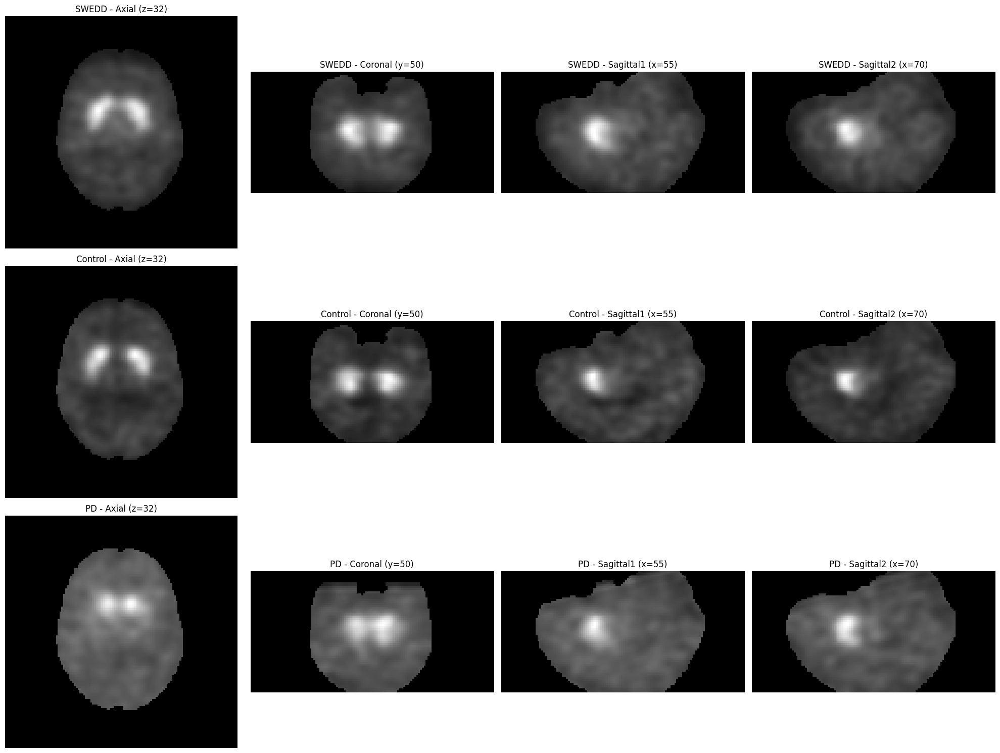


Summary Statistics by Group:
          mean           std         min         max       
          mean    std   mean    std mean  std   mean    std
label                                                      
Control  0.238  0.014  0.488  0.032  0.0  0.0  5.417  0.711
PD       0.224  0.012  0.448  0.021  0.0  0.0  3.608  0.806
SWEDD    0.239  0.009  0.486  0.025  0.0  0.0  4.962  0.868

EDA completed in 155.90 seconds!

GPU Memory Usage:
Allocated: 0.00 MB
Cached: 0.00 MB
CPU Memory Usage: 1480.49 MB


In [12]:
# Optimized EDA Implementation with Stratified Sampling
start_time = time.time()
print("Starting Memory-Efficient EDA with Stratified Sampling...")

# Create dataloaders with small batch size
print("\nCreating memory-efficient dataloaders...")
train_loader, val_loader = create_memory_efficient_dataloaders(
    df,
    batch_size=2,
    mask_path=os.path.join(MASKS_DIR, 'rmask_ICV.nii')
)

# Analyze with stratified sampling and more samples
print("\nAnalyzing training dataset (with stratification)...")
train_stats = analyze_dataset_statistics_efficiently(
    train_loader,
    max_samples=100,  # Increased from 50 to 100
    min_samples_per_group=15  # Ensure at least 15 samples per group
)

# Plot distributions and statistics
print("\nPlotting intensity distributions...")
plot_intensity_distributions(train_stats)

print("\nPlotting group statistics...")
plot_group_statistics(train_stats)

# Visualize a few examples
print("\nVisualizing example slices...")
visualize_sample_slices(train_stats, train_loader, samples_per_group=1)

# Print summary statistics by group
print("\nSummary Statistics by Group:")
summary_stats = train_stats.groupby('label').agg({
    'mean': ['mean', 'std'],
    'std': ['mean', 'std'],
    'min': ['mean', 'std'],
    'max': ['mean', 'std']
}).round(3)
print(summary_stats)

# Memory cleanup
gc.collect()
if torch.cuda.is_available():
    torch.cuda.empty_cache()

print(f"\nEDA completed in {time.time() - start_time:.2f} seconds!")
print_memory_stats()

### Slice Intensity Variance Analysis


Analyzing slice-wise variance patterns...
Analyzing slice-wise variance patterns...


Computing slice variances:   4%|████▍                                                                                               | 53/1190 [00:11<03:56,  4.80it/s]



Plotting slice-wise variance analysis...


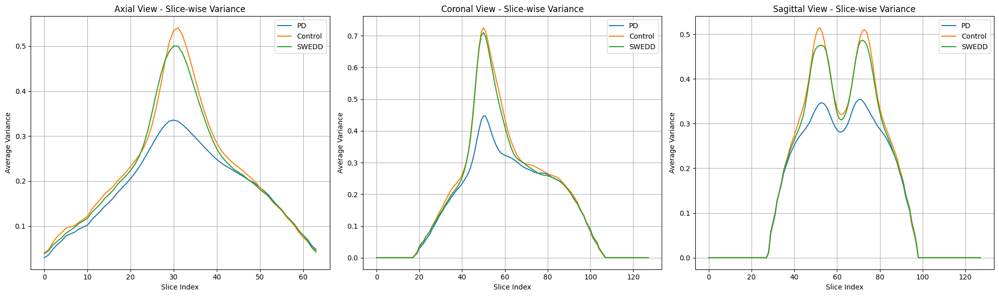

In [13]:
# Analyze slice-wise variance
print("\nAnalyzing slice-wise variance patterns...")
avg_variances = analyze_slice_variance(train_loader, num_samples_per_group=5)

if avg_variances is not None:
    print("\nPlotting slice-wise variance analysis...")
    plot_slice_variances(avg_variances)

# Model Phase

## 1. Autoencoder

### Model Setup

In [14]:
# Run test model setup
test_autoencoder(batch_size=2)


Testing Autoencoder Architecture...

Model Parameters: 38,912,721

Initial GPU Memory Usage:

GPU Memory Usage:
Allocated: 156.48 MB
Cached: 172.00 MB
CPU Memory Usage: 1491.08 MB

Testing encoder...
Input shape: torch.Size([2, 1, 64, 128, 128])
Latent shape: torch.Size([2, 256])

Testing forward pass...
Output shape: torch.Size([2, 1, 64, 128, 128])

Final GPU Memory Usage:

GPU Memory Usage:
Allocated: 172.61 MB
Cached: 622.00 MB
CPU Memory Usage: 1800.95 MB

Autoencoder test completed successfully!


True

In [15]:
# Training Configuration and Utilities
config = TrainingConfig(
    latent_dim=256,
    batch_size=2,
    accumulation_steps=8,
    learning_rate=1e-4,
    epochs=100,
    model_name="autoencoder_test"
)

model = BaseAutoencoder(config.latent_dim)
optimizer = create_optimizer(model, config)
scheduler = create_scheduler(optimizer, config)

print("Configuration and utilities loaded successfully!")


TRAINING CONFIGURATION
Model: autoencoder_test with latent dim 256
Batch size: 2 × 8 steps = 16 effective
Learning rate: 0.0001
Mixed precision: Enabled
Epochs: 100 with patience 10
Dataloader workers: 2
Checkpoints saved to: checkpoints

Configuration and utilities loaded successfully!


### Training


TRAINING CONFIGURATION
Model: autoencoder_test_ld256 with latent dim 256
Batch size: 2 × 2 steps = 4 effective
Learning rate: 0.0001
Mixed precision: Enabled
Epochs: 5 with patience 2
Dataloader workers: 2
Checkpoints saved to: checkpoints


Starting training...
DEBUG: CheckpointHandler - Attempting to load checkpoint from checkpoints/autoencoder_test_ld256_checkpoint.pth
No checkpoint found at checkpoints/autoencoder_test_ld256_checkpoint.pth
DEBUG: Starting training loop


Progress [E1/5|Train]:   0%|                              | 0/5950 [00:00<?, ?it/s]

DEBUG: Starting epoch 1/5


Progress [E1/5|Val]:  20%|██████                        | 1190/5950 [01:17<04:45, 16.68it/s]  

DEBUG: CheckpointHandler - Saving checkpoint for epoch 0


Progress [E1/5|Val]:  20%|██████                        | 1190/5950 [01:36<04:45, 16.68it/s]

DEBUG: CheckpointHandler - Saved checkpoint to checkpoints/autoencoder_test_ld256_checkpoint.pth


Progress [E2/5|Train]:  20%|██████                        | 1190/5950 [01:37<04:45, 16.68it/s]

Saved best model to checkpoints/autoencoder_test_ld256_best.pth
DEBUG: CheckpointHandler - Saved metadata to checkpoints/autoencoder_test_ld256_metadata.json
Epoch 1/5 | Train: 0.011120 | Val: 0.006842 | LR: 0.00010000 | ETA: 6.52m
DEBUG: About to call print_memory_stats()

GPU Memory Usage:
Allocated: 610.80 MB
Cached: 954.00 MB
CPU Memory Usage: 2713.14 MB
DEBUG: Successfully called print_memory_stats()
DEBUG: Checking early stopping criteria
DEBUG: EarlyStopping - Current val_loss: 0.006842, Best loss: inf
Validation loss improved by inf
DEBUG: EarlyStopping - Loss improved, counter reset to 0
DEBUG: Completed epoch 1/5, continuing to next epoch
DEBUG: Starting epoch 2/5


Progress [E2/5|Val]:  40%|████████████                  | 2380/5950 [03:06<03:53, 15.28it/s]    

DEBUG: CheckpointHandler - Saving checkpoint for epoch 1
DEBUG: CheckpointHandler - Saved checkpoint to checkpoints/autoencoder_test_ld256_checkpoint.pth


Progress [E3/5|Train]:  40%|████████████                  | 2380/5950 [03:14<03:53, 15.28it/s]

Saved best model to checkpoints/autoencoder_test_ld256_best.pth
DEBUG: CheckpointHandler - Saved metadata to checkpoints/autoencoder_test_ld256_metadata.json
Epoch 2/5 | Train: 0.006821 | Val: 0.005959 | LR: 0.00010000 | ETA: 4.87m
DEBUG: About to call print_memory_stats()

GPU Memory Usage:
Allocated: 610.80 MB
Cached: 954.00 MB
CPU Memory Usage: 2713.61 MB
DEBUG: Successfully called print_memory_stats()
DEBUG: Checking early stopping criteria
DEBUG: EarlyStopping - Current val_loss: 0.005959, Best loss: 0.006842
Validation loss improved by 0.000884
DEBUG: EarlyStopping - Loss improved, counter reset to 0
DEBUG: Completed epoch 2/5, continuing to next epoch
DEBUG: Starting epoch 3/5


Progress [E4/5|Train]:  60%|██████████████████            | 3570/5950 [04:50<02:37, 15.09it/s]  

Epoch 3/5 | Train: 0.005922 | Val: 0.007223 | LR: 0.00010000 | ETA: 3.23m
DEBUG: About to call print_memory_stats()

GPU Memory Usage:
Allocated: 610.80 MB
Cached: 954.00 MB
CPU Memory Usage: 2713.75 MB
DEBUG: Successfully called print_memory_stats()
DEBUG: Checking early stopping criteria
DEBUG: EarlyStopping - Current val_loss: 0.007223, Best loss: 0.005959
Early stopping counter: 1/2
DEBUG: EarlyStopping - No improvement, counter increased to 1/2
DEBUG: Completed epoch 3/5, continuing to next epoch
DEBUG: Starting epoch 4/5


Progress [E4/5|Val]:  80%|████████████████████████      | 4760/5950 [06:07<01:16, 15.57it/s]    

DEBUG: CheckpointHandler - Saving checkpoint for epoch 3


Progress [E4/5|Val]:  80%|████████████████████████      | 4760/5950 [06:26<01:16, 15.57it/s]

DEBUG: CheckpointHandler - Saved checkpoint to checkpoints/autoencoder_test_ld256_checkpoint.pth


Progress [E5/5|Train]:  80%|████████████████████████      | 4760/5950 [06:28<01:16, 15.57it/s]

Saved best model to checkpoints/autoencoder_test_ld256_best.pth
DEBUG: CheckpointHandler - Saved metadata to checkpoints/autoencoder_test_ld256_metadata.json
Epoch 4/5 | Train: 0.005486 | Val: 0.005299 | LR: 0.00010000 | ETA: 1.62m
DEBUG: About to call print_memory_stats()

GPU Memory Usage:
Allocated: 610.80 MB
Cached: 954.00 MB
CPU Memory Usage: 2713.86 MB
DEBUG: Successfully called print_memory_stats()
DEBUG: Checking early stopping criteria
DEBUG: EarlyStopping - Current val_loss: 0.005299, Best loss: 0.005959
Validation loss improved by 0.000660
DEBUG: EarlyStopping - Loss improved, counter reset to 0
DEBUG: Completed epoch 4/5, continuing to next epoch
DEBUG: Starting epoch 5/5


Progress [E5/5|Val]: 100%|██████████████████████████████| 5950/5950 [07:56<00:00, 16.16it/s]    

DEBUG: CheckpointHandler - Saving checkpoint for epoch 4
DEBUG: CheckpointHandler - Saved checkpoint to checkpoints/autoencoder_test_ld256_checkpoint.pth


Progress [E5/5|Val]: 100%|██████████████████████████████| 5950/5950 [08:05<00:00, 12.24it/s]

Saved best model to checkpoints/autoencoder_test_ld256_best.pth
DEBUG: CheckpointHandler - Saved metadata to checkpoints/autoencoder_test_ld256_metadata.json
Epoch 5/5 | Train: 0.005194 | Val: 0.004912 | LR: 0.00010000 | ETA: 0.00m
DEBUG: About to call print_memory_stats()

GPU Memory Usage:
Allocated: 610.80 MB
Cached: 954.00 MB
CPU Memory Usage: 2714.01 MB
DEBUG: Successfully called print_memory_stats()
DEBUG: Checking early stopping criteria
DEBUG: EarlyStopping - Current val_loss: 0.004912, Best loss: 0.005299
Validation loss improved by 0.000387
DEBUG: EarlyStopping - Loss improved, counter reset to 0
DEBUG: Completed epoch 5/5, continuing to next epoch
DEBUG: Entering finally block
DEBUG: About to plot training history
DEBUG: Saving plot to checkpoints/autoencoder_test_ld256_training_history.png


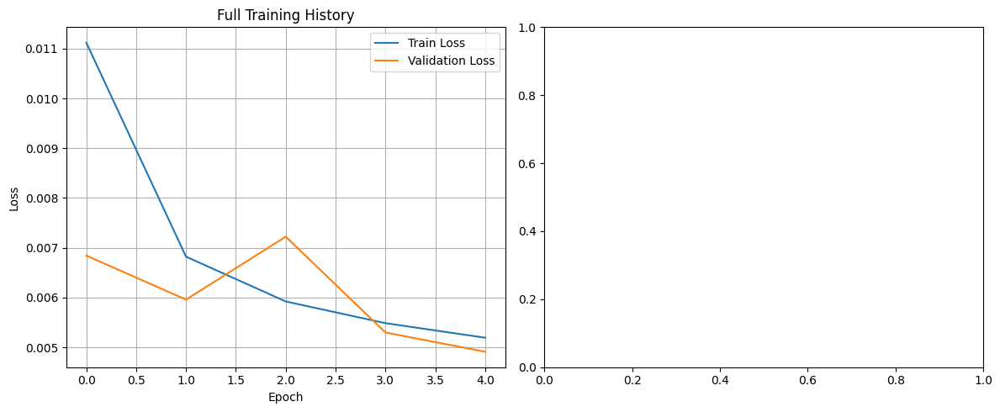

DEBUG: Plot saved and displayed successfully

Training completed in 8.11 minutes
Best validation loss: 0.004912


In [18]:
# Run training
# Initialize model
model = BaseAutoencoder(latent_dim=256)

# Create configuration
config = TrainingConfig.quick_test()

# Train model
print("\nStarting training...")
train_losses, val_losses, trained_model = train_autoencoder(
    model, train_loader, val_loader, config
)


### Evaluation and Result Visualization

#### Reconstruction

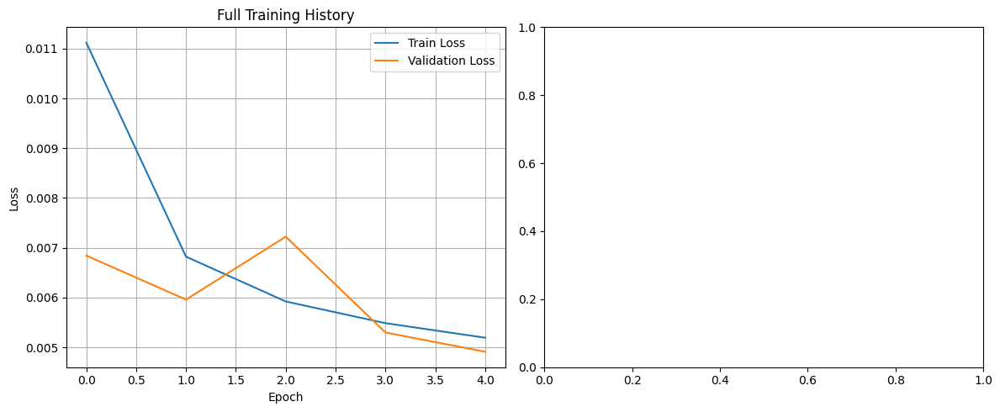

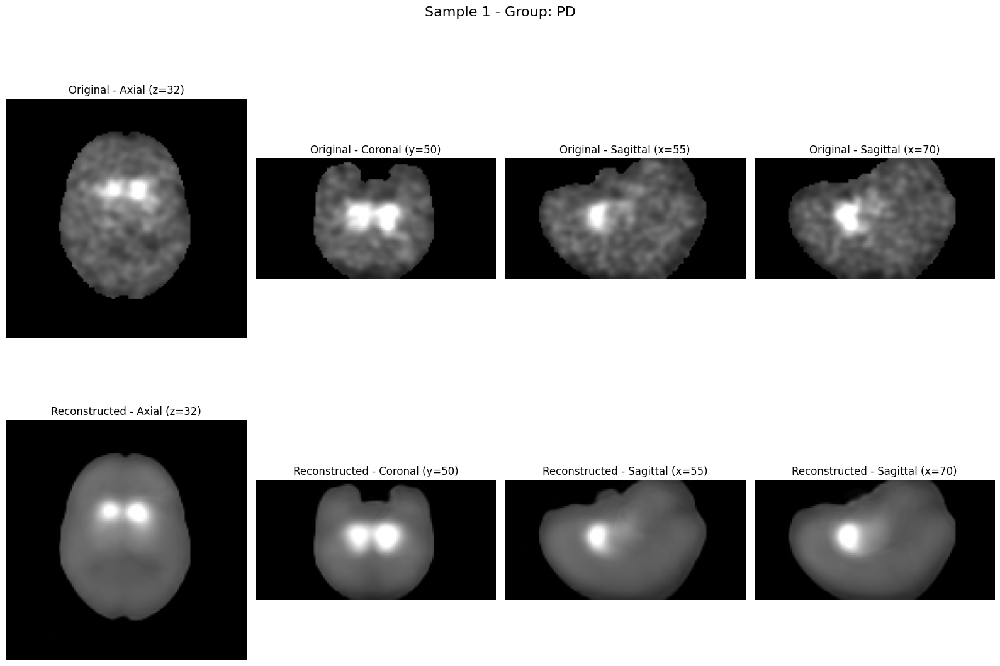

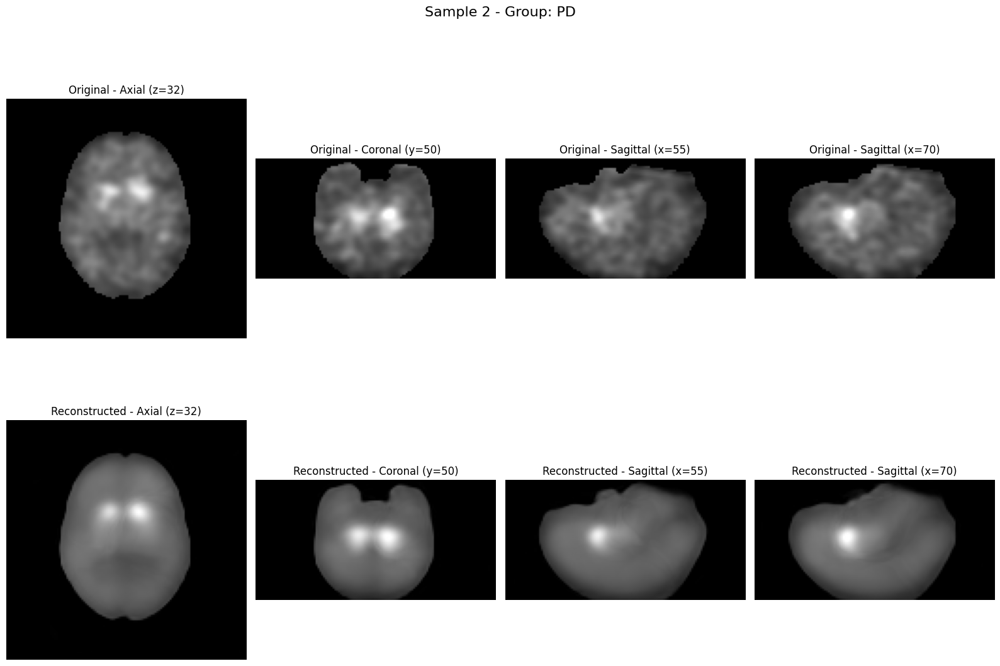

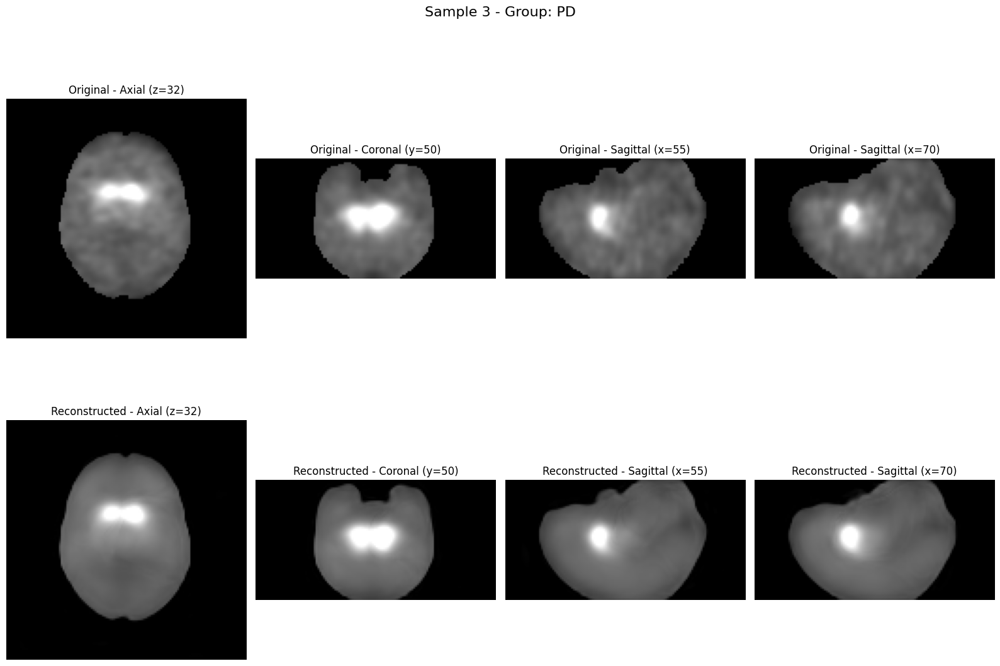

Computing metrics: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████| 298/298 [00:17<00:00, 16.65it/s]



Reconstruction Error Metrics:
Overall MSE: 0.004912
Overall RMSE: 0.070084

Reconstruction Error by Group:
PD:
  MSE: 0.004771 ± 0.001935
  RMSE: 0.069069
Control:
  MSE: 0.005803 ± 0.001633
  RMSE: 0.076178
SWEDD:
  MSE: 0.005631 ± 0.003176
  RMSE: 0.075043


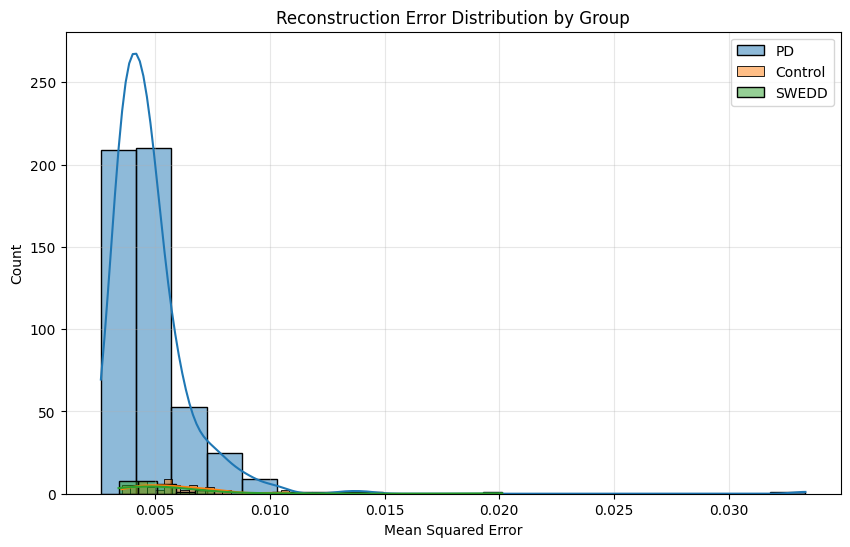

In [22]:

# Load model and metadata
model, metadata = load_trained_model('checkpoints', 'autoencoder_test_ld256', latent_dim=256)

# Plot training history
plot_training_history(metadata)

# Visualize reconstructions
visualize_reconstruction_samples(model, val_loader, num_samples=3)

# Compute reconstruction error
avg_mse, error_by_label = compute_reconstruction_error(model, val_loader)

#### latent space

Extracting latent vectors:  33%|█████████████████████████████████▌                                                                   | 99/298 [00:06<00:12, 16.41it/s]


Computing t-SNE projection...


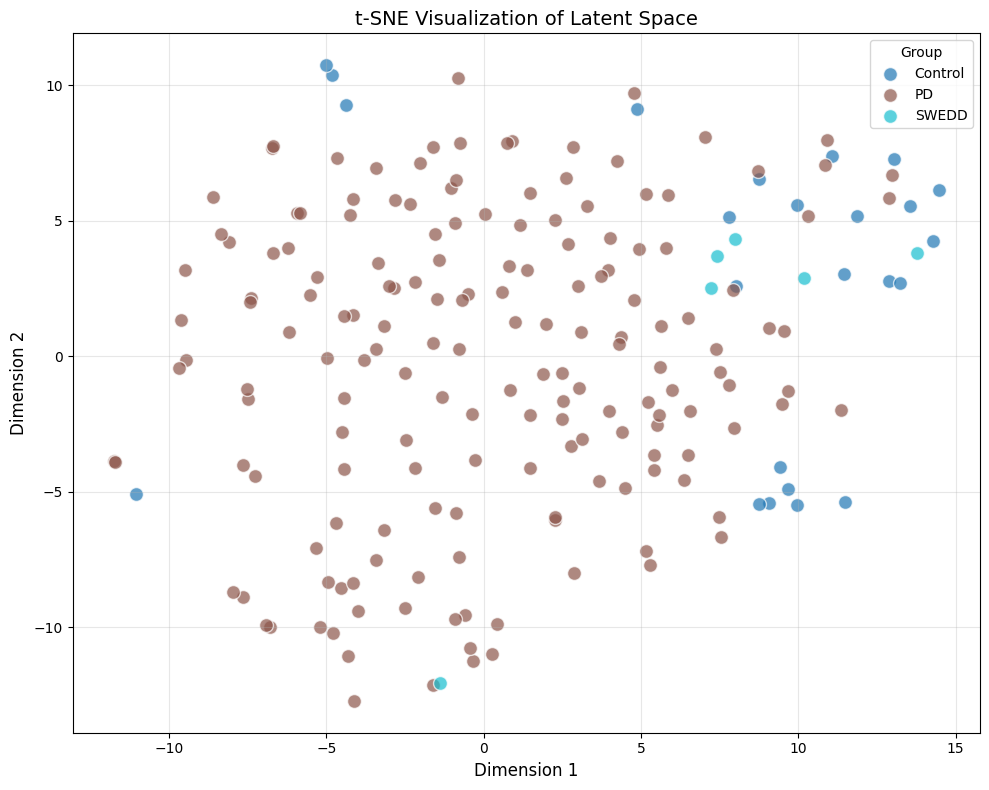

Computing PCA projection...


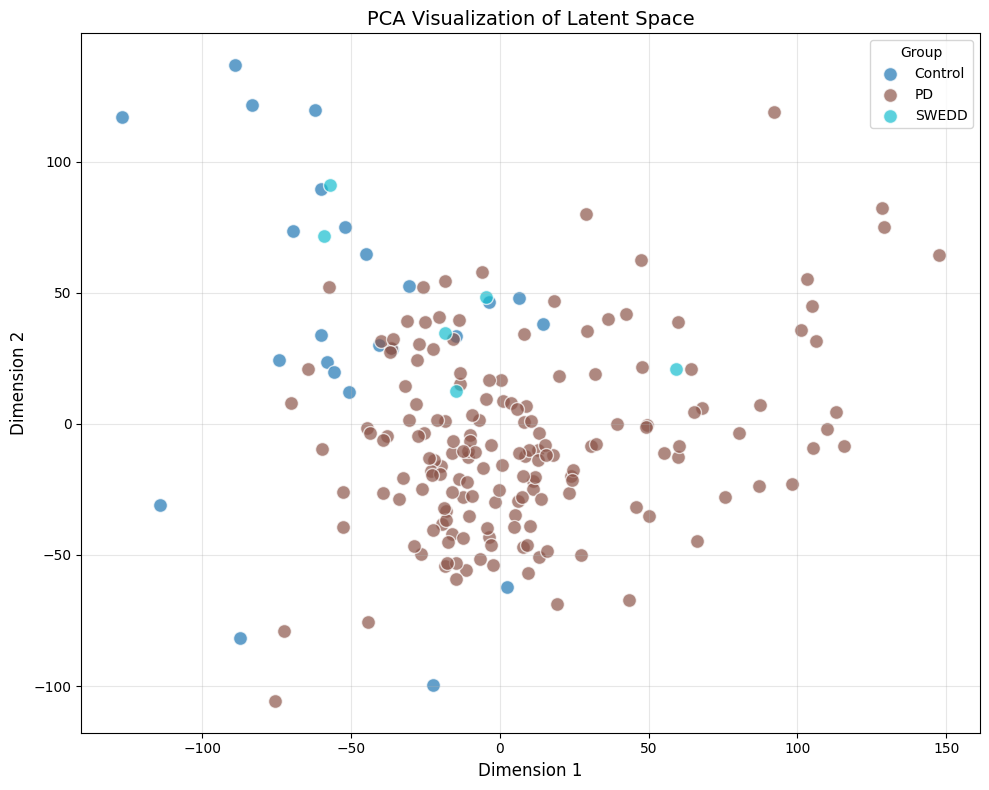

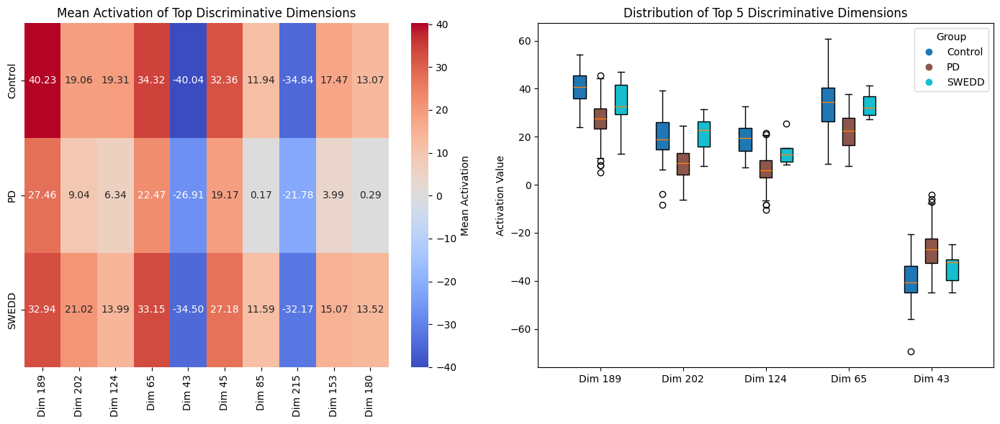

Finding outliers: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 298/298 [00:17<00:00, 16.66it/s]



Outlier Analysis:
Mean error: 0.004912
Error standard deviation: 0.002011
Outlier threshold: 0.009940
Found 10 outliers out of 596 samples (1.68%)


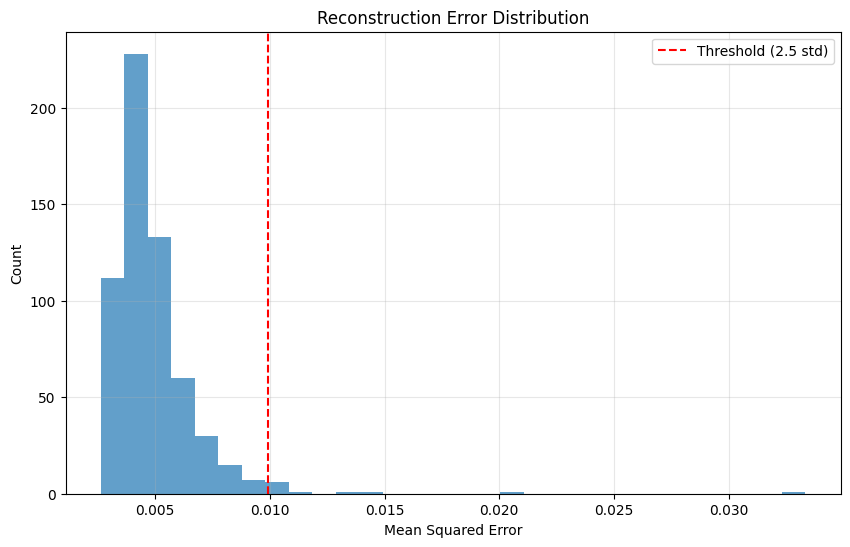

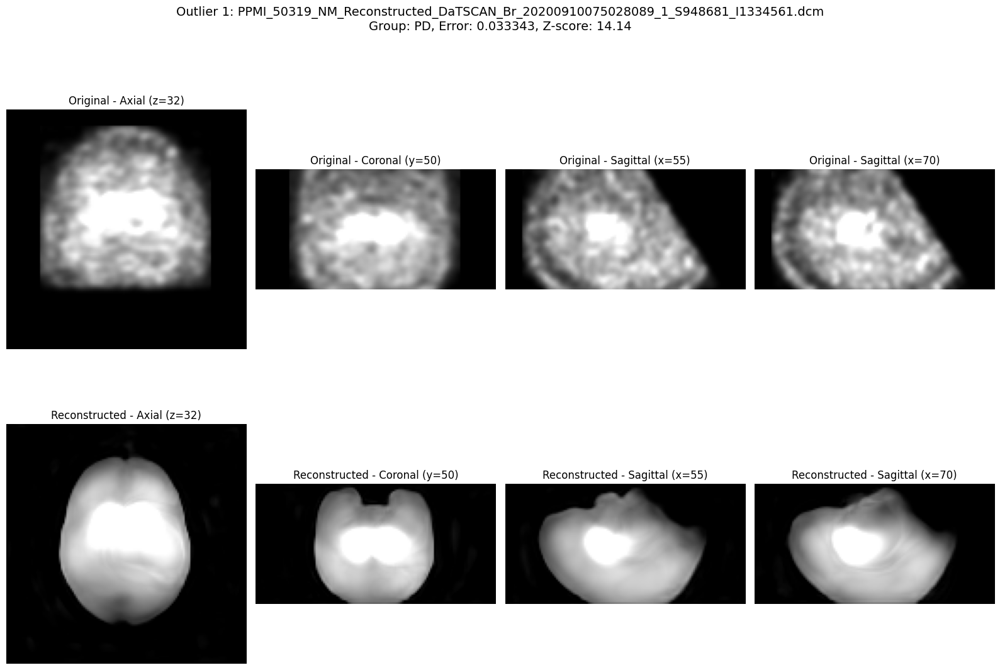

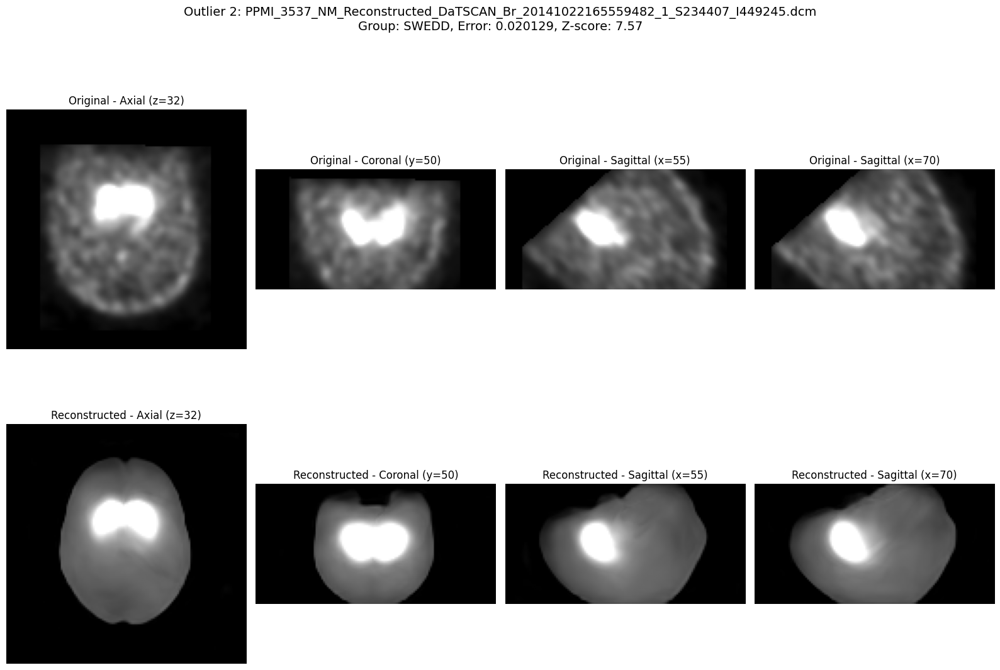

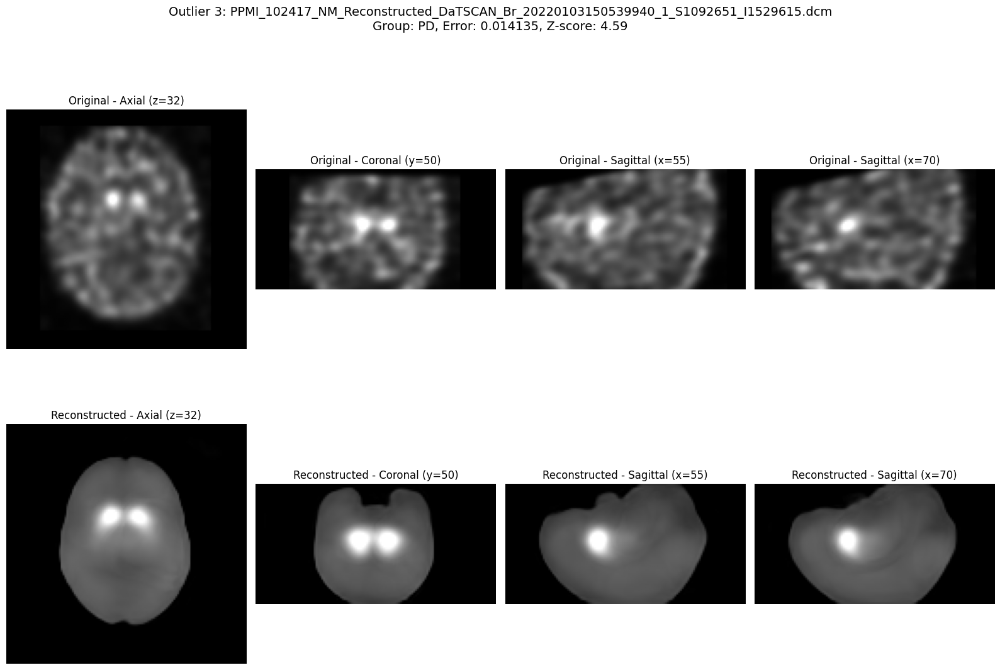

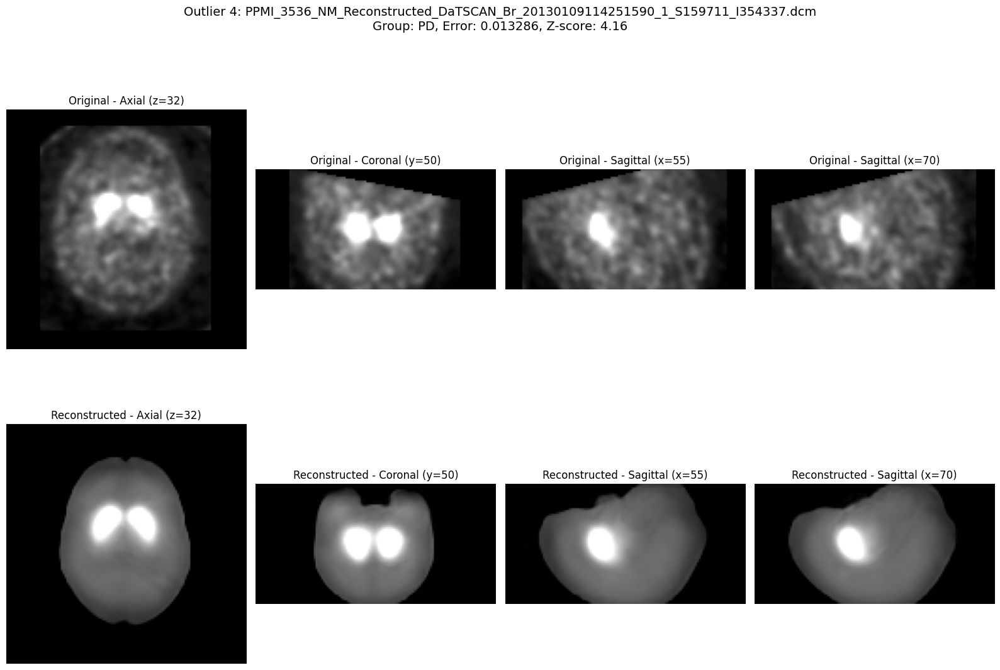

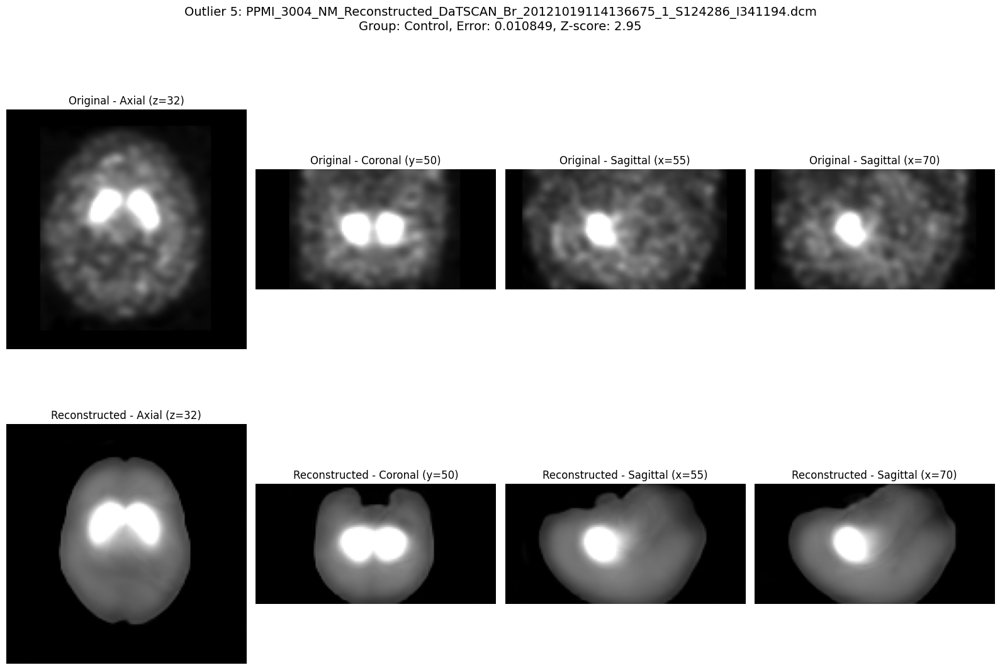

In [27]:
# Extract and visualize latent space
latent_vectors, labels, paths = extract_latent_vectors(model, val_loader, max_samples=200)
reduced_vecs = visualize_latent_space(latent_vectors, labels, method='tsne')
reduced_vecs = visualize_latent_space(latent_vectors, labels, method='pca')

# Analyze latent dimensions
top_dims = plot_latent_dimension_activation(latent_vectors, labels)

# Find and visualize outliers
outliers, all_errors, all_paths, all_labels = find_outliers(model, val_loader, threshold_std=2.5)
visualize_outliers(model, outliers)

#### Dimensions

### Architecture comparison experiment

#### Argument parser

In [34]:
def parse_args_dict(args_dict):
    parser = argparse.ArgumentParser()
    for key, value in args_dict.items():
        parser.add_argument(f"--{key}", default=value)
    return parser.parse_args([])

#### Experiment

In [35]:
print("Running architecture comparison experiment...")
args = parse_args_dict({
    "experiment": "architecture",
    "data_dir": "data/Images",
    "mask_path": "data/masks/rmask_ICV.nii",
    "epochs": 10,
    "batch_size": 4,
    "seed": 42,
    "output_dir": "output/Experiments",
    "device": str(torch.device("cuda" if torch.cuda.is_available() else "cpu"))
})
run_experiments(args)

Running architecture comparison experiment...
2025-09-18 07:57:25,301 - INFO - experiment_runner - Using device: cuda
2025-09-18 07:57:25,320 - INFO - experiment_runner - Preparing data...

Training set distribution:
label
PD         2035
Control     235
SWEDD       110
Name: count, dtype: int64

Validation set distribution:
label
PD         510
Control     59
SWEDD       27
Name: count, dtype: int64
Using on-demand data loading strategy (lighter on memory but slower)
✅ Brain mask loaded successfully
✅ All 2380 file paths are valid
✅ Brain mask loaded successfully
✅ All 596 file paths are valid
2025-09-18 07:58:02,906 - INFO - experiment_runner - Data preparation complete. Train: 2380, Val: 596
2025-09-18 07:58:02,907 - INFO - experiment_runner - Running architecture comparison experiment...
2025-09-18 07:58:02,909 - INFO - experiment_runner - Training direct model...
2025-09-18 07:58:02,954 - INFO - experiment_tracker - Initialized experiment tracker: AE_direct_20250918_075802


[INFO] Register count_convNd() for <class 'torch.nn.modules.conv.Conv3d'>.
[INFO] Register count_normalization() for <class 'torch.nn.modules.batchnorm.BatchNorm3d'>.
[INFO] Register zero_ops() for <class 'torch.nn.modules.activation.ReLU'>.
[INFO] Register zero_ops() for <class 'torch.nn.modules.container.Sequential'>.
[INFO] Register count_upsample() for <class 'torch.nn.modules.upsampling.Upsample'>.
2025-09-18 07:58:02,988 - INFO - experiment_tracker - Recorded model info: 5,292,497 parameters (5,292,497 trainable)
2025-09-18 07:59:41,189 - INFO - experiment_runner - Epoch 0: train_loss=0.011803, val_loss=0.006959
2025-09-18 08:01:11,421 - INFO - experiment_runner - Epoch 1: train_loss=0.006627, val_loss=0.005630
2025-09-18 08:02:40,431 - INFO - experiment_runner - Epoch 2: train_loss=0.005808, val_loss=0.005923
2025-09-18 08:04:11,012 - INFO - experiment_runner - Epoch 3: train_loss=0.005370, val_loss=0.005018
2025-09-18 08:05:40,459 - INFO - experiment_runner - Epoch 4: train_los

[INFO] Register count_convNd() for <class 'torch.nn.modules.conv.Conv3d'>.
[INFO] Register count_normalization() for <class 'torch.nn.modules.batchnorm.BatchNorm3d'>.
[INFO] Register zero_ops() for <class 'torch.nn.modules.activation.ReLU'>.
[INFO] Register zero_ops() for <class 'torch.nn.modules.container.Sequential'>.
[INFO] Register count_upsample() for <class 'torch.nn.modules.upsampling.Upsample'>.
2025-09-18 08:13:15,618 - INFO - experiment_tracker - Recorded model info: 1,324,329 parameters (1,324,329 trainable)
2025-09-18 08:14:43,992 - INFO - experiment_runner - Epoch 0: train_loss=0.013726, val_loss=0.009120
2025-09-18 08:16:12,578 - INFO - experiment_runner - Epoch 1: train_loss=0.007088, val_loss=0.006285
2025-09-18 08:17:40,622 - INFO - experiment_runner - Epoch 2: train_loss=0.006162, val_loss=0.005772
2025-09-18 08:19:07,686 - INFO - experiment_runner - Epoch 3: train_loss=0.005650, val_loss=0.005169
2025-09-18 08:20:34,758 - INFO - experiment_runner - Epoch 4: train_los

KeyboardInterrupt: 

### Latent space optimization experiment

In [ ]:
print("Running advanced VAE configurations experiment...")
args = parse_args_dict({
    "experiment": "advanced_vae",
    "data_dir": "data/Images",
    "mask_path": "data/masks/rmask_ICV.nii",
    "epochs": 10,
    "batch_size": 4,
    "seed": 42,
    "output_dir": "output/Experiments",
    "device": str(torch.device("cuda" if torch.cuda.is_available() else "cpu"))
})
run_experiments(args)

### Visualize and compare experiment results

In [ ]:
# Find experiment directories
architecture_dirs = sorted(glob.glob("output/Experiments/Architecture/*"))
latent_dirs = sorted(glob.glob("output/Experiments/LatentSpace/*"))

# Create plotter
plotter = ExperimentPlotter(output_dir="output/Visualizations")

In [ ]:
# Plot architecture comparison
if architecture_dirs:
    plotter.plot_experiment_comparison(
        architecture_dirs,
        metric="val_loss",
        title="Architecture Comparison - Validation Loss",
        save_path="output/Visualizations/architecture_val_loss_comparison.png"
    )
    
    # Create summary reports
    for exp_dir in architecture_dirs:
        plotter.create_summary_report(
            exp_dir,
            output_path=Path("output/Reports") / f"{Path(exp_dir).name}_summary.md"
        )

print("Visualization complete. Check output/Visualizations and output/Reports directories.")

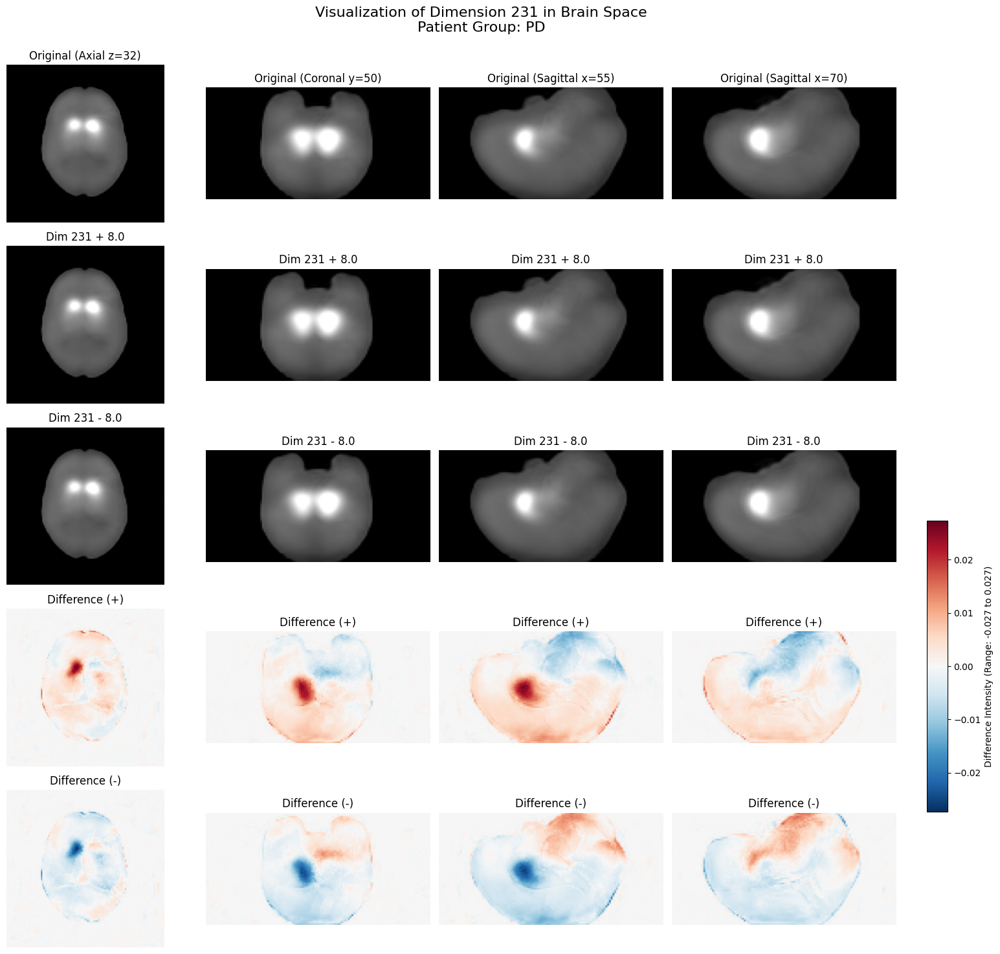

Brain Intensity Scale: 0 to 3
Difference Map Scale: -0.027 to 0.027

Exploring Dimension 231

Analyzing dimension 231 for group: PD (first pass)


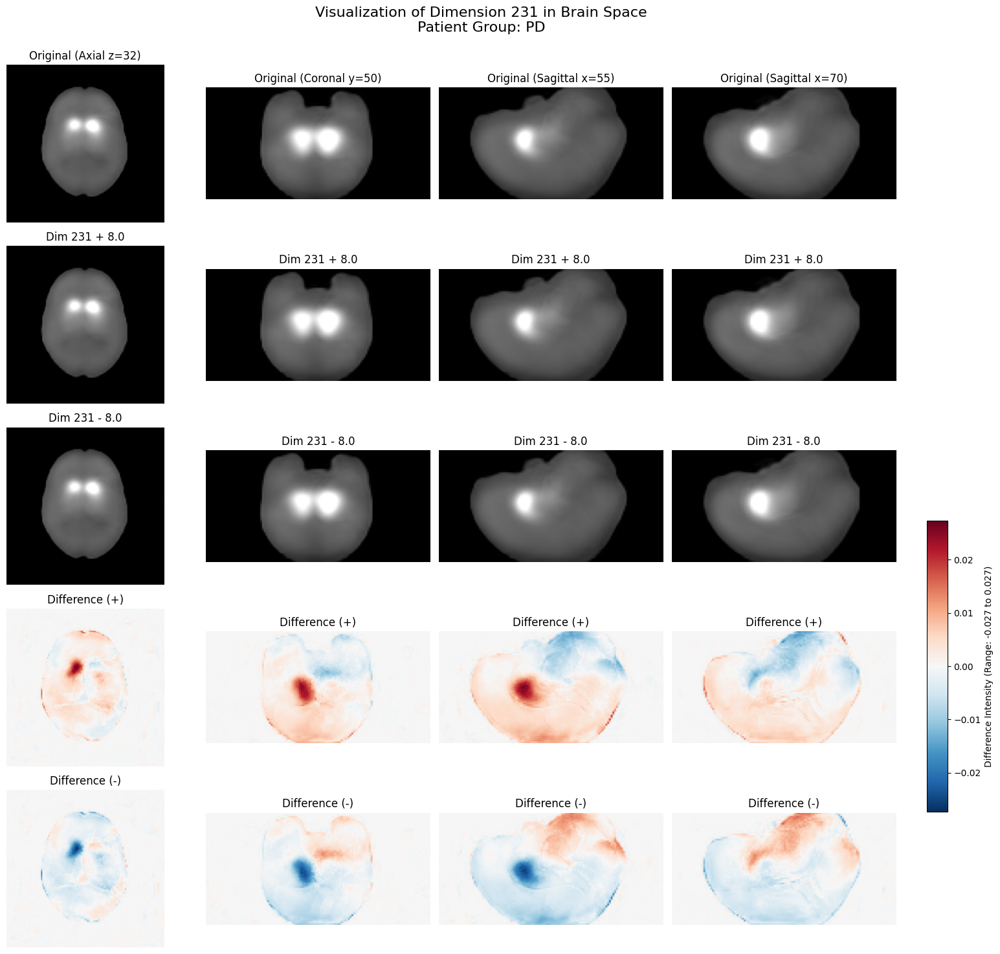

Brain Intensity Scale: 0 to 3
Difference Map Scale: -0.027 to 0.027

Analyzing dimension 231 for group: Control (first pass)


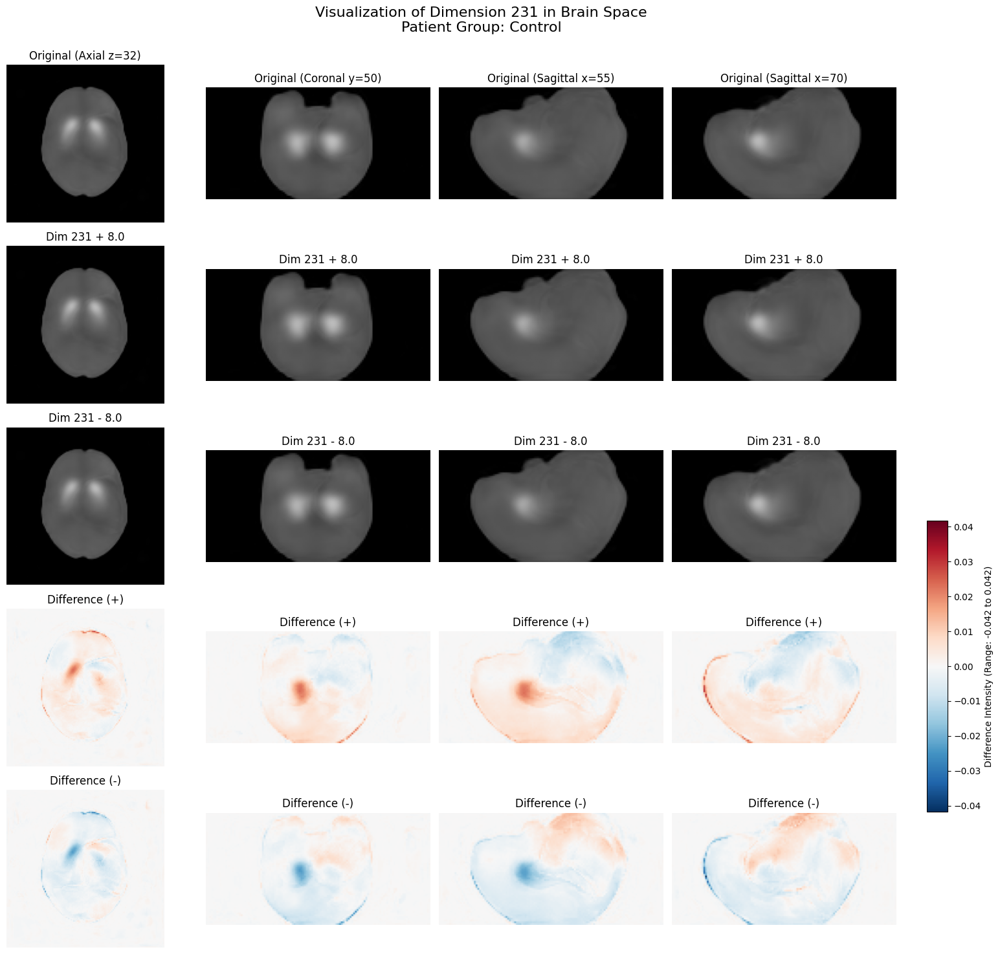

Brain Intensity Scale: 0 to 3
Difference Map Scale: -0.042 to 0.042

Analyzing dimension 231 for group: SWEDD (first pass)


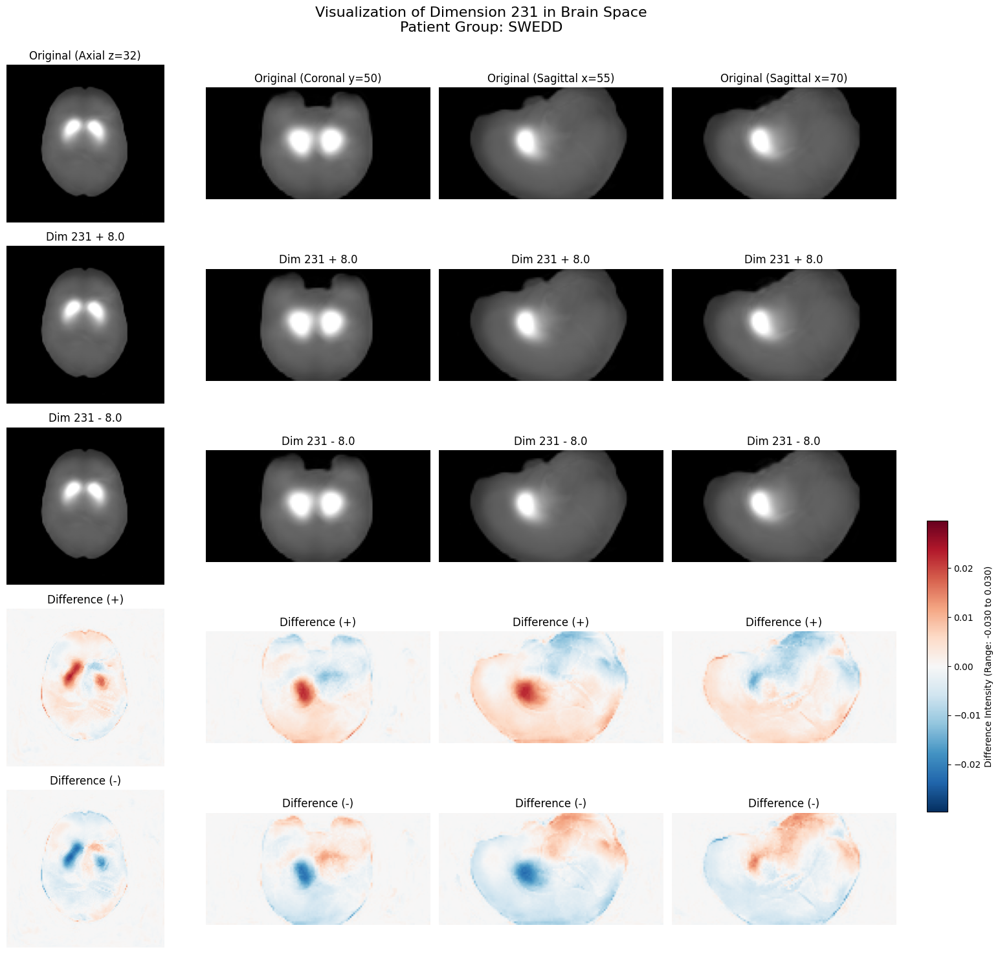

Brain Intensity Scale: 0 to 3
Difference Map Scale: -0.030 to 0.030

Global difference range for dimension 231 across all groups: -0.042 to 0.042

Exploring Dimension 94

Analyzing dimension 94 for group: PD (first pass)


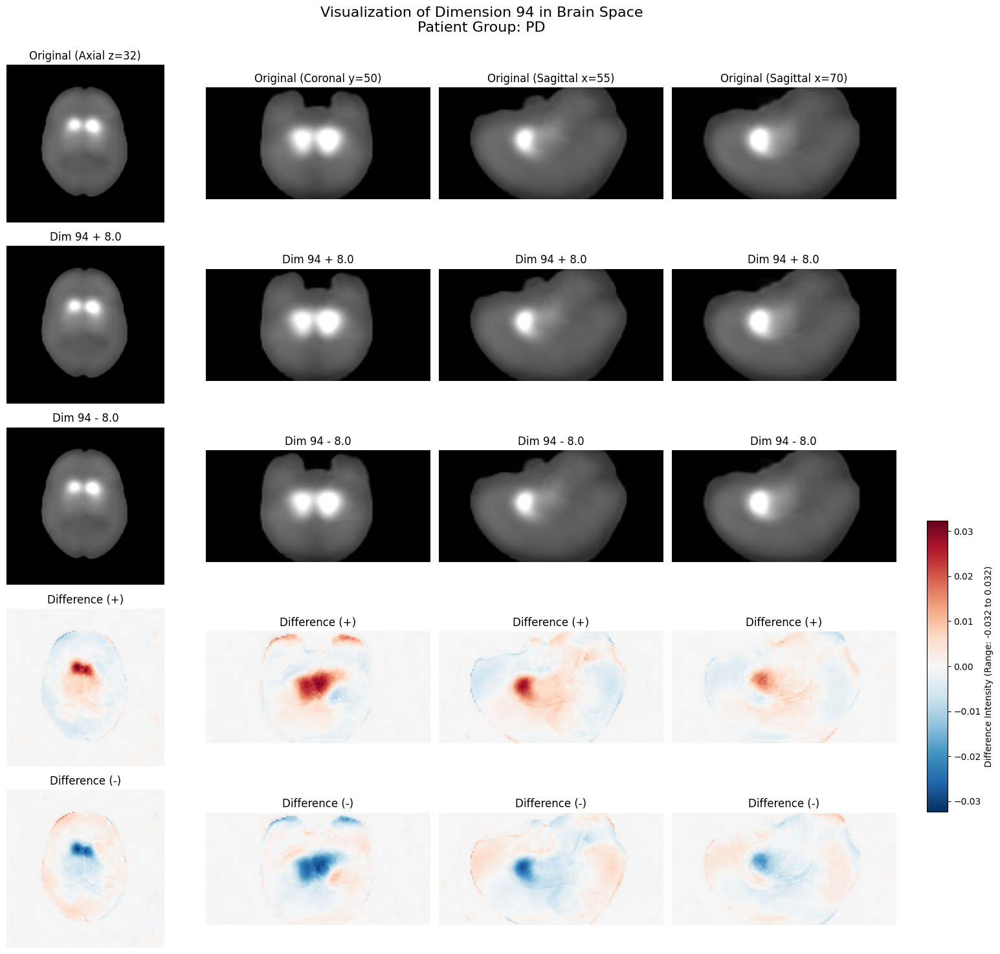

Brain Intensity Scale: 0 to 3
Difference Map Scale: -0.032 to 0.032

Analyzing dimension 94 for group: Control (first pass)


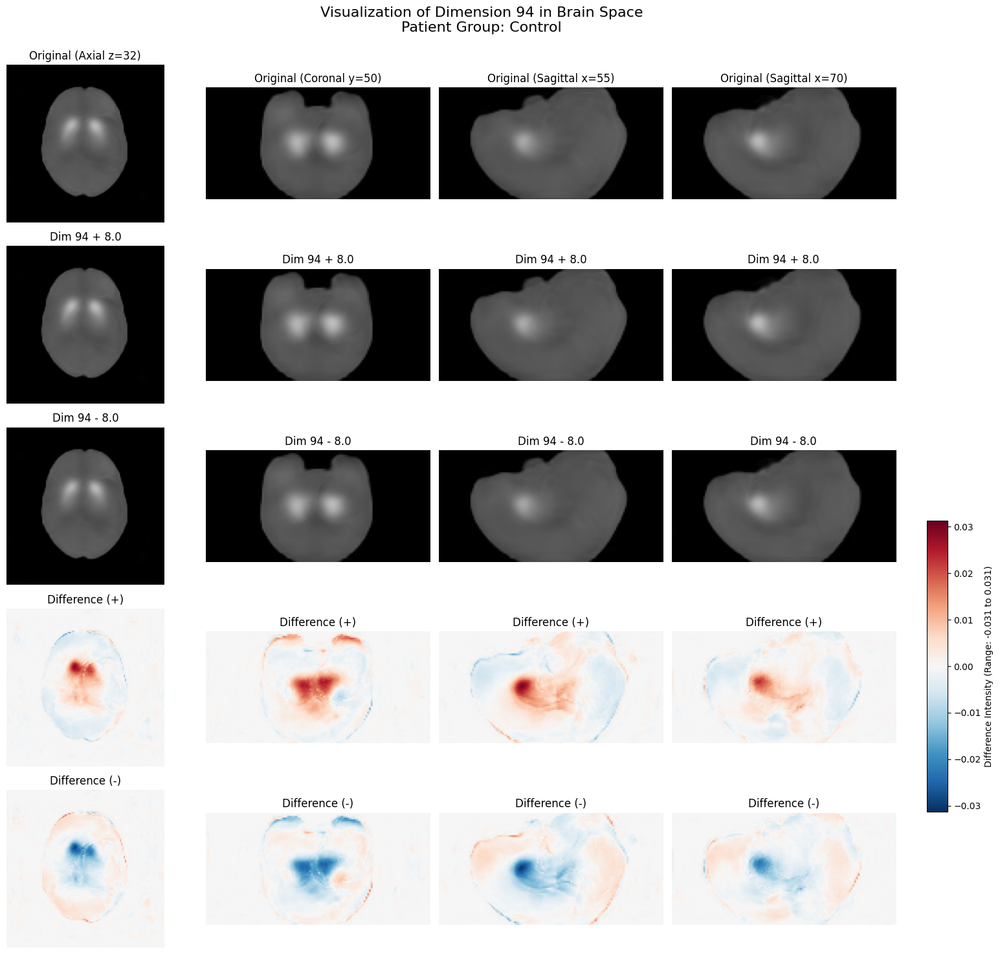

Brain Intensity Scale: 0 to 3
Difference Map Scale: -0.031 to 0.031

Analyzing dimension 94 for group: SWEDD (first pass)


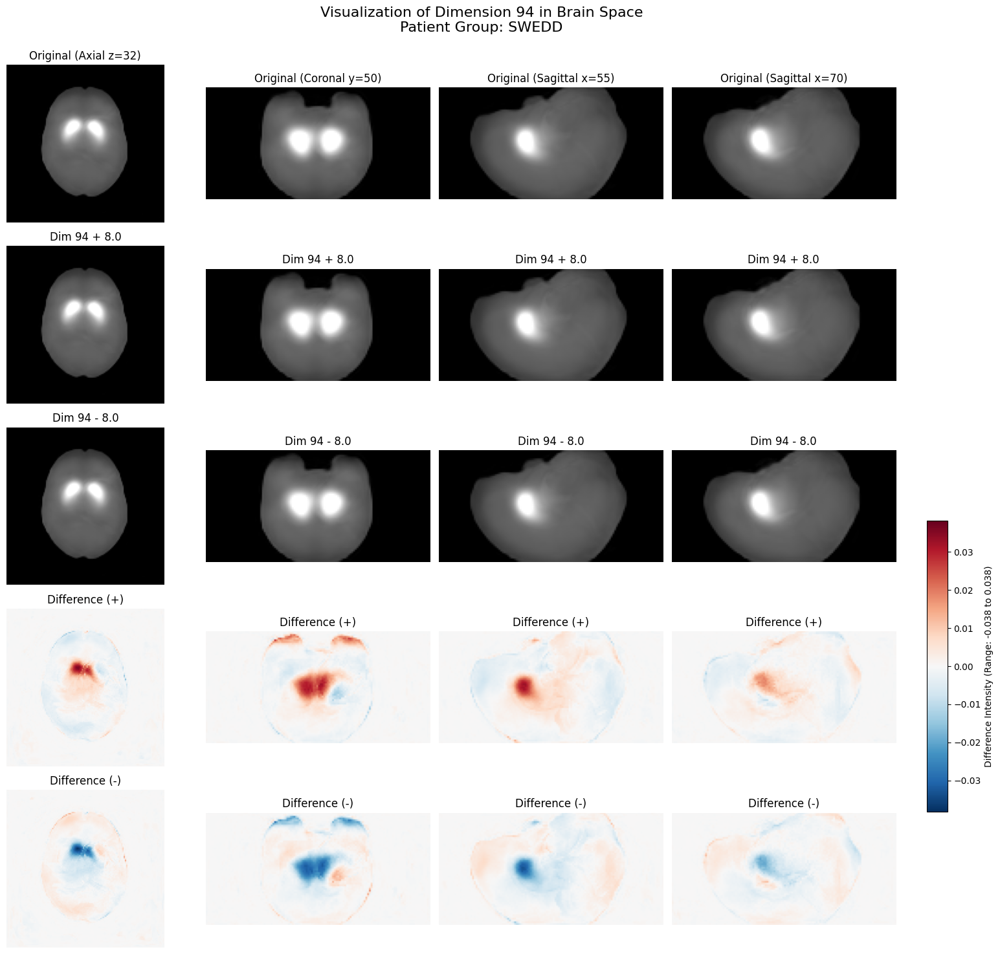

Brain Intensity Scale: 0 to 3
Difference Map Scale: -0.038 to 0.038

Global difference range for dimension 94 across all groups: -0.038 to 0.038

Exploring Dimension 154

Analyzing dimension 154 for group: PD (first pass)


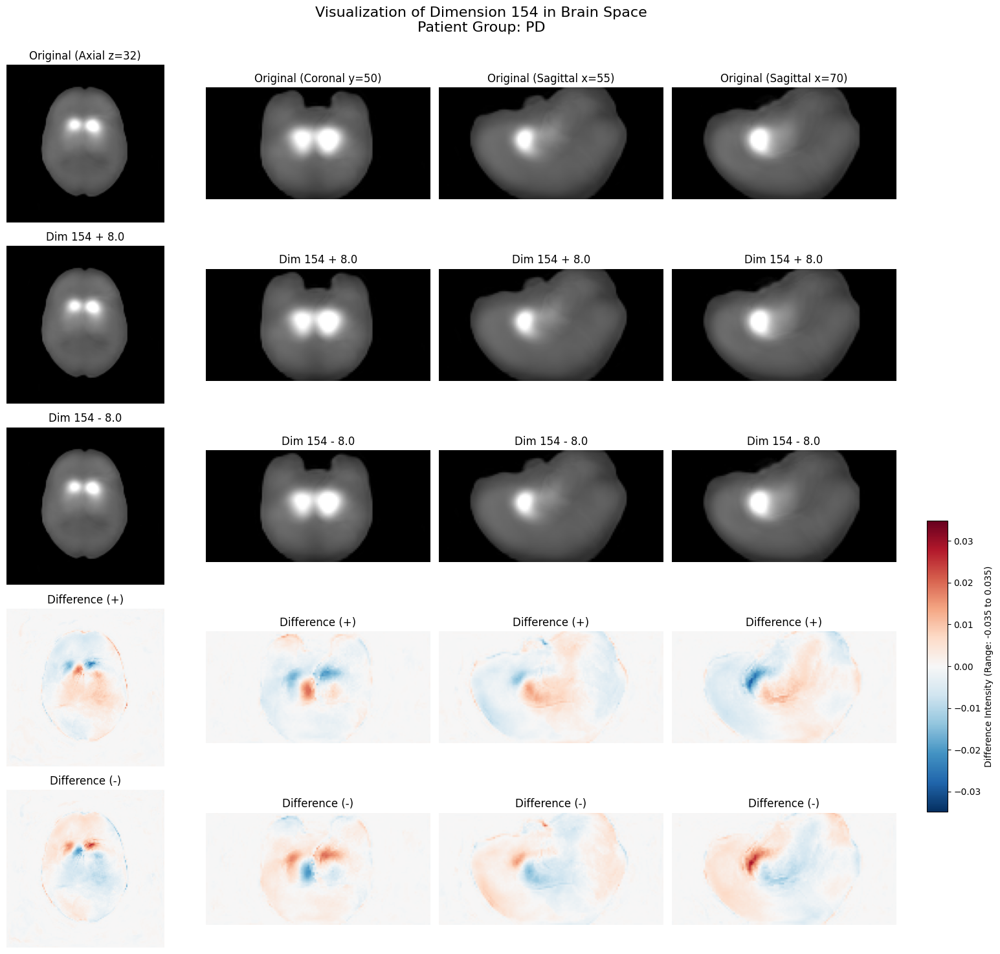

Brain Intensity Scale: 0 to 3
Difference Map Scale: -0.035 to 0.035

Analyzing dimension 154 for group: Control (first pass)


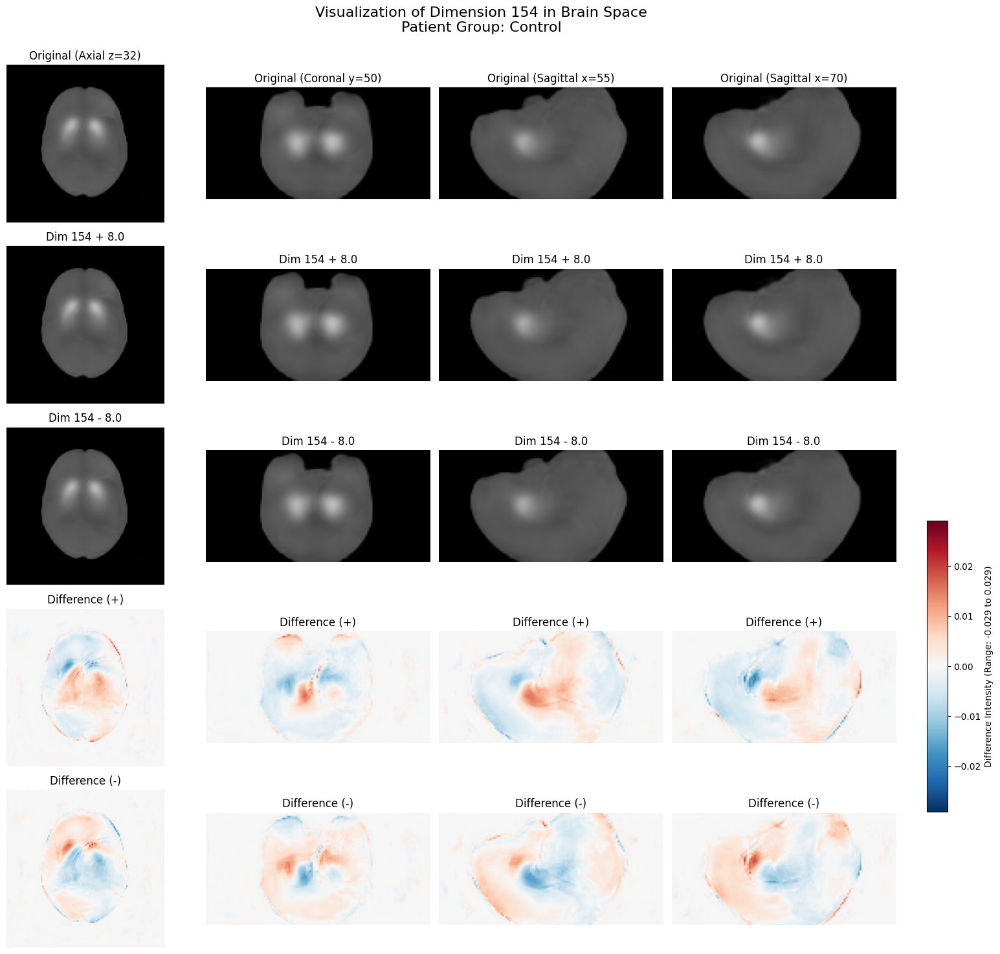

Brain Intensity Scale: 0 to 3
Difference Map Scale: -0.029 to 0.029

Analyzing dimension 154 for group: SWEDD (first pass)


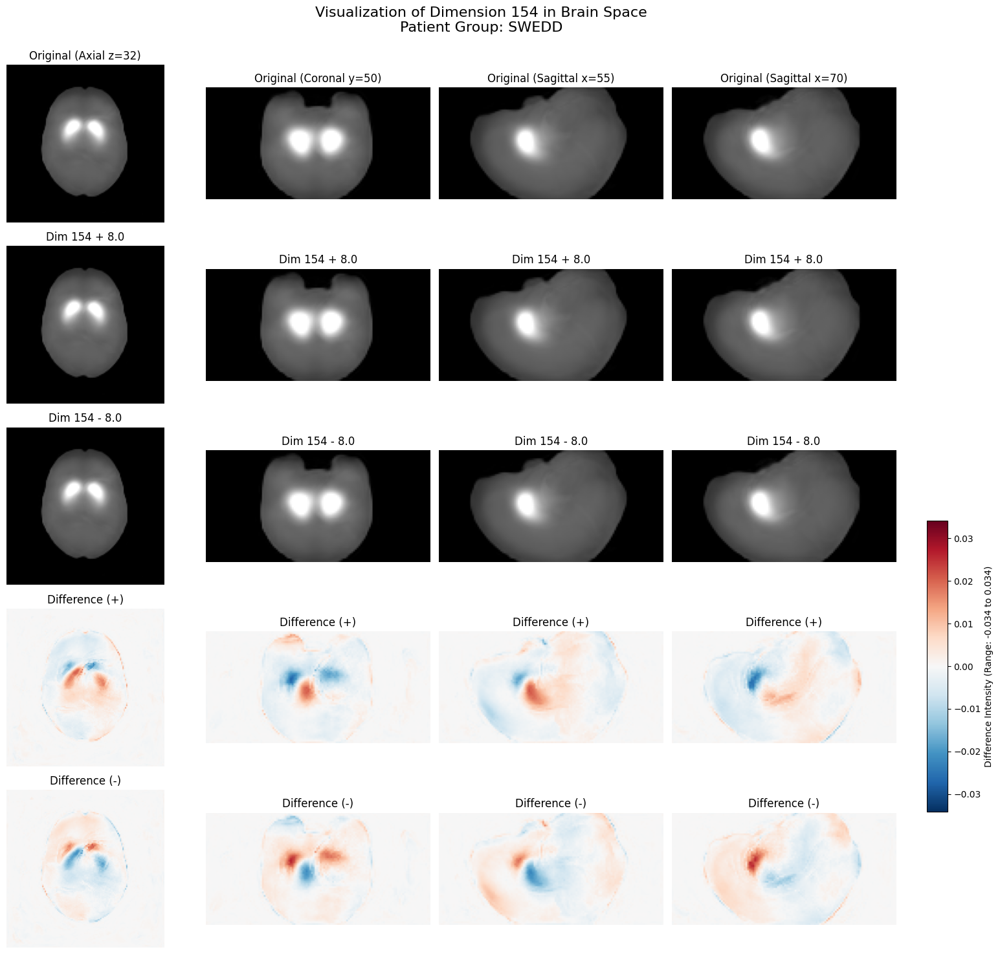

Brain Intensity Scale: 0 to 3
Difference Map Scale: -0.034 to 0.034

Global difference range for dimension 154 across all groups: -0.035 to 0.035


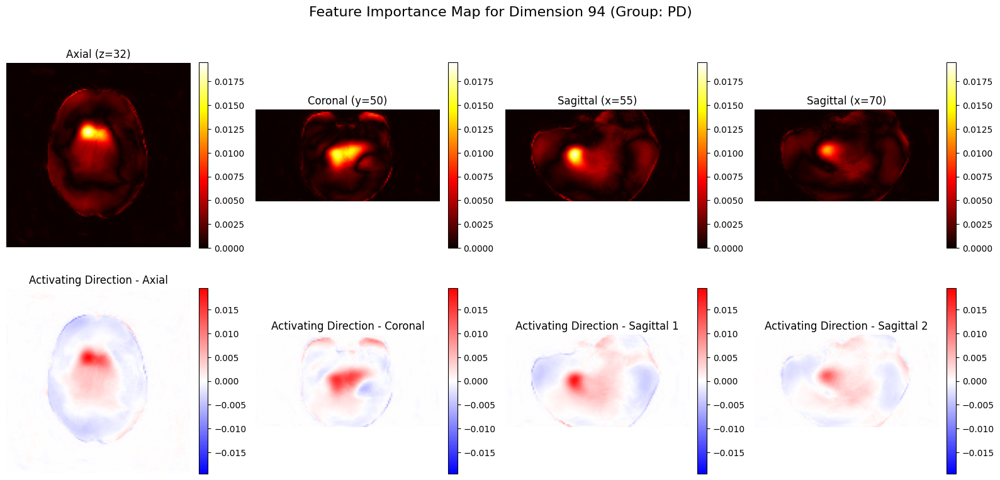

Importance Map Scale: 0 to 0.019
Activation Map Scale: -0.020 to 0.020


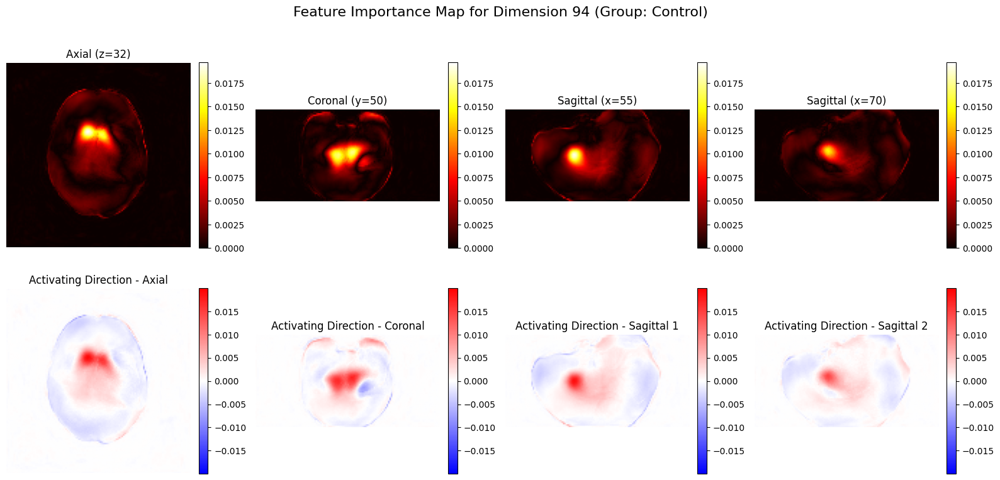

Importance Map Scale: 0 to 0.020
Activation Map Scale: -0.020 to 0.020


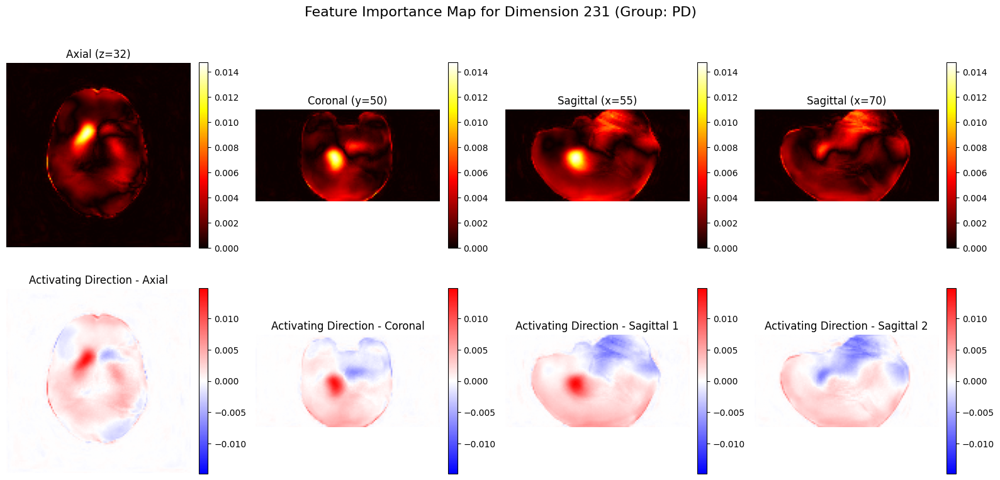

Importance Map Scale: 0 to 0.015
Activation Map Scale: -0.015 to 0.015


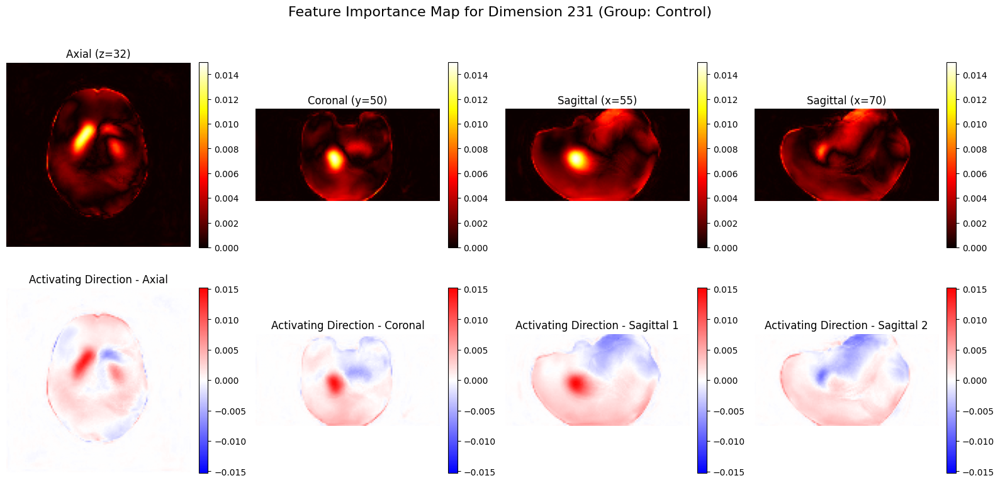

Importance Map Scale: 0 to 0.015
Activation Map Scale: -0.015 to 0.015


(array([[[1.30770350e-04, 4.25055623e-06, 2.18607493e-05, ...,
          6.62200182e-05, 1.13090871e-04, 1.71028078e-05],
         [1.61304313e-04, 7.41906479e-05, 1.09340253e-04, ...,
          1.32209068e-04, 1.38870615e-04, 1.48471445e-04],
         [5.61103225e-05, 7.98434048e-05, 9.35345815e-06, ...,
          2.12175393e-04, 2.02272087e-04, 1.94358829e-04],
         ...,
         [3.30325216e-04, 1.88662860e-04, 1.92984182e-04, ...,
          1.97410573e-05, 3.87765467e-05, 1.34728853e-05],
         [2.12614235e-04, 2.59858381e-04, 9.16607678e-05, ...,
          4.26679835e-05, 6.38529673e-05, 3.71068709e-05],
         [1.06588006e-04, 7.64764845e-05, 1.06289981e-05, ...,
          2.41890557e-05, 3.72312934e-05, 2.91492797e-05]],
 
        [[1.00009143e-04, 7.16634095e-05, 5.16131513e-05, ...,
          7.14510679e-06, 1.70096013e-04, 1.02030484e-04],
         [8.76367121e-05, 2.29337064e-04, 4.48450446e-05, ...,
          8.01958086e-05, 1.39944997e-04, 1.80701900e-04],
       

In [30]:
# Load your trained model first
model, metadata = load_trained_model('checkpoints', 'autoencoder_test_ld256', latent_dim=256)

# Example 1: Visualize one specific important dimension for a specific group
# This shows what happens when you increase or decrease this dimension
visualize_latent_dimension(model, val_loader, dimension_idx=231, alpha=8.0, group='PD')

# Example 2: Compare the same dimension across different patient groups
# Uncomment to see how the same dimension affects different groups
explore_top_dimensions(model, val_loader, dimensions=[231, 94, 154], groups=['PD', 'Control', 'SWEDD'])

# Example 3: Generate a feature importance map by aggregating across multiple samples
# This shows which brain regions are most affected by this dimension
generate_feature_importance_map(model, val_loader, dimension_idx=94, group='PD', num_samples=10)
generate_feature_importance_map(model, val_loader, dimension_idx=94, group='Control', num_samples=10)
generate_feature_importance_map(model, val_loader, dimension_idx=231, group='PD', num_samples=10)
generate_feature_importance_map(model, val_loader, dimension_idx=231, group='Control', num_samples=10)

## 2. Variational Autoencoder (VAE)

### Model Setup

In [ ]:
test_vae(batch_size=2, latent_dim=256)

### Training

In [ ]:
# Create the VAE model
model = VAE(latent_dim=256)

# Create VAE configuration
config = VAEConfig(
    latent_dim=256,
    batch_size=8,
    accumulation_steps=8,        # Effective batch size = 64
    learning_rate=2e-5,
    epochs=300,
    beta=0.0005,                 # Reduced from 0.005 to 0.0005 (10x smaller)
    beta_warmup_steps=10000,      # Increased from 2000 to 10000
    early_stopping_patience=20,
    use_mixed_precision=True,
    num_workers=4,
    model_name="vae_model_v2"    # New model name to avoid overwriting
)

# Train the VAE
results = train_vae(model, train_loader, val_loader, config)

In [ ]:
# Extra test - Vae v6
# Create the VAE model
model = VAE(latent_dim=256)

# Create VAE configuration
config = VAEConfig(
    latent_dim=256,
    batch_size=8,
    accumulation_steps=8,        # Effective batch size = 64
    learning_rate=2e-5,
    epochs=300,
    beta=0.001,                 # Reduced from 0.005 to 0.0005 (10x smaller)
    beta_warmup_steps=2000,      # Increased from 2000 to 10000
    early_stopping_patience=20,
    use_mixed_precision=True,
    num_workers=4,
    model_name="vae_model_v6"    # New model name to avoid overwriting
)

# Train the VAE
results = train_vae(model, train_loader, val_loader, config)

### Evaluation and Result Visualization

In [ ]:
# Run VAE evaluation
try:
    print("=== Starting VAE Evaluation ===")
    
    # Load trained VAE model
    print("\nLoading trained VAE model...")
    vae_model, vae_metadata = load_trained_vae('checkpoints', 'vae_model_v2', latent_dim=256)
    
    # 1. Plot training history
    print("\nPlotting VAE training history...")
    plot_vae_training_history(vae_metadata)
    
    # 2. Visualize reconstructions
    print("\nVisualizing VAE reconstructions...")
    visualize_vae_reconstructions(vae_model, val_loader, num_samples=3)
    
    # 3. Extract latent vectors from VAE
    print("\nExtracting latent vectors from VAE...")
    latent_means, latent_logvars, labels, paths = extract_vae_latent_vectors(vae_model, val_loader, max_samples=200)
    
    # 4. Visualize latent space with t-SNE and PCA
    print("\nVisualizing latent space with t-SNE...")
    tsne_result = visualize_latent_space(latent_means, labels, method='tsne')
    
    print("\nVisualizing latent space with PCA...")
    pca_result = visualize_latent_space(latent_means, labels, method='pca')
    
    # 5. Analyze discriminative dimensions
    print("\nAnalyzing discriminative dimensions in latent space...")
    top_dims = plot_latent_dimension_activation(latent_means, labels)
    
    # 6. Compute and visualize reconstruction error
    print("\nComputing reconstruction error metrics...")
    avg_mse, error_by_label, kl_by_label = compute_reconstruction_error(vae_model, val_loader)
    
    # 7. Find and visualize outliers
    print("\nFinding and visualizing outliers...")
    outliers, all_errors, all_paths, all_labels = find_vae_outliers(vae_model, val_loader, threshold_std=2.5)
    visualize_vae_outliers(vae_model, outliers)
    
    # 8. Visualize latent dimensions in brain space
    print("\nVisualizing discriminative dimensions in brain space...")
    for dim in [63, 34, 123]:  # Specified dimensions
        visualize_vae_latent_dimension(vae_model, val_loader, dimension_idx=dim, alpha=5.0)
    
    print("\nVAE Evaluation completed successfully!")

except Exception as e:
    print(f"Error during VAE evaluation: {str(e)}")
    import traceback
    traceback.print_exc()

In [ ]:
# Run the VAE feature importance and uncertainty visualization
try:
    print("=== Starting VAE Feature Importance and Uncertainty Analysis ===")

    # Load trained VAE model (using the load_trained_vae function from Cell 18)
    print("\nLoading trained VAE model...")
    vae_model, _ = load_trained_vae('checkpoints', 'vae_model_v2', latent_dim=256)

    # 1. Generate feature importance maps for specified dimensions
    print("\nGenerating feature importance maps...")
    important_dims = [63, 34, 123]  # The dimensions specified by the user

    for dim in important_dims:
        print(f"\nAnalyzing dimension {dim}...")

        # For PD group
        print(f"Feature map for dimension {dim} - PD group")
        importance_map_pd, _, _ = generate_vae_feature_importance_map(
            vae_model, val_loader, dimension_idx=dim, group='PD', num_samples=8)

        # For Control group
        print(f"Feature map for dimension {dim} - Control group")
        importance_map_control, _, _ = generate_vae_feature_importance_map(
            vae_model, val_loader, dimension_idx=dim, group='Control', num_samples=8)

    # 2. Visualize uncertainty in VAE reconstructions
    print("\nVisualizing VAE reconstruction uncertainty...")

    # For a single sample (PD)
    print("Single sample uncertainty visualization - PD")
    recon_mean_pd, recon_std_pd = visualize_vae_uncertainty(
        vae_model, val_loader, group='PD')

    # For a single sample (Control)
    print("Single sample uncertainty visualization - Control")
    recon_mean_control, recon_std_control = visualize_vae_uncertainty(
        vae_model, val_loader, group='Control')

    # 3. Generate full brain uncertainty maps
    print("\nGenerating full brain uncertainty maps...")

    # For all samples
    print("Full brain uncertainty map - All groups")
    avg_uncertainty, high_uncertainty_mask = generate_full_brain_uncertainty_map(
        vae_model, val_loader, num_samples=15)

    # 4. Compare uncertainty between groups
    print("\nComparing uncertainty between groups...")
    uncertainty_maps = compare_group_uncertainty(
        vae_model, val_loader, groups=['PD', 'Control', 'SWEDD'], num_samples=5)

    print("\nVAE Feature Importance and Uncertainty Analysis completed successfully!")

except Exception as e:
    print(f"Error during analysis: {str(e)}")
    import traceback
    traceback.print_exc()

# Performance Metrics & Visualizations

## KL Divergence

In [ ]:
# Cell 20: VAE Latent Space Analysis through KL Divergence

import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
import scipy.stats as stats
from tqdm import tqdm
import gc

def analyze_vae_kl_dimensions(model, dataloader, max_samples=150):
    """
    Analyze the KL divergence contribution of each dimension in the VAE latent space.
    
    KL divergence in VAEs measures how much the encoded distribution differs from
    the prior (standard normal) distribution. Dimensions with higher KL divergence
    are more "active" and potentially encode more meaningful features.
    """
    device = next(model.parameters()).device
    model.eval()
    
    # Storage for per-dimension KL and sample metadata
    kl_per_dim = []
    labels = []
    paths = []
    
    sample_count = 0
    with torch.no_grad():
        for batch in tqdm(dataloader, desc="Analyzing KL divergence per dimension"):
            volumes = batch['volume'].to(device)
            batch_labels = batch['label']
            batch_paths = batch['path']
            
            # Encode samples to get mu and log_var
            mu, log_var = model.encode(volumes)
            
            # Calculate KL divergence per dimension: 0.5 * (mu^2 + exp(log_var) - log_var - 1)
            kl_dims = 0.5 * (mu.pow(2) + log_var.exp() - log_var - 1)
            
            # Store results
            kl_per_dim.append(kl_dims.cpu().numpy())
            labels.extend(batch_labels)
            paths.extend(batch_paths)
            
            sample_count += volumes.shape[0]
            
            # Memory cleanup
            del volumes, mu, log_var, kl_dims
            torch.cuda.empty_cache()
            
            if sample_count >= max_samples:
                break
    
    # Stack arrays and trim to max_samples if needed
    kl_per_dim = np.vstack(kl_per_dim)
    if max_samples and len(labels) > max_samples:
        kl_per_dim = kl_per_dim[:max_samples]
        labels = labels[:max_samples]
        paths = paths[:max_samples]
    
    # Analyze overall KL divergence per dimension
    mean_kl_per_dim = np.mean(kl_per_dim, axis=0)
    
    # Find most active dimensions (highest KL)
    top_dims_idx = np.argsort(mean_kl_per_dim)[-20:][::-1]
    top_dims_kl = mean_kl_per_dim[top_dims_idx]
    
    # Plot overall KL per dimension (sorted)
    plt.figure(figsize=(14, 6))
    plt.subplot(1, 2, 1)
    plt.bar(range(len(mean_kl_per_dim)), sorted(mean_kl_per_dim, reverse=True))
    plt.axhline(y=np.mean(mean_kl_per_dim), color='r', linestyle='--', label=f'Mean KL: {np.mean(mean_kl_per_dim):.4f}')
    plt.title('KL Divergence per Dimension (Sorted)')
    plt.xlabel('Dimension Index (Sorted)')
    plt.ylabel('Mean KL Divergence')
    plt.grid(alpha=0.3)
    plt.legend()
    
    # Plot top 20 dimensions with actual indices
    plt.subplot(1, 2, 2)
    plt.bar(top_dims_idx, top_dims_kl)
    plt.title('Top 20 Most Active Dimensions')
    plt.xlabel('Dimension Index')
    plt.ylabel('Mean KL Divergence')
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()
    
    # Analyze distribution of top dimensions across patient groups
    print(f"\nAnalyzing top 5 most active dimensions across patient groups:")
    
    # Get unique labels
    unique_labels = list(set(labels))
    
    # Prepare data for violin plots
    top5_dims = top_dims_idx[:5]
    
    plt.figure(figsize=(15, 8))
    for i, dim in enumerate(top5_dims):
        plt.subplot(1, 5, i+1)
        
        # Create a dataframe for this dimension
        dim_df = pd.DataFrame({
            'KL': kl_per_dim[:, dim],
            'Group': labels
        })
        
        # Create violin plot
        sns.violinplot(x='Group', y='KL', data=dim_df, palette='viridis')
        plt.title(f'Dimension {dim}')
        plt.ylabel('KL Divergence' if i == 0 else '')
        plt.grid(alpha=0.3)
        
        # Add ANOVA p-value to see if groups are significantly different
        groups_data = [dim_df[dim_df['Group'] == group]['KL'].values for group in unique_labels]
        f_val, p_val = stats.f_oneway(*groups_data)
        plt.annotate(f'p={p_val:.4f}', xy=(0.5, 0.9), xycoords='axes fraction', ha='center')
    
    plt.tight_layout()
    plt.show()
    
    # Test predictive power of top dimensions using a simple classifier
    print("\nTesting predictive power of top KL dimensions:")
    
    # Prepare train/test split (70/30)
    np.random.seed(42)
    indices = np.random.permutation(len(labels))
    train_idx, test_idx = indices[:int(0.7*len(indices))], indices[int(0.7*len(indices)):]
    
    # Convert labels to numeric for the classifier
    label_map = {label: i for i, label in enumerate(unique_labels)}
    y = np.array([label_map[label] for label in labels])
    
    # Train a random forest on different sets of dimensions
    for n_dims in [5, 10, 20, 50, 100]:
        if n_dims <= len(top_dims_idx):
            # Get top n dimensions
            selected_dims = top_dims_idx[:n_dims]
            X_selected = kl_per_dim[:, selected_dims]
            
            # Train model
            clf = RandomForestClassifier(n_estimators=100, random_state=42)
            clf.fit(X_selected[train_idx], y[train_idx])
            
            # Test model
            y_pred = clf.predict(X_selected[test_idx])
            accuracy = accuracy_score(y[test_idx], y_pred)
            
            print(f"Accuracy using top {n_dims} KL dimensions: {accuracy:.4f}")
            
            # Feature importance
            if n_dims <= 20:  # Only show for smaller sets
                importances = clf.feature_importances_
                indices = np.argsort(importances)[::-1]
                
                print("  Top 5 most important dimensions:")
                for i in range(min(5, n_dims)):
                    print(f"    Dim {selected_dims[indices[i]]}: {importances[indices[i]]:.4f}")
    
    return kl_per_dim, top_dims_idx, labels, paths

# Load the trained VAE model from previous cells
print("Loading trained VAE model...")
# Using the load_trained_vae function from Cell 18
vae_model, _ = load_trained_vae('checkpoints', 'vae_model_v2', latent_dim=256)

# Analyze VAE KL divergence per dimension
print("\nAnalyzing VAE latent dimensions through KL divergence...")
kl_per_dim, top_dims, labels, paths = analyze_vae_kl_dimensions(
    vae_model, val_loader, max_samples=150)

print("KL Divergence Analysis completed!")


Testing predictive power of top KL dimensions:
Accuracy using top 5 KL dimensions: 0.8222
  Top 5 most important dimensions:
    Dim 87: 0.2259
    Dim 134: 0.2082
    Dim 170: 0.1969
    Dim 239: 0.1872
    Dim 5: 0.1818
Accuracy using top 10 KL dimensions: 0.8222
  Top 5 most important dimensions:
    Dim 131: 0.1447
    Dim 190: 0.1441
    Dim 87: 0.1340
    Dim 5: 0.1056
    Dim 191: 0.1043
Accuracy using top 20 KL dimensions: 0.8667
  Top 5 most important dimensions:
    Dim 169: 0.1131
    Dim 47: 0.1088
    Dim 131: 0.0731
    Dim 107: 0.0633
    Dim 5: 0.0612
KL Divergence Analysis completed!


In [ ]:
# Cell 21: Visualization of Top KL Dimensions in Brain Space

# Now let's visualize what the top dimensions represent in the brain space
print("Visualizing top KL dimensions in brain space...")

# Select the top 3 dimensions with highest KL divergence
top_3_dims = top_dims[:3]
print(f"Analyzing dimensions: {top_3_dims}")

# For each dimension, visualize its effect on reconstruction
for dim_idx in top_3_dims:
    print(f"\nVisualizing dimension {dim_idx}...")
    
    # Use the existing function from Cell 15
    visualize_vae_latent_dimension(vae_model, val_loader, dimension_idx=dim_idx, alpha=5.0)
    
    # Generate feature importance map
    print(f"Generating feature importance map for dimension {dim_idx}")
    for group in ['PD', 'Control']:
        generate_vae_feature_importance_map(
            vae_model, val_loader, dimension_idx=dim_idx, group=group, num_samples=8)

print("Top dimensions visualization completed!")

In [ ]:
# Cell 22: Analysis of Latent Space Distributions and Alpha Values

import torch
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm

# Function to analyze autoencoder
def analyze_ae_alpha(ae_model, dataloader, alpha_value=8.0, max_samples=200):
    """Calculate how many standard deviations alpha represents for AE dimensions"""
    device = next(ae_model.parameters()).device
    ae_model.eval()
    
    print(f"Analyzing Autoencoder latent space (alpha = {alpha_value})...")
    
    # Storage for latent vectors
    latent_vectors = []
    
    # Extract latent vectors
    with torch.no_grad():
        sample_count = 0
        for batch in tqdm(dataloader, desc="Extracting AE latent vectors"):
            volumes = batch['volume'].to(device)
            
            # Get AE latent vectors
            z = ae_model.encode(volumes)
            
            # Store results
            latent_vectors.append(z.cpu().numpy())
            
            # Update counter and check limit
            sample_count += len(volumes)
            if sample_count >= max_samples:
                break
                
            # Memory cleanup
            del volumes, z
            torch.cuda.empty_cache()
    
    # Stack arrays
    latent_vectors = np.vstack(latent_vectors)
    print(f"Collected {latent_vectors.shape[0]} samples with {latent_vectors.shape[1]} dimensions")
    
    # Calculate statistics
    dim_stds = np.std(latent_vectors, axis=0)
    alpha_in_std_devs = alpha_value / dim_stds
    
    # Print statistics
    print(f"\nAutoencoder Latent Space Statistics:")
    print(f"  Alpha value: {alpha_value}")
    print(f"  Mean standard deviation: {np.mean(dim_stds):.4f}")
    print(f"  Alpha in std devs: mean = {np.mean(alpha_in_std_devs):.2f}, min = {np.min(alpha_in_std_devs):.2f}, max = {np.max(alpha_in_std_devs):.2f}")
    
    # Create histogram
    plt.figure(figsize=(10, 6))
    plt.hist(alpha_in_std_devs, bins=30, color='#A1CAF1')
    plt.axvline(x=1, color='r', linestyle='--', label='1 std dev')
    plt.axvline(x=2, color='r', linestyle=':', label='2 std devs')
    plt.axvline(x=3, color='r', linestyle='-.', label='3 std devs')
    plt.xlabel(f'Alpha ({alpha_value}) in Standard Deviations', fontsize=12)
    plt.ylabel('Count of Dimensions', fontsize=12)
    plt.title('Autoencoder: How Many Standard Deviations Does Alpha Represent?', fontsize=14)
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()
    
    return latent_vectors, dim_stds, alpha_in_std_devs

# Function to analyze VAE
def analyze_vae_alpha(vae_model, dataloader, alpha_value=5.0, max_samples=200):
    """Calculate how many standard deviations alpha represents for VAE dimensions"""
    device = next(vae_model.parameters()).device
    vae_model.eval()
    
    print(f"Analyzing VAE latent space (alpha = {alpha_value})...")
    
    # Storage for latent vectors
    latent_means = []
    
    # Extract latent vectors
    with torch.no_grad():
        sample_count = 0
        for batch in tqdm(dataloader, desc="Extracting VAE latent vectors"):
            volumes = batch['volume'].to(device)
            
            # Get VAE latent vectors - return is (mu, log_var)
            mu, _ = vae_model.encode(volumes)
            
            # Store results
            latent_means.append(mu.cpu().numpy())
            
            # Update counter and check limit
            sample_count += len(volumes)
            if sample_count >= max_samples:
                break
                
            # Memory cleanup
            del volumes, mu
            torch.cuda.empty_cache()
    
    # Stack arrays
    latent_means = np.vstack(latent_means)
    print(f"Collected {latent_means.shape[0]} samples with {latent_means.shape[1]} dimensions")
    
    # Calculate statistics
    dim_stds = np.std(latent_means, axis=0)
    alpha_in_std_devs = alpha_value / dim_stds
    
    # Print statistics
    print(f"\nVAE Latent Space Statistics:")
    print(f"  Alpha value: {alpha_value}")
    print(f"  Mean standard deviation: {np.mean(dim_stds):.4f}")
    print(f"  Alpha in std devs: mean = {np.mean(alpha_in_std_devs):.2f}, min = {np.min(alpha_in_std_devs):.2f}, max = {np.max(alpha_in_std_devs):.2f}")
    
    # Create histogram
    plt.figure(figsize=(10, 6))
    plt.hist(alpha_in_std_devs, bins=30, color='#F08080')
    plt.axvline(x=1, color='r', linestyle='--', label='1 std dev')
    plt.axvline(x=2, color='r', linestyle=':', label='2 std devs')
    plt.axvline(x=3, color='r', linestyle='-.', label='3 std devs')
    plt.xlabel(f'Alpha ({alpha_value}) in Standard Deviations', fontsize=12)
    plt.ylabel('Count of Dimensions', fontsize=12)
    plt.title('VAE: How Many Standard Deviations Does Alpha Represent?', fontsize=14)
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()
    
    return latent_means, dim_stds, alpha_in_std_devs

# Function to analyze specific dimensions
def analyze_specific_dimension(model, dataloader, dimension, is_vae=False, alpha_value=8.0, max_samples=200):
    """Analyze a specific latent dimension in detail"""
    device = next(model.parameters()).device
    model.eval()
    model_name = "VAE" if is_vae else "Autoencoder"
    
    print(f"Analyzing {model_name} dimension {dimension} (alpha = {alpha_value})...")
    
    # Storage for dimension values
    dim_values = []
    
    # Extract latent vectors
    with torch.no_grad():
        sample_count = 0
        for batch in tqdm(dataloader, desc=f"Extracting {model_name} dimension {dimension}"):
            volumes = batch['volume'].to(device)
            
            # Get latent vectors
            if is_vae:
                z, _ = model.encode(volumes)  # For VAE, get mean vectors
            else:
                z = model.encode(volumes)  # For AE, get latent vectors
            
            # Extract the specific dimension
            dim_values.extend(z[:, dimension].cpu().numpy())
            
            # Update counter and check limit
            sample_count += len(volumes)
            if sample_count >= max_samples:
                break
                
            # Memory cleanup
            del volumes, z
            torch.cuda.empty_cache()
    
    # Convert to numpy array
    dim_values = np.array(dim_values)
    
    # Calculate statistics
    dim_mean = np.mean(dim_values)
    dim_std = np.std(dim_values)
    
    # Print statistics
    print(f"\n{model_name} Dimension {dimension} Statistics:")
    print(f"  Mean: {dim_mean:.4f}")
    print(f"  Standard deviation: {dim_std:.4f}")
    print(f"  Alpha ({alpha_value}) in std devs: {alpha_value / dim_std:.2f}")
    
    # Create visualization
    plt.figure(figsize=(10, 6))
    
    # Plot histogram with KDE
    sns.histplot(dim_values, kde=True)
    
    # Add lines for mean and perturbations
    plt.axvline(x=dim_mean, color='r', linestyle='-', label='Mean')
    plt.axvline(x=dim_mean + alpha_value, color='g', linestyle='--', label=f'Mean + α ({alpha_value})')
    plt.axvline(x=dim_mean - alpha_value, color='b', linestyle='--', label=f'Mean - α ({alpha_value})')
    
    # Add lines for standard deviations
    for i in range(1, 4):
        plt.axvline(x=dim_mean + i*dim_std, color='k', linestyle=':', alpha=0.5, label=f'+{i} std' if i == 1 else None)
        plt.axvline(x=dim_mean - i*dim_std, color='k', linestyle=':', alpha=0.5, label=f'-{i} std' if i == 1 else None)
    
    plt.xlabel('Dimension Value', fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.title(f'{model_name} Dimension {dimension} Distribution\nAlpha={alpha_value} = {alpha_value/dim_std:.2f} std devs', fontsize=14)
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()
    
    return dim_values, dim_mean, dim_std

# Load the trained models (if not already loaded)
print("Loading trained models...")
ae_model, _ = load_trained_model('checkpoints', 'autoencoder_v1', latent_dim=256)
vae_model, _ = load_trained_vae('checkpoints', 'vae_model_v2', latent_dim=256)

# Analyze both models
print("\nAnalyzing alpha values in terms of standard deviations...")
ae_vectors, ae_stds, ae_alpha_in_stds = analyze_ae_alpha(ae_model, val_loader, alpha_value=8.0, max_samples=200)
vae_means, vae_stds, vae_alpha_in_stds = analyze_vae_alpha(vae_model, val_loader, alpha_value=5.0, max_samples=200)

# Analyze specific dimensions mentioned in the original code
print("\nAnalyzing specific dimensions of interest:")
for dim in [231, 94, 154]:  # Top dimensions analyzed in previous cells
    print(f"\nDimension {dim}:")
    analyze_specific_dimension(ae_model, val_loader, dim, is_vae=False, alpha_value=8.0, max_samples=200)
    analyze_specific_dimension(vae_model, val_loader, dim, is_vae=True, alpha_value=5.0, max_samples=200)

## Metadata Analysis with Latent Dimensions

In [ ]:
# Cell 23: Metadata Dimension Analysis with Improved Visualization

import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from tqdm import tqdm
import torch
import re
import scipy.stats as stats

def analyze_metadata_dimensions(ae_model, vae_model, dataloader, metadata_path="dicom_metadata.csv", max_samples=150):
    """
    Analyze how specific dimensions in the latent spaces correlate with metadata.
    """
    print("\nAnalyzing correlation between latent dimensions and metadata...")
    
    # Load metadata CSV
    if not os.path.exists(metadata_path):
        print(f"Error: Metadata file {metadata_path} not found!")
        return None
    
    # Load with proper type handling
    metadata_df = pd.read_csv(metadata_path)
    print(f"Loaded metadata with {len(metadata_df)} entries and columns: {metadata_df.columns.tolist()}")
    
    # Check data types and missing values
    print("\nData types in metadata:")
    print(metadata_df.dtypes)
    
    print("\nMissing values in metadata:")
    print(metadata_df.isnull().sum())
    
    # Extract latent vectors from models
    device = next(ae_model.parameters()).device
    ae_model.eval()
    vae_model.eval()
    
    sample_paths = []
    sample_labels = []
    ae_latent_vecs = []
    vae_latent_means = []
    
    with torch.no_grad():
        for batch in tqdm(dataloader, desc="Extracting latent vectors"):
            volumes = batch['volume'].to(device)
            batch_labels = batch['label']
            batch_paths = batch['path']
            
            # Get latent vectors
            ae_z = ae_model.encode(volumes)
            vae_mu, _ = vae_model.encode(volumes)
            
            # Store results
            ae_latent_vecs.append(ae_z.cpu().numpy())
            vae_latent_means.append(vae_mu.cpu().numpy())
            sample_paths.extend(batch_paths)
            sample_labels.extend(batch_labels)
            
            # Memory cleanup
            del volumes, ae_z, vae_mu
            torch.cuda.empty_cache()
            
            if len(sample_paths) >= max_samples:
                break
    
    # Stack arrays
    ae_latent_vecs = np.vstack(ae_latent_vecs)
    vae_latent_means = np.vstack(vae_latent_means)
    
    # Create dataframe with sample info
    sample_df = pd.DataFrame({
        'file_path': sample_paths,
        'group': sample_labels
    })
    
    # Normalize paths for matching
    sample_df['file_path_norm'] = sample_df['file_path'].apply(
        lambda x: os.path.basename(x.replace('\\', '/'))
    )
    metadata_df['file_path_norm'] = metadata_df['file_path'].apply(
        lambda x: os.path.basename(x.replace('\\', '/'))
    )
    
    # Extract patient IDs as a fallback matching strategy
    def extract_patient_id(path):
        path = path.replace('\\', '/')
        match = re.search(r'PPMI_(\d+)_', path)
        if match:
            return match.group(1)
        match = re.search(r'PPMI_Images_\w+/(\d+)/', path)
        if match:
            return match.group(1)
        return None
    
    sample_df['patient_id'] = sample_df['file_path'].apply(extract_patient_id)
    metadata_df['patient_id'] = metadata_df['file_path'].apply(extract_patient_id)
    
    # Try to match by filename first
    merged_df = pd.merge(sample_df, metadata_df, on='file_path_norm', how='inner', suffixes=('_sample', '_meta'))
    
    # If that doesn't work well, try matching by patient ID
    if len(merged_df) < 10:
        print("Filename matching failed, trying patient ID matching...")
        merged_df = pd.merge(sample_df, metadata_df, on='patient_id', how='inner', suffixes=('_sample', '_meta'))
    
    print(f"Successfully matched {len(merged_df)} samples with metadata")
    
    if len(merged_df) < 10:
        print("Error: Insufficient matches for analysis. Check file paths.")
        print("Sample patient IDs:", sample_df['patient_id'].dropna().unique()[:10])
        print("Metadata patient IDs:", metadata_df['patient_id'].dropna().unique()[:10])
        return None
    
    # Get indices of matched samples to extract latent vectors
    matched_indices = [sample_paths.index(path) for path in merged_df['file_path_sample']]
    ae_matched = ae_latent_vecs[matched_indices]
    vae_matched = vae_latent_means[matched_indices]
    
    # Analyze categorical metadata fields
    categorical_fields = ['PatientSex', 'StudyDescription', 'Manufacturer', 'ManufacturerModelName']
    
    # Results storage
    dimension_analysis = {
        'ae': {field: {} for field in categorical_fields},
        'vae': {field: {} for field in categorical_fields}
    }
    
    # Analyze each metadata field
    for field in categorical_fields:
        field_meta = field + '_meta' if field + '_meta' in merged_df.columns else field
        
        if field_meta not in merged_df.columns:
            print(f"Warning: Field '{field}' not found in metadata")
            continue
        
        print(f"\nAnalyzing field '{field}'...")
        
        # Check data type and handle properly
        print(f"Data type for {field_meta}: {merged_df[field_meta].dtype}")
        
        # Handle nulls and convert to string for consistent processing
        field_values = merged_df[field_meta].fillna('Unknown').astype(str).values
        
        # Now get unique values safely
        unique_values = np.unique(field_values)
        print(f"Unique values: {unique_values}")
        
        # Skip if less than 2 categories
        if len(unique_values) < 2:
            print(f"Skipping '{field}' - only one unique value found")
            continue
            
        # Count samples per category
        value_counts = pd.Series(field_values).value_counts()
        print(f"Counts per category: {dict(value_counts)}")
        
        # Skip categories with too few samples
        keep_values = value_counts[value_counts >= 5].index.tolist()
        if len(keep_values) < 2:
            print(f"Skipping '{field}' - insufficient samples per category")
            continue
            
        # Filter to keep only samples with sufficient category representation
        keep_mask = np.array([v in keep_values for v in field_values])
        if keep_mask.sum() < 10:
            print(f"Skipping '{field}' - insufficient samples after filtering")
            continue
            
        filtered_values = field_values[keep_mask]
        ae_filtered = ae_matched[keep_mask]
        vae_filtered = vae_matched[keep_mask]
        
        print(f"Analyzing with {len(filtered_values)} samples across {len(keep_values)} categories")
        
        # Calculate dimension scores
        ae_scores = np.zeros(ae_filtered.shape[1])
        vae_scores = np.zeros(vae_filtered.shape[1])
        ae_p_values = np.ones(ae_filtered.shape[1])
        vae_p_values = np.ones(vae_filtered.shape[1])
        
        # Convert categorical values to numeric for analysis
        value_map = {val: i for i, val in enumerate(keep_values)}
        y = np.array([value_map[val] for val in filtered_values])
        
        # DIMENSION SELECTION METHOD: 
        # Using ANOVA F-statistic to measure how well each dimension separates different categories
        for dim in range(ae_filtered.shape[1]):
            try:
                # Group data by category for ANOVA
                groups = [ae_filtered[filtered_values == val, dim] for val in keep_values]
                # Some groups might be empty or have only one sample
                if all(len(g) > 1 for g in groups):
                    f_val, p_val = stats.f_oneway(*groups)
                    ae_scores[dim] = f_val
                    ae_p_values[dim] = p_val
                else:
                    ae_scores[dim] = 0
                    ae_p_values[dim] = 1.0
            except Exception as e:
                print(f"Error analyzing AE dimension {dim}: {e}")
                ae_scores[dim] = 0
                ae_p_values[dim] = 1.0
        
        for dim in range(vae_filtered.shape[1]):
            try:
                groups = [vae_filtered[filtered_values == val, dim] for val in keep_values]
                if all(len(g) > 1 for g in groups):
                    f_val, p_val = stats.f_oneway(*groups)
                    vae_scores[dim] = f_val
                    vae_p_values[dim] = p_val
                else:
                    vae_scores[dim] = 0
                    vae_p_values[dim] = 1.0
            except Exception as e:
                print(f"Error analyzing VAE dimension {dim}: {e}")
                vae_scores[dim] = 0
                vae_p_values[dim] = 1.0
        
        # Find top dimensions (highest F-statistic and p < 0.05)
        ae_signif_dims = np.where(ae_p_values < 0.05)[0]
        vae_signif_dims = np.where(vae_p_values < 0.05)[0]
        
        ae_top_dims = ae_signif_dims[np.argsort(ae_scores[ae_signif_dims])[::-1][:10]]
        vae_top_dims = vae_signif_dims[np.argsort(vae_scores[vae_signif_dims])[::-1][:10]]
        
        print(f"\nTop 10 AE dimensions for {field}:")
        for i, dim in enumerate(ae_top_dims):
            print(f"  Dimension {dim}: F-statistic={ae_scores[dim]:.2f}, p-value={ae_p_values[dim]:.4f}")
        
        print(f"\nTop 10 VAE dimensions for {field}:")
        for i, dim in enumerate(vae_top_dims):
            print(f"  Dimension {dim}: F-statistic={vae_scores[dim]:.2f}, p-value={vae_p_values[dim]:.4f}")
        
        # Visualize top dimensions with separate plots for AE and VAE
        if len(ae_top_dims) > 0 or len(vae_top_dims) > 0:
            # Abbreviate labels if needed
            labels = []
            for val in keep_values:
                if len(val) > 20:  # If label is too long
                    shortened = val[:17] + "..."
                else:
                    shortened = val
                labels.append(shortened)
            
            # AE DIMENSIONS PLOT (if we have significant dimensions)
            if len(ae_top_dims) > 0:
                plt.figure(figsize=(20, 8))
                plt.suptitle(f"AE Dimensions Correlated with {field}", fontsize=18)
                
                # Plot up to 3 top AE dimensions
                for i, dim in enumerate(ae_top_dims[:3]):
                    if i < 3:  # Only plot first 3
                        plt.subplot(1, 3, i+1)
                        
                        # Create boxplot with clear labels (no colors)
                        data = []
                        for val in keep_values:
                            mask = filtered_values == val
                            data.append(ae_filtered[mask, dim])
                        
                        # Standard boxplot without colors
                        plt.boxplot(data)
                        
                        plt.title(f'AE Dimension {dim}', fontsize=14)
                        plt.ylabel('Dimension Value', fontsize=12)
                        
                        # Set x-ticks with increased spacing
                        plt.xticks(range(1, len(labels)+1), labels, rotation=90, fontsize=10)
                        plt.tick_params(axis='x', which='major', pad=15)  # Add padding for better readability
                        plt.grid(axis='y', alpha=0.3)
                
                # Ensure there's plenty of space
                plt.tight_layout()
                plt.subplots_adjust(bottom=0.4, wspace=0.3)
                plt.show()
            
            # VAE DIMENSIONS PLOT (if we have significant dimensions)
            if len(vae_top_dims) > 0:
                plt.figure(figsize=(20, 8))
                plt.suptitle(f"VAE Dimensions Correlated with {field}", fontsize=18)
                
                # Plot up to 3 top VAE dimensions
                for i, dim in enumerate(vae_top_dims[:3]):
                    if i < 3:  # Only plot first 3
                        plt.subplot(1, 3, i+1)
                        
                        # Create boxplot with clear labels (no colors)
                        data = []
                        for val in keep_values:
                            mask = filtered_values == val
                            data.append(vae_filtered[mask, dim])
                        
                        # Standard boxplot without colors
                        plt.boxplot(data)
                        
                        plt.title(f'VAE Dimension {dim}', fontsize=14)
                        plt.ylabel('Dimension Value', fontsize=12)
                        
                        # Set x-ticks with increased spacing
                        plt.xticks(range(1, len(labels)+1), labels, rotation=90, fontsize=10)
                        plt.tick_params(axis='x', which='major', pad=15)  # Add padding for better readability
                        plt.grid(axis='y', alpha=0.3)
                
                # Ensure there's plenty of space
                plt.tight_layout()
                plt.subplots_adjust(bottom=0.4, wspace=0.3)
                plt.show()
        
        # Store results
        dimension_analysis['ae'][field] = {
            'scores': ae_scores,
            'p_values': ae_p_values,
            'top_dims': ae_top_dims.tolist()
        }
        
        dimension_analysis['vae'][field] = {
            'scores': vae_scores,
            'p_values': vae_p_values,
            'top_dims': vae_top_dims.tolist()
        }
    
    return dimension_analysis

# Load both models
print("Loading trained models...")
ae_model, _ = load_trained_model('checkpoints', 'autoencoder_v1', latent_dim=256)
vae_model, _ = load_trained_vae('checkpoints', 'vae_model_v2', latent_dim=256)

# Run the dimension analysis
print("\nAnalyzing which dimensions correlate with metadata...")
dimension_results = analyze_metadata_dimensions(
    ae_model, vae_model, val_loader, 
    metadata_path="dicom_metadata.csv", max_samples=150)

print("\nDimension analysis completed!")

In [ ]:
# Cell 24: Metadata Dimension Analysis with Debug Output

import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from tqdm import tqdm
import torch
import re
import scipy.stats as stats

def analyze_metadata_dimensions(ae_model, vae_model, dataloader, metadata_path="dicom_metadata.csv", max_samples=150, debug=True):
    """
    Analyze how specific dimensions in the latent spaces correlate with metadata.
    """
    print("\nAnalyzing correlation between latent dimensions and metadata...")
    
    # Load metadata CSV
    if not os.path.exists(metadata_path):
        print(f"Error: Metadata file {metadata_path} not found!")
        return None
    
    # Load with proper type handling
    metadata_df = pd.read_csv(metadata_path)
    print(f"Loaded metadata with {len(metadata_df)} entries and columns: {metadata_df.columns.tolist()}")
    
    # Check data types and missing values
    print("\nData types in metadata:")
    print(metadata_df.dtypes)
    
    print("\nMissing values in metadata:")
    print(metadata_df.isnull().sum())
    
    # Extract latent vectors from models
    device = next(ae_model.parameters()).device
    ae_model.eval()
    vae_model.eval()
    
    sample_paths = []
    sample_labels = []
    ae_latent_vecs = []
    vae_latent_means = []
    
    with torch.no_grad():
        for batch in tqdm(dataloader, desc="Extracting latent vectors"):
            volumes = batch['volume'].to(device)
            batch_labels = batch['label']
            batch_paths = batch['path']
            
            # Get latent vectors
            ae_z = ae_model.encode(volumes)
            vae_mu, _ = vae_model.encode(volumes)
            
            # Store results
            ae_latent_vecs.append(ae_z.cpu().numpy())
            vae_latent_means.append(vae_mu.cpu().numpy())
            sample_paths.extend(batch_paths)
            sample_labels.extend(batch_labels)
            
            # Memory cleanup
            del volumes, ae_z, vae_mu
            torch.cuda.empty_cache()
            
            if len(sample_paths) >= max_samples:
                break
    
    # Stack arrays
    ae_latent_vecs = np.vstack(ae_latent_vecs)
    vae_latent_means = np.vstack(vae_latent_means)
    
    print(f"Extracted latent vectors: AE shape={ae_latent_vecs.shape}, VAE shape={vae_latent_means.shape}")
    
    # Create dataframe with sample info
    sample_df = pd.DataFrame({
        'file_path': sample_paths,
        'group': sample_labels
    })
    
    # Normalize paths for matching
    sample_df['file_path_norm'] = sample_df['file_path'].apply(
        lambda x: os.path.basename(x.replace('\\', '/'))
    )
    metadata_df['file_path_norm'] = metadata_df['file_path'].apply(
        lambda x: os.path.basename(x.replace('\\', '/'))
    )
    
    # Extract patient IDs as a fallback matching strategy
    def extract_patient_id(path):
        path = path.replace('\\', '/')
        match = re.search(r'PPMI_(\d+)_', path)
        if match:
            return match.group(1)
        match = re.search(r'PPMI_Images_\w+/(\d+)/', path)
        if match:
            return match.group(1)
        return None
    
    sample_df['patient_id'] = sample_df['file_path'].apply(extract_patient_id)
    metadata_df['patient_id'] = metadata_df['file_path'].apply(extract_patient_id)
    
    # Try to match by filename first
    merged_df = pd.merge(sample_df, metadata_df, on='file_path_norm', how='inner', suffixes=('_sample', '_meta'))
    
    # If that doesn't work well, try matching by patient ID
    if len(merged_df) < 10:
        print("Filename matching failed, trying patient ID matching...")
        merged_df = pd.merge(sample_df, metadata_df, on='patient_id', how='inner', suffixes=('_sample', '_meta'))
    
    print(f"Successfully matched {len(merged_df)} samples with metadata")
    
    if len(merged_df) < 10:
        print("Error: Insufficient matches for analysis. Check file paths.")
        print("Sample patient IDs:", sample_df['patient_id'].dropna().unique()[:10])
        print("Metadata patient IDs:", metadata_df['patient_id'].dropna().unique()[:10])
        return None
    
    # Get indices of matched samples to extract latent vectors
    matched_indices = [sample_paths.index(path) for path in merged_df['file_path_sample']]
    ae_matched = ae_latent_vecs[matched_indices]
    vae_matched = vae_latent_means[matched_indices]
    
    print(f"Matched latent vectors: AE shape={ae_matched.shape}, VAE shape={vae_matched.shape}")
    
    # Analyze categorical metadata fields
    categorical_fields = ['PatientSex', 'StudyDescription', 'Manufacturer', 'ManufacturerModelName']
    
    # Results storage
    dimension_analysis = {
        'ae': {field: {} for field in categorical_fields},
        'vae': {field: {} for field in categorical_fields}
    }
    
    # Analyze each metadata field
    for field in categorical_fields:
        field_meta = field + '_meta' if field + '_meta' in merged_df.columns else field
        
        if field_meta not in merged_df.columns:
            print(f"Warning: Field '{field}' not found in metadata")
            continue
        
        print(f"\nAnalyzing field '{field}'...")
        
        # Check data type and handle properly
        print(f"Data type for {field_meta}: {merged_df[field_meta].dtype}")
        
        # Handle nulls and convert to string for consistent processing
        field_values = merged_df[field_meta].fillna('Unknown').astype(str).values
        
        # Now get unique values safely
        unique_values = np.unique(field_values)
        print(f"Unique values: {unique_values}")
        
        # Skip if less than 2 categories
        if len(unique_values) < 2:
            print(f"Skipping '{field}' - only one unique value found")
            continue
            
        # Count samples per category
        value_counts = pd.Series(field_values).value_counts()
        print(f"Counts per category: {dict(value_counts)}")
        
        # Skip categories with too few samples
        keep_values = value_counts[value_counts >= 5].index.tolist()
        if len(keep_values) < 2:
            print(f"Skipping '{field}' - insufficient samples per category")
            continue
            
        # Filter to keep only samples with sufficient category representation
        keep_mask = np.array([v in keep_values for v in field_values])
        if keep_mask.sum() < 10:
            print(f"Skipping '{field}' - insufficient samples after filtering")
            continue
            
        filtered_values = field_values[keep_mask]
        ae_filtered = ae_matched[keep_mask]
        vae_filtered = vae_matched[keep_mask]
        
        print(f"Analyzing with {len(filtered_values)} samples across {len(keep_values)} categories")
        
        # Calculate dimension scores
        ae_scores = np.zeros(ae_filtered.shape[1])
        vae_scores = np.zeros(vae_filtered.shape[1])
        ae_p_values = np.ones(ae_filtered.shape[1])
        vae_p_values = np.ones(vae_filtered.shape[1])
        
        # Convert categorical values to numeric for analysis
        value_map = {val: i for i, val in enumerate(keep_values)}
        y = np.array([value_map[val] for val in filtered_values])
        
        print(f"Starting F-statistic calculation for {ae_filtered.shape[1]} AE dimensions...")
        start_time = time.time()
        
        # Debug: Log processed dimensions
        processed_dims = 0
        success_dims = 0
        
        # DIMENSION SELECTION METHOD: 
        # Using ANOVA F-statistic to measure how well each dimension separates different categories
        for dim in range(ae_filtered.shape[1]):
            processed_dims += 1
            try:
                # Group data by category for ANOVA
                groups = [ae_filtered[filtered_values == val, dim] for val in keep_values]
                
                # Verify we have enough data in each group
                if all(len(g) > 1 for g in groups):
                    f_val, p_val = stats.f_oneway(*groups)
                    ae_scores[dim] = f_val
                    ae_p_values[dim] = p_val
                    success_dims += 1
                    
                    # Debug: print some values periodically
                    if debug and dim % 50 == 0:
                        print(f"  AE Dim {dim}: F={f_val:.2f}, p={p_val:.4f}, group sizes: {[len(g) for g in groups]}")
                else:
                    if debug and dim % 50 == 0:
                        print(f"  AE Dim {dim}: Skipped - insufficient samples in groups: {[len(g) for g in groups]}")
                    ae_scores[dim] = 0
                    ae_p_values[dim] = 1.0
            except Exception as e:
                print(f"Error analyzing AE dimension {dim}: {e}")
                ae_scores[dim] = 0
                ae_p_values[dim] = 1.0
                
        print(f"Completed AE dimension analysis in {time.time() - start_time:.2f} seconds")
        print(f"Processed {processed_dims}/{ae_filtered.shape[1]} dimensions, {success_dims} with valid calculations")
        
        print(f"Starting F-statistic calculation for {vae_filtered.shape[1]} VAE dimensions...")
        start_time = time.time()
        
        # Reset counters for VAE
        processed_dims = 0
        success_dims = 0
        
        for dim in range(vae_filtered.shape[1]):
            processed_dims += 1
            try:
                groups = [vae_filtered[filtered_values == val, dim] for val in keep_values]
                if all(len(g) > 1 for g in groups):
                    f_val, p_val = stats.f_oneway(*groups)
                    vae_scores[dim] = f_val
                    vae_p_values[dim] = p_val
                    success_dims += 1
                    
                    # Debug: print some values periodically
                    if debug and dim % 50 == 0:
                        print(f"  VAE Dim {dim}: F={f_val:.2f}, p={p_val:.4f}, group sizes: {[len(g) for g in groups]}")
                else:
                    if debug and dim % 50 == 0:
                        print(f"  VAE Dim {dim}: Skipped - insufficient samples in groups: {[len(g) for g in groups]}")
                    vae_scores[dim] = 0
                    vae_p_values[dim] = 1.0
            except Exception as e:
                print(f"Error analyzing VAE dimension {dim}: {e}")
                vae_scores[dim] = 0
                vae_p_values[dim] = 1.0
                
        print(f"Completed VAE dimension analysis in {time.time() - start_time:.2f} seconds")
        print(f"Processed {processed_dims}/{vae_filtered.shape[1]} dimensions, {success_dims} with valid calculations")
        
        # ADD DETAILED DEBUGGING OUTPUT
        print(f"\nF-statistic Calculation Results for {field}:")
        print(f"AE dimensions with p < 0.05: {np.sum(ae_p_values < 0.05)} out of {len(ae_p_values)}")
        print(f"VAE dimensions with p < 0.05: {np.sum(vae_p_values < 0.05)} out of {len(vae_p_values)}")
        print(f"Top 5 AE F-statistics: {sorted(ae_scores)[-5:]}")
        print(f"Top 5 VAE F-statistics: {sorted(vae_scores)[-5:]}")
        print(f"Mean AE F-statistic: {np.mean(ae_scores):.4f}")
        print(f"Mean VAE F-statistic: {np.mean(vae_scores):.4f}")
        
        # Plot histogram of F-statistics to see distribution
        plt.figure(figsize=(15, 6))
        plt.subplot(1, 2, 1)
        plt.hist(ae_scores, bins=30)
        plt.title(f'AE F-statistic Distribution for {field}')
        plt.xlabel('F-statistic')
        plt.ylabel('Count')
        plt.grid(alpha=0.3)
        
        plt.subplot(1, 2, 2)
        plt.hist(vae_scores, bins=30)
        plt.title(f'VAE F-statistic Distribution for {field}')
        plt.xlabel('F-statistic')
        plt.ylabel('Count')
        plt.grid(alpha=0.3)
        
        plt.tight_layout()
        plt.show()
        
        # Find top dimensions (highest F-statistic and p < 0.05)
        ae_signif_dims = np.where(ae_p_values < 0.05)[0]
        vae_signif_dims = np.where(vae_p_values < 0.05)[0]
        
        print(f"Found {len(ae_signif_dims)} significant AE dimensions")
        print(f"Found {len(vae_signif_dims)} significant VAE dimensions")
        
        if len(ae_signif_dims) > 0:
            ae_top_dims = ae_signif_dims[np.argsort(ae_scores[ae_signif_dims])[::-1][:10]]
        else:
            ae_top_dims = np.argsort(ae_scores)[::-1][:10]  # Just use highest F even if not significant
            
        if len(vae_signif_dims) > 0:
            vae_top_dims = vae_signif_dims[np.argsort(vae_scores[vae_signif_dims])[::-1][:10]]
        else:
            vae_top_dims = np.argsort(vae_scores)[::-1][:10]  # Just use highest F even if not significant
        
        print(f"\nTop 10 AE dimensions for {field}:")
        for i, dim in enumerate(ae_top_dims):
            print(f"  Dimension {dim}: F-statistic={ae_scores[dim]:.2f}, p-value={ae_p_values[dim]:.4f}")
        
        print(f"\nTop 10 VAE dimensions for {field}:")
        for i, dim in enumerate(vae_top_dims):
            print(f"  Dimension {dim}: F-statistic={vae_scores[dim]:.2f}, p-value={vae_p_values[dim]:.4f}")
        
        # Visualize top dimensions with separate plots for AE and VAE
        if len(ae_top_dims) > 0 or len(vae_top_dims) > 0:
            # Abbreviate labels if needed
            labels = []
            for val in keep_values:
                if len(val) > 20:  # If label is too long
                    shortened = val[:17] + "..."
                else:
                    shortened = val
                labels.append(shortened)
            
            # STANDARDIZED Y-AXIS RANGES
            # Calculate global min/max for all top AE dimensions to be plotted
            ae_data_for_plot = []
            for dim in ae_top_dims[:3]:
                for val in keep_values:
                    mask = filtered_values == val
                    ae_data_for_plot.extend(ae_filtered[mask, dim])
            
            # Calculate global min/max for all top VAE dimensions to be plotted
            vae_data_for_plot = []
            for dim in vae_top_dims[:3]:
                for val in keep_values:
                    mask = filtered_values == val
                    vae_data_for_plot.extend(vae_filtered[mask, dim])
            
            # Determine y-axis ranges with 10% padding
            if ae_data_for_plot:
                ae_min = np.min(ae_data_for_plot)
                ae_max = np.max(ae_data_for_plot)
                ae_range = ae_max - ae_min
                ae_y_min = ae_min - 0.1 * ae_range
                ae_y_max = ae_max + 0.1 * ae_range
            
            if vae_data_for_plot:
                vae_min = np.min(vae_data_for_plot)
                vae_max = np.max(vae_data_for_plot)
                vae_range = vae_max - vae_min
                vae_y_min = vae_min - 0.1 * vae_range
                vae_y_max = vae_max + 0.1 * vae_range
            
            # AE DIMENSIONS PLOT (if we have significant dimensions)
            if len(ae_top_dims) > 0:
                plt.figure(figsize=(20, 8))
                plt.suptitle(f"AE Dimensions Correlated with {field}", fontsize=18)
                
                # Plot up to 3 top AE dimensions
                for i, dim in enumerate(ae_top_dims[:3]):
                    if i < 3:  # Only plot first 3
                        plt.subplot(1, 3, i+1)
                        
                        # Create boxplot with clear labels (no colors)
                        data = []
                        for val in keep_values:
                            mask = filtered_values == val
                            data.append(ae_filtered[mask, dim])
                        
                        # Standard boxplot without colors
                        plt.boxplot(data)
                        
                        plt.title(f'AE Dimension {dim} (F={ae_scores[dim]:.2f}, p={ae_p_values[dim]:.4f})', fontsize=12)
                        plt.ylabel('Dimension Value', fontsize=12)
                        
                        # Set x-ticks with increased spacing
                        plt.xticks(range(1, len(labels)+1), labels, rotation=90, fontsize=10)
                        plt.tick_params(axis='x', which='major', pad=15)
                        plt.grid(axis='y', alpha=0.3)
                        
                        # Set consistent y-axis limits
                        plt.ylim(ae_y_min, ae_y_max)
                
                # Ensure there's plenty of space
                plt.tight_layout()
                plt.subplots_adjust(bottom=0.4, wspace=0.3)
                plt.show()
            
            # VAE DIMENSIONS PLOT (if we have significant dimensions)
            if len(vae_top_dims) > 0:
                plt.figure(figsize=(20, 8))
                plt.suptitle(f"VAE Dimensions Correlated with {field}", fontsize=18)
                
                # Plot up to 3 top VAE dimensions
                for i, dim in enumerate(vae_top_dims[:3]):
                    if i < 3:  # Only plot first 3
                        plt.subplot(1, 3, i+1)
                        
                        # Create boxplot with clear labels (no colors)
                        data = []
                        for val in keep_values:
                            mask = filtered_values == val
                            data.append(vae_filtered[mask, dim])
                        
                        # Standard boxplot without colors
                        plt.boxplot(data)
                        
                        plt.title(f'VAE Dimension {dim} (F={vae_scores[dim]:.2f}, p={vae_p_values[dim]:.4f})', fontsize=12)
                        plt.ylabel('Dimension Value', fontsize=12)
                        
                        # Set x-ticks with increased spacing
                        plt.xticks(range(1, len(labels)+1), labels, rotation=90, fontsize=10)
                        plt.tick_params(axis='x', which='major', pad=15)
                        plt.grid(axis='y', alpha=0.3)
                        
                        # Set consistent y-axis limits
                        plt.ylim(vae_y_min, vae_y_max)
                
                # Ensure there's plenty of space
                plt.tight_layout()
                plt.subplots_adjust(bottom=0.4, wspace=0.3)
                plt.show()
        
        # Store results
        dimension_analysis['ae'][field] = {
            'scores': ae_scores,
            'p_values': ae_p_values,
            'top_dims': ae_top_dims.tolist()
        }
        
        dimension_analysis['vae'][field] = {
            'scores': vae_scores,
            'p_values': vae_p_values,
            'top_dims': vae_top_dims.tolist()
        }
    
    return dimension_analysis

# Make sure to import time for the timing measurements
import time

# Load both models
print("Loading trained models...")
ae_model, _ = load_trained_model('checkpoints', 'autoencoder_v1', latent_dim=256)
vae_model, _ = load_trained_vae('checkpoints', 'vae_model_v2', latent_dim=256)

# Run the dimension analysis with debug information
print("\nAnalyzing which dimensions correlate with metadata...")
dimension_results = analyze_metadata_dimensions(
    ae_model, vae_model, val_loader, 
    metadata_path="dicom_metadata.csv", max_samples=500,
    debug=True)  # Enable debug output

print("\nDimension analysis completed!")

## Group Separation

In [ ]:
# Cell 25: VAE Latent Dimension Analysis for Patient Group Separation

import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import mutual_info_score
from scipy.stats import f_oneway
import scipy.stats as stats
from tqdm import tqdm
import gc

def analyze_vae_dimensions_for_group_separation(model, dataloader, max_samples=200):
    """
    Analyze how individual VAE latent dimensions separate between patient groups (PD, Control, SWEDD).
    
    This analysis focuses on:
    1. Which dimensions have highest KL divergence (most "active" dimensions)
    2. Which dimensions best separate between patient groups
    3. Visualizing the distribution of top dimensions across groups
    """
    device = next(model.parameters()).device
    model.eval()
    
    # Storage for latent vectors and metadata
    latent_means = []
    latent_logvars = []
    kl_per_dim = []
    labels = []
    paths = []
    
    with torch.no_grad():
        for batch in tqdm(dataloader, desc="Extracting VAE latent vectors"):
            try:
                volumes = batch['volume'].to(device)
                batch_labels = batch['label']
                batch_paths = batch['path']
                
                # Extract latent vectors
                mu, log_var = model.encode(volumes)
                
                # Calculate KL divergence per dimension: 0.5 * (mu^2 + exp(log_var) - log_var - 1)
                kl_dims = 0.5 * (mu.pow(2) + log_var.exp() - log_var - 1)
                
                # Store results
                latent_means.append(mu.cpu().numpy())
                latent_logvars.append(log_var.cpu().numpy())
                kl_per_dim.append(kl_dims.cpu().numpy())
                labels.extend(batch_labels)
                paths.extend(batch_paths)
                
                # Memory cleanup
                del volumes, mu, log_var, kl_dims
                torch.cuda.empty_cache()
                
                if len(labels) >= max_samples:
                    break
                    
            except Exception as e:
                print(f"Error processing batch: {str(e)}")
                continue
    
    # Stack arrays
    latent_means = np.vstack(latent_means)
    latent_logvars = np.vstack(latent_logvars)
    kl_per_dim = np.vstack(kl_per_dim)
    
    # Limit to max_samples if needed
    if max_samples and len(labels) > max_samples:
        latent_means = latent_means[:max_samples]
        latent_logvars = latent_logvars[:max_samples]
        kl_per_dim = kl_per_dim[:max_samples]
        labels = labels[:max_samples]
        paths = paths[:max_samples]
    
    # Get unique patient groups
    unique_groups = sorted(list(set(labels)))
    
    # Print overview
    print(f"Analyzing {len(labels)} samples across {len(unique_groups)} patient groups: {unique_groups}")
    group_counts = {group: labels.count(group) for group in unique_groups}
    print("Samples per group:", group_counts)
    
    # Calculate overall KL divergence per dimension
    mean_kl_per_dim = np.mean(kl_per_dim, axis=0)
    
    # Calculate separation metrics for each dimension
    # We'll use ANOVA F-statistic to measure how well each dimension separates groups
    f_stats = np.zeros(latent_means.shape[1])
    p_values = np.ones(latent_means.shape[1])
    mi_scores = np.zeros(latent_means.shape[1])  # Mutual information scores
    
    # Create a numeric encoding of labels for mutual information
    label_map = {label: i for i, label in enumerate(unique_groups)}
    numeric_labels = np.array([label_map[label] for label in labels])
    
    # Calculate separation metrics for each dimension
    for dim in range(latent_means.shape[1]):
        # Get dimension values for each group
        groups_data = [latent_means[np.array(labels) == group, dim] for group in unique_groups]
        
        # Calculate ANOVA F-statistic and p-value
        if all(len(g) > 1 for g in groups_data):
            f_val, p_val = f_oneway(*groups_data)
            f_stats[dim] = f_val
            p_values[dim] = p_val
        
        # Calculate mutual information
        try:
            # Discretize dimension values for MI calculation
            dim_values = latent_means[:, dim]
            bins = min(20, len(dim_values) // 10)  # Use fewer bins for smaller datasets
            discretized = np.digitize(dim_values, np.linspace(min(dim_values), max(dim_values), bins))
            mi_scores[dim] = mutual_info_score(discretized, numeric_labels)
        except Exception as e:
            print(f"Error calculating MI for dimension {dim}: {e}")
            mi_scores[dim] = 0
    
    # Find top dimensions by different metrics
    # 1. Top active dimensions (highest KL)
    top_kl_dims = np.argsort(mean_kl_per_dim)[::-1][:20]
    
    # 2. Top separating dimensions (highest F-statistic with p < 0.05)
    significant_dims = np.where(p_values < 0.05)[0]
    top_f_dims = significant_dims[np.argsort(f_stats[significant_dims])[::-1][:20]] if len(significant_dims) > 0 else np.argsort(f_stats)[::-1][:20]
    
    # 3. Top dimensions by mutual information
    top_mi_dims = np.argsort(mi_scores)[::-1][:20]
    
    # Create a composite score that combines these metrics
    # Normalize each metric to [0, 1] range and then average
    if np.max(mean_kl_per_dim) > np.min(mean_kl_per_dim):
        norm_kl = (mean_kl_per_dim - np.min(mean_kl_per_dim)) / (np.max(mean_kl_per_dim) - np.min(mean_kl_per_dim) + 1e-10)
    else:
        norm_kl = np.zeros_like(mean_kl_per_dim)
        
    if np.max(f_stats) > np.min(f_stats):
        norm_f = (f_stats - np.min(f_stats)) / (np.max(f_stats) - np.min(f_stats) + 1e-10)
    else:
        norm_f = np.zeros_like(f_stats)
        
    if np.max(mi_scores) > np.min(mi_scores):
        norm_mi = (mi_scores - np.min(mi_scores)) / (np.max(mi_scores) - np.min(mi_scores) + 1e-10)
    else:
        norm_mi = np.zeros_like(mi_scores)
    
    # Weight the score components based on significance (F-stat p-value)
    significance_weight = np.where(p_values < 0.05, 1.0, 0.1)
    composite_scores = (norm_kl + norm_f * significance_weight + norm_mi) / 3
    
    # Top dimensions by composite score
    top_composite_dims = np.argsort(composite_scores)[::-1][:20]
    
    # Print top dimensions by each metric
    print("\nTop 10 dimensions by average KL divergence (most active):")
    for i, dim in enumerate(top_kl_dims[:10]):
        print(f"  Dimension {dim}: KL={mean_kl_per_dim[dim]:.4f}")
    
    print("\nTop 10 dimensions by F-statistic (best group separation):")
    for i, dim in enumerate(top_f_dims[:10]):
        print(f"  Dimension {dim}: F={f_stats[dim]:.2f}, p={p_values[dim]:.6f}")
    
    print("\nTop 10 dimensions by mutual information:")
    for i, dim in enumerate(top_mi_dims[:10]):
        print(f"  Dimension {dim}: MI={mi_scores[dim]:.4f}")
    
    print("\nTop 10 dimensions by composite score:")
    for i, dim in enumerate(top_composite_dims[:10]):
        print(f"  Dimension {dim}: Score={composite_scores[dim]:.4f}, KL={mean_kl_per_dim[dim]:.4f}, F={f_stats[dim]:.2f}, p={p_values[dim]:.6f}")
    
    # Visualize top dimensions by different metrics
    print("\nVisualizing top dimensions by group separation...")
    
    # Create a custom palette for consistent colors
    palette = {'PD': 'red', 'Control': 'blue', 'SWEDD': 'green'}
    
    # Visualize top dimensions by F-statistic
    top_dims_to_plot = top_f_dims[:5]
    visualize_dimensions_by_group(latent_means, labels, top_dims_to_plot, 
                                 group_counts, f_stats, p_values, palette,
                                 "Top Dimensions by F-statistic")
    
    # Visualize top dimensions by KL divergence
    visualize_dimensions_by_group(latent_means, labels, top_kl_dims[:5], 
                                 group_counts, f_stats, p_values, palette,
                                 "Top Dimensions by KL Divergence")
    
    # Visualize top dimensions by composite score
    visualize_dimensions_by_group(latent_means, labels, top_composite_dims[:5], 
                                 group_counts, f_stats, p_values, palette,
                                 "Top Dimensions by Composite Score")
    
    # Create a dimension score dataframe for further reference
    dimension_scores = pd.DataFrame({
        'dimension': np.arange(latent_means.shape[1]),
        'kl_divergence': mean_kl_per_dim,
        'f_statistic': f_stats,
        'p_value': p_values,
        'mutual_info': mi_scores,
        'composite_score': composite_scores,
        'significant': p_values < 0.05
    })
    
    # Sort by composite score
    dimension_scores = dimension_scores.sort_values('composite_score', ascending=False)
    
    # Create group separation visualization in 2D space using top 2 dimensions
    create_2d_separation_plot(latent_means, labels, top_f_dims[:2], palette,
                             "Group Separation Using Top 2 Dimensions (F-statistic)")
    
    # Create group separation visualization in 2D space using top 2 composite dimensions
    create_2d_separation_plot(latent_means, labels, top_composite_dims[:2], palette,
                             "Group Separation Using Top 2 Dimensions (Composite Score)")
    
    return {
        'latent_means': latent_means,
        'latent_logvars': latent_logvars,
        'kl_per_dim': kl_per_dim,
        'labels': labels,
        'paths': paths,
        'top_kl_dims': top_kl_dims,
        'top_f_dims': top_f_dims,
        'top_mi_dims': top_mi_dims,
        'top_composite_dims': top_composite_dims,
        'dimension_scores': dimension_scores,
        'f_stats': f_stats,
        'p_values': p_values,
        'mean_kl_per_dim': mean_kl_per_dim,
        'mi_scores': mi_scores
    }

def visualize_dimensions_by_group(latent_means, labels, dimensions, 
                                 group_counts, f_stats, p_values, 
                                 palette, title):
    """
    Visualize how specific dimensions distribute across patient groups.
    
    Parameters:
        latent_means: Numpy array of latent vectors (n_samples, n_dims)
        labels: List of group labels for each sample
        dimensions: List of dimensions to visualize
        group_counts: Dictionary with count of samples per group
        f_stats: F-statistics for each dimension
        p_values: p-values for each dimension
        palette: Color palette for groups
        title: Title for the plot
    """
    unique_groups = sorted(list(set(labels)))
    n_dims = len(dimensions)
    
    # Set up the figure
    fig, axes = plt.subplots(1, n_dims, figsize=(n_dims*5, 6))
    if n_dims == 1:
        axes = [axes]
        
    fig.suptitle(f"{title}", fontsize=16)
    
    # Create visualization for each dimension
    for i, dim in enumerate(dimensions):
        ax = axes[i]
        
        # Create a dataframe for this dimension
        dim_df = pd.DataFrame({
            'Value': latent_means[:, dim],
            'Group': labels
        })
        
        # Create violin plot with swarm plot overlay
        sns.violinplot(x='Group', y='Value', data=dim_df, palette=palette, ax=ax)
        
        # Add swarm plot if there aren't too many samples (to avoid clutter)
        if sum(group_counts.values()) < 100:
            sns.swarmplot(x='Group', y='Value', data=dim_df, color='black', alpha=0.5, ax=ax)
        
        # Add box plot for clearer visualization of the median and quartiles
        sns.boxplot(x='Group', y='Value', data=dim_df, width=0.2, palette=palette, 
                   boxprops={'alpha': 0.5}, ax=ax)
        
        # Add stats in the title
        ax.set_title(f"Dimension {dim}\nF={f_stats[dim]:.2f}, p={p_values[dim]:.6f}", fontsize=12)
        ax.set_xlabel('')
        
        if i == 0:
            ax.set_ylabel('Dimension Value', fontsize=12)
        else:
            ax.set_ylabel('')
            
        # Add group counts to x-axis labels
        x_labels = [f"{group}\n(n={group_counts[group]})" for group in unique_groups]
        ax.set_xticklabels(x_labels)
        
        # Add grid for better readability
        ax.grid(axis='y', alpha=0.3)
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.85)
    plt.show()

def create_2d_separation_plot(latent_means, labels, top_2_dims, palette, title):
    """
    Create a 2D scatter plot showing how the top 2 dimensions separate patient groups.
    
    Parameters:
        latent_means: Numpy array of latent vectors
        labels: List of group labels
        top_2_dims: List of the top 2 dimensions to plot
        palette: Color palette for groups
        title: Title for the plot
    """
    if len(top_2_dims) < 2:
        print("Need at least 2 dimensions for 2D plot")
        return
    
    # Create figure
    plt.figure(figsize=(10, 8))
    
    # Extract the two dimensions
    dim1, dim2 = top_2_dims[0], top_2_dims[1]
    
    # Create dataframe for plotting
    plot_df = pd.DataFrame({
        'Dimension 1': latent_means[:, dim1],
        'Dimension 2': latent_means[:, dim2],
        'Group': labels
    })
    
    # Create scatter plot
    sns.scatterplot(x='Dimension 1', y='Dimension 2', hue='Group', 
                   data=plot_df, palette=palette, s=100, alpha=0.7)
    
    # Add group centroids
    for group in set(labels):
        group_data = plot_df[plot_df['Group'] == group]
        centroid_x = group_data['Dimension 1'].mean()
        centroid_y = group_data['Dimension 2'].mean()
        plt.scatter(centroid_x, centroid_y, s=200, color=palette[group], 
                   marker='X', edgecolor='black', linewidth=2, 
                   label=f"{group} centroid")
    
    # Add dimension indices to axis labels
    plt.xlabel(f"Dimension {dim1}", fontsize=12)
    plt.ylabel(f"Dimension {dim2}", fontsize=12)
    
    # Add title with dimension indices
    plt.title(f"{title}\nDimensions {dim1} and {dim2}", fontsize=14)
    
    # Add grid for better readability
    plt.grid(alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    # Calculate and display group separation metrics for these dimensions
    calculate_2d_separation_metrics(latent_means[:, [dim1, dim2]], labels, 
                                   f"Dimensions {dim1} and {dim2}")

def calculate_2d_separation_metrics(points_2d, labels, title):
    """
    Calculate metrics that quantify how well the selected dimensions separate groups.
    
    Parameters:
        points_2d: Numpy array of 2D points
        labels: List of group labels
        title: Title for printed metrics
    """
    unique_groups = sorted(list(set(labels)))
    
    # Convert labels to numpy array
    labels = np.array(labels)
    
    # Calculate group centroids
    centroids = {}
    for group in unique_groups:
        group_points = points_2d[labels == group]
        centroids[group] = np.mean(group_points, axis=0)
    
    # Calculate distances between centroids
    print(f"\n{title} - Centroid distances between groups:")
    for i, group1 in enumerate(unique_groups):
        for group2 in unique_groups[i+1:]:
            dist = np.linalg.norm(centroids[group1] - centroids[group2])
            print(f"  {group1} vs {group2}: {dist:.4f}")
    
    # Calculate average distance of each sample to its own group centroid
    within_dists = {}
    for group in unique_groups:
        group_points = points_2d[labels == group]
        dists = np.linalg.norm(group_points - centroids[group], axis=1)
        within_dists[group] = np.mean(dists)
    
    print(f"\n{title} - Average within-group distances:")
    for group, dist in within_dists.items():
        print(f"  {group}: {dist:.4f}")
    
    # Calculate silhouette-like metric (ratio of between vs. within)
    between_dists = {}
    for i, group1 in enumerate(unique_groups):
        for group2 in unique_groups[i+1:]:
            between_dists[f"{group1}-{group2}"] = np.linalg.norm(centroids[group1] - centroids[group2])
    
    avg_within = np.mean(list(within_dists.values()))
    avg_between = np.mean(list(between_dists.values()))
    separation_ratio = avg_between / avg_within
    
    print(f"\n{title} - Separation quality:")
    print(f"  Average within-group distance: {avg_within:.4f}")
    print(f"  Average between-group distance: {avg_between:.4f}")
    print(f"  Separation ratio: {separation_ratio:.4f} (higher is better)")

# Load the trained VAE model from previous cells
print("Loading VAE model...")
vae_model, _ = load_trained_vae('checkpoints', 'vae_model_v2', latent_dim=256)

# Run the full analysis
print("\nAnalyzing VAE dimensions for patient group separation...")
results = analyze_vae_dimensions_for_group_separation(vae_model, val_loader, max_samples=200)

# Analyze what top dimensions represent in brain space by visualizing them
print("\nVisualizing what top dimensions represent in brain space...")
top_dims_to_visualize = results['top_composite_dims'][:3]

for dim in top_dims_to_visualize:
    print(f"\nAnalyzing dimension {dim} in brain space:")
    visualize_vae_latent_dimension(vae_model, val_loader, dimension_idx=dim, alpha=5.0)

In [ ]:
# Cell 26: AE vs VAE Performance Analysis with Consistent Scales

import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import f_oneway
from tqdm import tqdm
import gc
import matplotlib.patches as mpatches
from matplotlib.lines import Line2D
from mpl_toolkits.axes_grid1 import make_axes_locatable

def compare_ae_vae_performance(ae_model, vae_model, dataloader, max_samples=150):
    """
    Comprehensive comparison of AE and VAE performance focusing on:
    1. Reconstruction quality
    2. Top discriminative dimensions and their group separation ability
    """
    device = next(ae_model.parameters()).device
    ae_model.eval()
    vae_model.eval()
    
    # Storage for data
    original_samples = []
    reconstructions_ae = []
    reconstructions_vae = []
    latent_ae = []
    latent_vae_mu = []
    labels = []
    paths = []
    
    print("Extracting reconstructions and latent representations...")
    
    with torch.no_grad():
        for batch in tqdm(dataloader, desc="Processing samples"):
            volumes = batch['volume'].to(device)
            batch_labels = batch['label']
            batch_paths = batch['path']
            
            # Get AE outputs
            ae_latent = ae_model.encode(volumes)
            ae_recon = ae_model.decode(ae_latent)
            
            # Get VAE outputs
            vae_mu, vae_logvar = vae_model.encode(volumes)
            vae_recon, _, _ = vae_model(volumes)
            
            # Store data
            original_samples.append(volumes.cpu().numpy())
            reconstructions_ae.append(ae_recon.cpu().numpy())
            reconstructions_vae.append(vae_recon.cpu().numpy())
            latent_ae.append(ae_latent.cpu().numpy())
            latent_vae_mu.append(vae_mu.cpu().numpy())
            labels.extend(batch_labels)
            paths.extend(batch_paths)
            
            # Memory cleanup
            del volumes, ae_latent, ae_recon, vae_mu, vae_logvar, vae_recon
            torch.cuda.empty_cache()
            
            if len(labels) >= max_samples:
                break
    
    # Concatenate data
    original_samples = np.vstack(original_samples)[:max_samples]
    reconstructions_ae = np.vstack(reconstructions_ae)[:max_samples]
    reconstructions_vae = np.vstack(reconstructions_vae)[:max_samples]
    latent_ae = np.vstack(latent_ae)[:max_samples]
    latent_vae_mu = np.vstack(latent_vae_mu)[:max_samples]
    labels = labels[:max_samples]
    paths = paths[:max_samples]
    
    # Get unique groups
    unique_groups = sorted(list(set(labels)))
    print(f"Analyzing {len(labels)} samples across {len(unique_groups)} groups: {unique_groups}")
    
    # Create a color palette for groups
    palette = {'PD': '#E41A1C', 'Control': '#377EB8', 'SWEDD': '#4DAF4A'}
    if len(unique_groups) > len(palette):
        # Generate colors for any additional groups
        additional_colors = plt.cm.tab10(np.linspace(0, 1, len(unique_groups)))
        palette = {group: additional_colors[i] for i, group in enumerate(unique_groups)}
    
    # 1. Reconstruction quality comparison
    compare_reconstruction_quality(original_samples, reconstructions_ae, reconstructions_vae, labels, unique_groups)
    
    # 2. Find top discriminative dimensions for each model
    ae_dim_results = find_discriminative_dimensions(latent_ae, labels, unique_groups, "AE")
    vae_dim_results = find_discriminative_dimensions(latent_vae_mu, labels, unique_groups, "VAE")
    
    # 3. Compare top dimensions
    compare_top_dimensions(ae_dim_results, vae_dim_results)
    
    # 4. Visualize top dimensions for group separation
    visualize_top_dimensions(latent_ae, latent_vae_mu, labels, unique_groups, 
                            ae_dim_results, vae_dim_results, palette)
    
    return {
        'original_samples': original_samples,
        'reconstructions_ae': reconstructions_ae,
        'reconstructions_vae': reconstructions_vae,
        'latent_ae': latent_ae,
        'latent_vae_mu': latent_vae_mu,
        'labels': labels,
        'paths': paths,
        'ae_dim_results': ae_dim_results,
        'vae_dim_results': vae_dim_results
    }

def compare_reconstruction_quality(originals, recon_ae, recon_vae, labels, unique_groups):
    """Visualize and compare reconstruction quality between AE and VAE."""
    print("\n1. Reconstruction Quality Comparison")
    
    # Calculate MSE for each sample
    mse_ae = np.mean(np.square(originals - recon_ae).reshape(originals.shape[0], -1), axis=1)
    mse_vae = np.mean(np.square(originals - recon_vae).reshape(originals.shape[0], -1), axis=1)
    
    # Per-group statistics
    mse_by_group = {}
    for group in unique_groups:
        group_mask = np.array(labels) == group
        group_mse_ae = mse_ae[group_mask]
        group_mse_vae = mse_vae[group_mask]
        
        mse_by_group[group] = {
            'AE': {
                'mean': np.mean(group_mse_ae),
                'std': np.std(group_mse_ae)
            },
            'VAE': {
                'mean': np.mean(group_mse_vae),
                'std': np.std(group_mse_vae)
            }
        }
    
    # Print statistics
    print("\nReconstruction Error by Group (MSE):")
    for group in unique_groups:
        ae_stats = mse_by_group[group]['AE']
        vae_stats = mse_by_group[group]['VAE']
        winner = "AE" if ae_stats['mean'] < vae_stats['mean'] else "VAE"
        
        print(f"  {group}:")
        print(f"    AE:  {ae_stats['mean']:.6f} ± {ae_stats['std']:.6f}")
        print(f"    VAE: {vae_stats['mean']:.6f} ± {vae_stats['std']:.6f}")
        print(f"    Best: {winner} by {abs(ae_stats['mean'] - vae_stats['mean']):.6f}")
    
    # Create comparison visualization
    plt.figure(figsize=(15, 6))
    
    # 1. Direct comparison scatter plot
    plt.subplot(1, 2, 1)
    plt.scatter(mse_ae, mse_vae, c=np.where(mse_ae < mse_vae, 'blue', 'red'), 
               alpha=0.7, s=80, edgecolor='k', linewidth=0.5)
    
    # Add diagonal line
    max_err = max(np.max(mse_ae), np.max(mse_vae))
    plt.plot([0, max_err], [0, max_err], 'k--', alpha=0.5)
    
    # Add annotations
    plt.text(max_err*0.1, max_err*0.8, "VAE Better", color='red', fontsize=12, ha='center')
    plt.text(max_err*0.8, max_err*0.1, "AE Better", color='blue', fontsize=12, ha='center')
    
    # Better = Lower reconstruction error
    ae_win_count = np.sum(mse_ae < mse_vae)
    vae_win_count = np.sum(mse_vae < mse_ae)
    plt.title(f"AE vs VAE Reconstruction Error\nAE better: {ae_win_count}, VAE better: {vae_win_count}", fontsize=14)
    plt.xlabel("AE Error (MSE)", fontsize=12)
    plt.ylabel("VAE Error (MSE)", fontsize=12)
    plt.grid(alpha=0.3)
    
    # 2. Group-wise VAE improvement percentage
    plt.subplot(1, 2, 2)
    
    # Calculate relative improvement (positive = VAE better, negative = AE better)
    improvement = ((mse_ae - mse_vae) / mse_ae) * 100
    
    # Create dataframe for plotting
    imp_df = pd.DataFrame({
        'Improvement (%)': improvement,
        'Group': labels
    })
    
    # Create violin plot with box plot overlay
    sns.violinplot(x='Group', y='Improvement (%)', data=imp_df)
    sns.boxplot(x='Group', y='Improvement (%)', data=imp_df, width=0.1, 
              boxprops={'facecolor': 'white'})
    
    # Add zero line
    plt.axhline(y=0, color='r', linestyle='--')
    
    # Customize plot
    plt.title("VAE Improvement over AE (%)", fontsize=14)
    plt.ylabel("Improvement (%)\nPositive = VAE better, Negative = AE better", fontsize=12)
    plt.grid(axis='y', alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    # Visual comparison of actual reconstructions
    visualize_sample_reconstructions(originals, recon_ae, recon_vae, labels, unique_groups)

def visualize_sample_reconstructions(originals, recon_ae, recon_vae, labels, unique_groups):
    """
    Compare the visual quality of reconstructions for sample images from each group
    with consistent scales across all groups.
    """
    # Get one sample per group
    sample_indices = []
    for group in unique_groups:
        group_indices = [i for i, label in enumerate(labels) if label == group]
        if group_indices:
            # Pick middle sample to avoid potential outliers
            sample_indices.append(group_indices[len(group_indices)//2])
    
    if not sample_indices:
        return
    
    # Define anatomically relevant slices
    axial_slice = 32  # Axial view
    
    # Create figure for reconstructions
    fig = plt.figure(figsize=(12, 4 * len(sample_indices)))
    plt.suptitle("Visual Comparison of Reconstructions", fontsize=16)
    
    # Define consistent scale for brain images
    brain_vmin, brain_vmax = 0, 3
    
    for i, idx in enumerate(sample_indices):
        # Get original and reconstructions
        orig = originals[idx].squeeze()
        ae_recon = recon_ae[idx].squeeze()
        vae_recon = recon_vae[idx].squeeze()
        group = labels[idx]
        
        # Original
        plt.subplot(len(sample_indices), 3, i*3 + 1)
        plt.imshow(orig[axial_slice], cmap='gray', vmin=brain_vmin, vmax=brain_vmax)
        plt.title(f"Original - {group}", fontsize=12)
        plt.axis('off')
        
        # AE reconstruction
        plt.subplot(len(sample_indices), 3, i*3 + 2)
        plt.imshow(ae_recon[axial_slice], cmap='gray', vmin=brain_vmin, vmax=brain_vmax)
        plt.title("AE Reconstruction", fontsize=12)
        plt.axis('off')
        
        # VAE reconstruction
        plt.subplot(len(sample_indices), 3, i*3 + 3)
        plt.imshow(vae_recon[axial_slice], cmap='gray', vmin=brain_vmin, vmax=brain_vmax)
        plt.title("VAE Reconstruction", fontsize=12)
        plt.axis('off')
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.9)
    plt.show()
    
    # IMPROVEMENT: Calculate the global maximum error across all groups and samples
    # to ensure consistent color scales
    all_ae_errors = []
    all_vae_errors = []
    
    for idx in sample_indices:
        orig = originals[idx].squeeze()
        ae_recon = recon_ae[idx].squeeze()
        vae_recon = recon_vae[idx].squeeze()
        
        # Calculate error maps
        ae_error = np.abs(orig - ae_recon)
        vae_error = np.abs(orig - vae_recon)
        
        all_ae_errors.append(ae_error[axial_slice])
        all_vae_errors.append(vae_error[axial_slice])
    
    # Determine global maximum error for consistent scale
    global_max_error = max(
        max(np.max(err) for err in all_ae_errors),
        max(np.max(err) for err in all_vae_errors)
    )
    
    # Create figure for error maps with consistent scale across all groups
    fig = plt.figure(figsize=(12, 4 * len(sample_indices)))
    plt.suptitle(f"Reconstruction Error Maps (Global Scale: 0 to {global_max_error:.3f})", fontsize=16)
    
    for i, idx in enumerate(sample_indices):
        # Get original and reconstructions
        orig = originals[idx].squeeze()
        ae_recon = recon_ae[idx].squeeze()
        vae_recon = recon_vae[idx].squeeze()
        group = labels[idx]
        
        # Calculate error maps
        ae_error = np.abs(orig - ae_recon)
        vae_error = np.abs(orig - vae_recon)
        
        # Original
        plt.subplot(len(sample_indices), 3, i*3 + 1)
        plt.imshow(orig[axial_slice], cmap='gray', vmin=brain_vmin, vmax=brain_vmax)
        plt.title(f"Original - {group}", fontsize=12)
        plt.axis('off')
        
        # AE error with global consistent scale
        plt.subplot(len(sample_indices), 3, i*3 + 2)
        im = plt.imshow(ae_error[axial_slice], cmap='hot', vmin=0, vmax=global_max_error)
        plt.colorbar(im, fraction=0.046, pad=0.04)
        plt.title("AE Error", fontsize=12)
        plt.axis('off')
        
        # VAE error with global consistent scale
        plt.subplot(len(sample_indices), 3, i*3 + 3)
        im = plt.imshow(vae_error[axial_slice], cmap='hot', vmin=0, vmax=global_max_error)
        plt.colorbar(im, fraction=0.046, pad=0.04)
        plt.title("VAE Error", fontsize=12)
        plt.axis('off')
    
    plt.tight_layout()
    plt.subplots_adjust(top=0.9)
    plt.show()
    
    # Add a quantitative comparison of error magnitudes by group
    print("\nError Magnitude Comparison by Group:")
    print(f"Global error scale: 0 to {global_max_error:.3f}")
    
    for i, idx in enumerate(sample_indices):
        group = labels[idx]
        orig = originals[idx].squeeze()
        ae_recon = recon_ae[idx].squeeze()
        vae_recon = recon_vae[idx].squeeze()
        
        # Calculate error statistics for this sample
        ae_error = np.abs(orig - ae_recon)
        vae_error = np.abs(orig - vae_recon)
        
        ae_mean = np.mean(ae_error[axial_slice])
        vae_mean = np.mean(vae_error[axial_slice])
        ae_max = np.max(ae_error[axial_slice])
        vae_max = np.max(vae_error[axial_slice])
        
        print(f"\n{group} Group:")
        print(f"  AE Mean Error: {ae_mean:.4f}, Max Error: {ae_max:.4f}")
        print(f"  VAE Mean Error: {vae_mean:.4f}, Max Error: {vae_max:.4f}")
        print(f"  Error Ratio (AE/VAE): {ae_mean/vae_mean:.4f}")

def find_discriminative_dimensions(latent_vectors, labels, unique_groups, model_name, top_n=10):
    """
    Find the most discriminative dimensions between patient groups.
    Uses F-statistic from one-way ANOVA to measure separation power.
    """
    print(f"\nFinding top discriminative dimensions for {model_name}...")
    
    # Convert labels to numpy array
    labels_array = np.array(labels)
    
    # Calculate F-statistic for each dimension
    f_values = []
    p_values = []
    
    for dim in range(latent_vectors.shape[1]):
        # Extract values for this dimension for each group
        groups_data = [latent_vectors[labels_array == group, dim] for group in unique_groups]
        
        try:
            # Run one-way ANOVA
            if all(len(g) > 1 for g in groups_data):
                f_stat, p_val = f_oneway(*groups_data)
                f_values.append(f_stat)
                p_values.append(p_val)
            else:
                f_values.append(0)
                p_values.append(1.0)
        except Exception as e:
            print(f"Error for dimension {dim}: {e}")
            f_values.append(0)
            p_values.append(1.0)
    
    # Convert to numpy arrays
    f_values = np.array(f_values)
    p_values = np.array(p_values)
    
    # Find top discriminative dimensions
    significant_dims = np.where(p_values < 0.05)[0]
    print(f"  Found {len(significant_dims)} significant dimensions (p < 0.05)")
    
    # Sort by F-statistic
    sorted_indices = np.argsort(f_values)[::-1]
    top_indices = sorted_indices[:top_n]
    
    # Get corresponding F and p values
    top_f_values = f_values[top_indices]
    top_p_values = p_values[top_indices]
    
    # Report top dimensions
    print("\nTop 5 discriminative dimensions:")
    for i in range(min(5, len(top_indices))):
        dim = top_indices[i]
        print(f"  Dimension {dim}: F = {top_f_values[i]:.2f}, p = {top_p_values[i]:.6f}")
    
    # Calculate group statistics for top dimensions
    group_stats = {}
    for dim in top_indices[:5]:  # Only store stats for top 5 dims to save memory
        dim_stats = {}
        for group in unique_groups:
            values = latent_vectors[labels_array == group, dim]
            dim_stats[group] = {
                'mean': np.mean(values),
                'std': np.std(values),
                'min': np.min(values),
                'max': np.max(values)
            }
        group_stats[dim] = dim_stats
    
    return {
        'top_indices': top_indices,
        'top_f_values': top_f_values,
        'top_p_values': top_p_values,
        'all_f_values': f_values,
        'all_p_values': p_values,
        'group_stats': group_stats
    }

def compare_top_dimensions(ae_results, vae_results):
    """Compare statistical separation power of top dimensions for AE and VAE."""
    print("\n2. Top Dimensions Comparison")
    
    # Create a figure
    plt.figure(figsize=(14, 6))
    
    # 1. Top F-statistics comparison (left subplot)
    plt.subplot(1, 2, 1)
    
    # Get top 10 F-statistics for each model
    ae_f = ae_results['top_f_values'][:10]
    vae_f = vae_results['top_f_values'][:10]
    
    # Create index positions
    x = np.arange(len(ae_f))
    width = 0.35
    
    # Create bar chart
    plt.bar(x - width/2, ae_f, width, label='AE', color='#A1CAF1')
    plt.bar(x + width/2, vae_f, width, label='VAE', color='#F08080')
    
    # Add labels and customize plot
    plt.xlabel('Dimension Rank', fontsize=12)
    plt.ylabel('F-statistic', fontsize=12)
    plt.title('Top 10 Discriminative Dimensions by F-statistic', fontsize=14)
    plt.xticks(x, [f'{i+1}' for i in range(len(x))])
    plt.legend()
    plt.grid(axis='y', alpha=0.3)
    
    # 2. Significant dimensions count (right subplot)
    plt.subplot(1, 2, 2)
    
    # Count significant dimensions (p < 0.05)
    ae_sig_count = np.sum(ae_results['all_p_values'] < 0.05)
    vae_sig_count = np.sum(vae_results['all_p_values'] < 0.05)
    
    # Calculate percentages
    ae_perc = ae_sig_count / len(ae_results['all_p_values']) * 100
    vae_perc = vae_sig_count / len(vae_results['all_p_values']) * 100
    
    # Create bar chart
    models = ['AE', 'VAE']
    counts = [ae_sig_count, vae_sig_count]
    percentages = [ae_perc, vae_perc]
    
    bars = plt.bar(models, counts, color=['#A1CAF1', '#F08080'])
    
    # Add count labels
    for i, (bar, count, percentage) in enumerate(zip(bars, counts, percentages)):
        plt.text(bar.get_x() + bar.get_width()/2, count + 1, 
               f"{count} ({percentage:.1f}%)", ha='center', fontsize=12)
    
    # Customize plot
    plt.xlabel('Model', fontsize=12)
    plt.ylabel('Number of Significant Dimensions (p < 0.05)', fontsize=12)
    plt.title('Dimensions with Significant Group Separation', fontsize=14)
    plt.grid(axis='y', alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    # 3. Distribution of F-statistics (supplementary plot)
    plt.figure(figsize=(10, 5))
    
    # Get all F-values
    ae_all_f = ae_results['all_f_values']
    vae_all_f = vae_results['all_f_values']
    
    # Create histogram
    bins = np.linspace(0, max(max(ae_all_f), max(vae_all_f)), 30)
    plt.hist(ae_all_f, bins=bins, alpha=0.5, label='AE', color='#A1CAF1')
    plt.hist(vae_all_f, bins=bins, alpha=0.5, label='VAE', color='#F08080')
    
    # Customize plot
    plt.xlabel('F-statistic', fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.title('Distribution of F-statistics (higher = better group separation)', fontsize=14)
    plt.legend()
    plt.grid(alpha=0.3)
    
    plt.tight_layout()
    plt.show()

def visualize_top_dimensions(latent_ae, latent_vae, labels, unique_groups, 
                            ae_results, vae_results, palette):
    """
    Visualize how top dimensions separate patient groups in AE and VAE.
    Shows 2D plots of the 2 most discriminative dimensions with group centroids.
    """
    print("\n3. Top Dimensions Group Separation Visualization")
    
    # Convert labels to numpy array
    labels_array = np.array(labels)
    
    # A. First, visualize AE top 2 dimensions
    ae_top_dims = ae_results['top_indices'][:2]
    ae_top_f = ae_results['top_f_values'][:2]
    ae_top_p = ae_results['top_p_values'][:2]
    
    # B. Then, visualize VAE top 2 dimensions
    vae_top_dims = vae_results['top_indices'][:2]
    vae_top_f = vae_results['top_f_values'][:2]
    vae_top_p = vae_results['top_p_values'][:2]
    
    # Create a figure with AE and VAE side by side
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 8))
    
    # 1. AE Top 2 Dimensions Scatter Plot
    visualize_2d_separation(latent_ae, labels_array, unique_groups, ae_top_dims, 
                           ae_top_f, ae_top_p, palette, ax1, "AE")
    
    # 2. VAE Top 2 Dimensions Scatter Plot  
    visualize_2d_separation(latent_vae, labels_array, unique_groups, vae_top_dims, 
                           vae_top_f, vae_top_p, palette, ax2, "VAE")
    
    plt.tight_layout()
    plt.show()
    
    # Additional visualization: Show distribution of each dimension by group
    visualize_top_dim_distributions(latent_ae, latent_vae, labels_array, unique_groups,
                                   ae_top_dims, vae_top_dims, palette)

def visualize_2d_separation(latent_vectors, labels, unique_groups, top_dims, 
                           f_values, p_values, palette, ax, model_name):
    """
    Create a 2D scatter plot showing how the top 2 dimensions separate groups.
    Also shows centroids and calculates separation metrics.
    """
    # Extract the top 2 dimensions
    dim1, dim2 = top_dims
    
    # Create a dataframe for the plot
    plot_df = pd.DataFrame({
        'x': latent_vectors[:, dim1],
        'y': latent_vectors[:, dim2],
        'group': labels
    })
    
    # Calculate centroids for each group
    centroids = {}
    for group in unique_groups:
        group_data = plot_df[plot_df['group'] == group]
        centroids[group] = {
            'x': group_data['x'].mean(),
            'y': group_data['y'].mean()
        }
    
    # Plot each group's points
    for group in unique_groups:
        group_data = plot_df[plot_df['group'] == group]
        ax.scatter(group_data['x'], group_data['y'], label=group, 
                  color=palette[group], s=80, alpha=0.7, edgecolor='w')
    
    # Plot centroids
    for group, coords in centroids.items():
        ax.scatter(coords['x'], coords['y'], s=200, color=palette[group], 
                 marker='X', edgecolor='black', linewidth=2)
    
    # Calculate and plot the connecting lines between centroids
    for i, group1 in enumerate(unique_groups):
        for group2 in unique_groups[i+1:]:
            ax.plot([centroids[group1]['x'], centroids[group2]['x']], 
                   [centroids[group1]['y'], centroids[group2]['y']], 
                   'k--', alpha=0.5, linewidth=1)
            
            # Calculate and show distance
            dist = np.sqrt((centroids[group1]['x'] - centroids[group2]['x'])**2 + 
                          (centroids[group1]['y'] - centroids[group2]['y'])**2)
            
            # Position the distance label at the midpoint of the line
            mid_x = (centroids[group1]['x'] + centroids[group2]['x']) / 2
            mid_y = (centroids[group1]['y'] + centroids[group2]['y']) / 2
            
            ax.text(mid_x, mid_y, f"{dist:.2f}", 
                  backgroundcolor='white', ha='center', va='center', fontsize=10)
    
    # Customize plot
    ax.set_title(f"{model_name} Top Dimensions Separation\n(Dim {dim1}: F={f_values[0]:.2f}, p={p_values[0]:.6f},\nDim {dim2}: F={f_values[1]:.2f}, p={p_values[1]:.6f})", 
               fontsize=14)
    ax.set_xlabel(f"Dimension {dim1}", fontsize=12)
    ax.set_ylabel(f"Dimension {dim2}", fontsize=12)
    ax.grid(alpha=0.3)
    
    # Create custom legend with both groups and centroids
    legend_elements = []
    
    # Group markers
    for group in unique_groups:
        legend_elements.append(
            mpatches.Patch(color=palette[group], label=group))
    
    # Centroid marker
    legend_elements.append(
        Line2D([0], [0], marker='X', color='w', markerfacecolor='gray',
              markersize=10, label='Centroids'))
    
    ax.legend(handles=legend_elements, loc='best')
    
    # Calculate separation quality metrics
    within_group_distances = []
    for group in unique_groups:
        group_mask = labels == group
        points = np.column_stack((latent_vectors[group_mask, dim1], 
                                 latent_vectors[group_mask, dim2]))
        centroid = np.array([centroids[group]['x'], centroids[group]['y']])
        
        # Calculate distances from each point to its centroid
        distances = np.sqrt(np.sum((points - centroid)**2, axis=1))
        within_group_distances.extend(distances)
    
    # Calculate between-group distances (centroid to centroid)
    between_group_distances = []
    for i, group1 in enumerate(unique_groups):
        for group2 in unique_groups[i+1:]:
            dist = np.sqrt((centroids[group1]['x'] - centroids[group2]['x'])**2 + 
                          (centroids[group1]['y'] - centroids[group2]['y'])**2)
            between_group_distances.append(dist)
    
    # Calculate average distances
    avg_within = np.mean(within_group_distances)
    avg_between = np.mean(between_group_distances)
    separation_ratio = avg_between / avg_within if avg_within > 0 else 0
    
    # Display metrics on the plot
    ax.text(0.05, 0.05, 
           f"Avg within-group: {avg_within:.2f}\nAvg between-group: {avg_between:.2f}\nSeparation ratio: {separation_ratio:.2f}", 
           transform=ax.transAxes, 
           bbox=dict(facecolor='white', alpha=0.8))
    
    return {
        'centroids': centroids,
        'avg_within': avg_within,
        'avg_between': avg_between,
        'separation_ratio': separation_ratio
    }

def visualize_top_dim_distributions(latent_ae, latent_vae, labels, unique_groups, 
                                   ae_top_dims, vae_top_dims, palette):
    """
    Visualize the distribution of values for top dimensions across patient groups.
    Shows violin plots for each group in each dimension.
    """
    # Convert to pandas format for easier plotting
    ae_dim1, ae_dim2 = ae_top_dims
    vae_dim1, vae_dim2 = vae_top_dims
    
    # Create dataframes for top dimensions
    ae_df = pd.DataFrame({
        f'AE Dim {ae_dim1}': latent_ae[:, ae_dim1],
        f'AE Dim {ae_dim2}': latent_ae[:, ae_dim2],
        'Group': labels
    })
    
    vae_df = pd.DataFrame({
        f'VAE Dim {vae_dim1}': latent_vae[:, vae_dim1],
        f'VAE Dim {vae_dim2}': latent_vae[:, vae_dim2],
        'Group': labels
    })
    
    # Create figure for top dimension distributions
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    
    # Determine global min/max values for consistent y-axis scales
    # For AE dimensions
    ae_dim1_min = ae_df[f'AE Dim {ae_dim1}'].min()
    ae_dim1_max = ae_df[f'AE Dim {ae_dim1}'].max()
    ae_dim2_min = ae_df[f'AE Dim {ae_dim2}'].min()
    ae_dim2_max = ae_df[f'AE Dim {ae_dim2}'].max()
    
    ae_ymin = min(ae_dim1_min, ae_dim2_min)
    ae_ymax = max(ae_dim1_max, ae_dim2_max)
    
    # Add some padding
    ae_range = ae_ymax - ae_ymin
    ae_ymin -= ae_range * 0.1
    ae_ymax += ae_range * 0.1
    
    # For VAE dimensions
    vae_dim1_min = vae_df[f'VAE Dim {vae_dim1}'].min()
    vae_dim1_max = vae_df[f'VAE Dim {vae_dim1}'].max()
    vae_dim2_min = vae_df[f'VAE Dim {vae_dim2}'].min()
    vae_dim2_max = vae_df[f'VAE Dim {vae_dim2}'].max()
    
    vae_ymin = min(vae_dim1_min, vae_dim2_min)
    vae_ymax = max(vae_dim1_max, vae_dim2_max)
    
    # Add some padding
    vae_range = vae_ymax - vae_ymin
    vae_ymin -= vae_range * 0.1
    vae_ymax += vae_range * 0.1
    
    # 1. AE Dimension 1
    ax = axes[0, 0]
    sns.violinplot(x='Group', y=f'AE Dim {ae_dim1}', data=ae_df, palette=palette, ax=ax)
    sns.boxplot(x='Group', y=f'AE Dim {ae_dim1}', data=ae_df, width=0.2, color='white', ax=ax)
    ax.set_title(f"AE Dimension {ae_dim1} Distribution", fontsize=14)
    ax.set_ylim(ae_ymin, ae_ymax)  # Use consistent y-axis scale for AE dimensions
    ax.grid(axis='y', alpha=0.3)
    
    # 2. AE Dimension 2
    ax = axes[0, 1]
    sns.violinplot(x='Group', y=f'AE Dim {ae_dim2}', data=ae_df, palette=palette, ax=ax)
    sns.boxplot(x='Group', y=f'AE Dim {ae_dim2}', data=ae_df, width=0.2, color='white', ax=ax)
    ax.set_title(f"AE Dimension {ae_dim2} Distribution", fontsize=14)
    ax.set_ylim(ae_ymin, ae_ymax)  # Use consistent y-axis scale for AE dimensions
    ax.grid(axis='y', alpha=0.3)
    
    # 3. VAE Dimension 1
    ax = axes[1, 0]
    sns.violinplot(x='Group', y=f'VAE Dim {vae_dim1}', data=vae_df, palette=palette, ax=ax)
    sns.boxplot(x='Group', y=f'VAE Dim {vae_dim1}', data=vae_df, width=0.2, color='white', ax=ax)
    ax.set_title(f"VAE Dimension {vae_dim1} Distribution", fontsize=14)
    ax.set_ylim(vae_ymin, vae_ymax)  # Use consistent y-axis scale for VAE dimensions
    ax.grid(axis='y', alpha=0.3)
    
    # 4. VAE Dimension 2
    ax = axes[1, 1]
    sns.violinplot(x='Group', y=f'VAE Dim {vae_dim2}', data=vae_df, palette=palette, ax=ax)
    sns.boxplot(x='Group', y=f'VAE Dim {vae_dim2}', data=vae_df, width=0.2, color='white', ax=ax)
    ax.set_title(f"VAE Dimension {vae_dim2} Distribution", fontsize=14)
    ax.set_ylim(vae_ymin, vae_ymax)  # Use consistent y-axis scale for VAE dimensions
    ax.grid(axis='y', alpha=0.3)
    
    plt.tight_layout()
    plt.suptitle("Distribution of Top Discriminative Dimensions by Patient Group", fontsize=16)
    plt.subplots_adjust(top=0.93)
    plt.show()
    
    # Create additional plot showing top 3-5 dimensions as heatmap of means
    visualize_dimension_group_means(latent_ae, latent_vae, labels, unique_groups, 
                                   ae_top_dims[:5], vae_top_dims[:5], palette)

def visualize_dimension_group_means(latent_ae, latent_vae, labels, unique_groups, 
                                   ae_top_dims, vae_top_dims, palette):
    """
    Create a heatmap visualization showing how the top dimensions 
    differ in mean values across patient groups for both models.
    """
    # Calculate group means for top AE dimensions
    ae_means = np.zeros((len(unique_groups), len(ae_top_dims)))
    for i, group in enumerate(unique_groups):
        group_mask = labels == group
        for j, dim in enumerate(ae_top_dims):
            ae_means[i, j] = np.mean(latent_ae[group_mask, dim])
    
    # Calculate group means for top VAE dimensions
    vae_means = np.zeros((len(unique_groups), len(vae_top_dims)))
    for i, group in enumerate(unique_groups):
        group_mask = labels == group
        for j, dim in enumerate(vae_top_dims):
            vae_means[i, j] = np.mean(latent_vae[group_mask, dim])
    
    # Determine the global min/max for both heatmaps to use a consistent colormap scale
    global_min = min(np.min(ae_means), np.min(vae_means))
    global_max = max(np.max(ae_means), np.max(vae_means))
    
    # Make the colormap symmetric around zero if values cross zero
    if global_min < 0 and global_max > 0:
        abs_max = max(abs(global_min), abs(global_max))
        global_min = -abs_max
        global_max = abs_max
    
    # Create a figure for the heatmaps
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 8))
    
    # 1. AE heatmap with consistent scale
    im1 = ax1.imshow(ae_means, cmap='coolwarm', aspect='auto', vmin=global_min, vmax=global_max)
    
    # Add axis labels
    ax1.set_yticks(np.arange(len(unique_groups)))
    ax1.set_yticklabels(unique_groups)
    ax1.set_xticks(np.arange(len(ae_top_dims)))
    ax1.set_xticklabels([f'Dim {dim}' for dim in ae_top_dims])
    
    # Add colorbar
    divider = make_axes_locatable(ax1)
    cax1 = divider.append_axes("right", size="5%", pad=0.1)
    cbar1 = plt.colorbar(im1, cax=cax1)
    cbar1.set_label('Mean Dimension Value')
    
    # Add title
    ax1.set_title("AE Top Dimensions - Mean Values by Group", fontsize=14)
    
    # Add value annotations
    for i in range(len(unique_groups)):
        for j in range(len(ae_top_dims)):
            text_color = "white" if abs(ae_means[i, j]) > (global_max - global_min) * 0.7 else "black"
            ax1.text(j, i, f"{ae_means[i, j]:.2f}", 
                    ha="center", va="center", color=text_color)
    
    # 2. VAE heatmap with same consistent scale
    im2 = ax2.imshow(vae_means, cmap='coolwarm', aspect='auto', vmin=global_min, vmax=global_max)
    
    # Add axis labels
    ax2.set_yticks(np.arange(len(unique_groups)))
    ax2.set_yticklabels(unique_groups)
    ax2.set_xticks(np.arange(len(vae_top_dims)))
    ax2.set_xticklabels([f'Dim {dim}' for dim in vae_top_dims])
    
    # Add colorbar
    divider = make_axes_locatable(ax2)
    cax2 = divider.append_axes("right", size="5%", pad=0.1)
    cbar2 = plt.colorbar(im2, cax=cax2)
    cbar2.set_label('Mean Dimension Value')
    
    # Add title
    ax2.set_title("VAE Top Dimensions - Mean Values by Group", fontsize=14)
    
    # Add value annotations
    for i in range(len(unique_groups)):
        for j in range(len(vae_top_dims)):
            text_color = "white" if abs(vae_means[i, j]) > (global_max - global_min) * 0.7 else "black"
            ax2.text(j, i, f"{vae_means[i, j]:.2f}", 
                    ha="center", va="center", color=text_color)
    
    plt.suptitle(f"Dimension Mean Values (Scale: {global_min:.2f} to {global_max:.2f})", fontsize=16)
    plt.tight_layout()
    plt.subplots_adjust(top=0.90)
    plt.show()

# Load the trained models
print("Loading trained models...")
ae_model, _ = load_trained_model('checkpoints', 'autoencoder_v1', latent_dim=256)
vae_model, _ = load_trained_vae('checkpoints', 'vae_model_v2', latent_dim=256)

# Run the comparison analysis with focus on discriminative dimensions
results = compare_ae_vae_performance(ae_model, vae_model, val_loader, max_samples=150)

## Identifiability of the same Patient, is it possible?

In [ ]:
# Cell 27: Identifying Patients with Multiple Exams
import os
import re
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from collections import defaultdict
from datetime import datetime
import torch
from tqdm import tqdm
import gc

def extract_patient_info(file_path):
    """
    Extract patient ID and exam date from file path.
    Returns a tuple (patient_id, exam_date, group)
    """
    # Normalize path
    file_path = file_path.replace('\\', '/')
    
    # Extract patient group (PD, Control, SWEDD)
    if 'PPMI_Images_PD' in file_path:
        patient_group = 'PD'
    elif 'PPMI_Images_Cont' in file_path:
        patient_group = 'Control'
    elif 'PPMI_Images_SWEDD' in file_path:
        patient_group = 'SWEDD'
    else:
        patient_group = 'Unknown'
    
    # Extract patient ID - should be a folder after the group folder
    patient_id_match = re.search(r'PPMI_Images_\w+/(\d+)/', file_path)
    if not patient_id_match:
        patient_id_match = re.search(r'PPMI_(\d+)_', file_path)
    
    patient_id = patient_id_match.group(1) if patient_id_match else None
    
    # Extract exam date - typically found in a format like "2011-01-20_16_28_47.0"
    date_match = re.search(r'(\d{4}-\d{2}-\d{2})_\d{2}_\d{2}_\d{2}', file_path)
    if date_match:
        exam_date = date_match.group(1)
    else:
        # Try another common format
        date_match = re.search(r'(\d{8})', file_path)
        if date_match:
            date_str = date_match.group(1)
            # Format YYYYMMDD
            exam_date = f"{date_str[:4]}-{date_str[4:6]}-{date_str[6:8]}"
        else:
            exam_date = None
    
    return patient_id, exam_date, patient_group

def identify_longitudinal_patients(dataloader, min_exams=3, max_patients=10):
    """
    Identify patients with multiple exams and select a subset for analysis.
    Prioritizes patients with the MOST exams in each group.
    
    Parameters:
        dataloader: DataLoader containing DATSCAN images
        min_exams: Minimum number of exams required to consider a patient for analysis
        max_patients: Maximum number of patients to include in the analysis
        
    Returns:
        Dictionary with patient info and DataFrame of longitudinal patients
    """
    print("Identifying patients with multiple exams...")
    
    # Dictionary to store patient info
    patient_exams = defaultdict(lambda: defaultdict(list))
    
    # Extract patient info from all file paths in the dataloader
    for batch in tqdm(dataloader, desc="Processing files"):
        paths = batch['path']
        labels = batch['label']
        
        for path, label in zip(paths, labels):
            patient_id, exam_date, patient_group = extract_patient_info(path)
            
            if patient_id and exam_date:
                # Store the path along with the exam date
                patient_exams[patient_id][exam_date].append({
                    'path': path,
                    'group': label if label else patient_group
                })
    
    # Count number of exams per patient
    exam_counts = {patient_id: len(exams) for patient_id, exams in patient_exams.items()}
    
    # Create a DataFrame for analysis
    patient_info = []
    for patient_id, exam_dates in patient_exams.items():
        # Get the patient group (should be the same for all exams)
        patient_group = next(iter(next(iter(exam_dates.values()))))['group']
        num_exams = len(exam_dates)
        
        # Get the first and last exam dates
        exam_date_list = list(exam_dates.keys())
        first_exam = min(exam_date_list) if exam_date_list else None
        last_exam = max(exam_date_list) if exam_date_list else None
        
        # Calculate the time span in days if possible
        time_span = None
        if first_exam and last_exam:
            try:
                first_date = datetime.strptime(first_exam, "%Y-%m-%d")
                last_date = datetime.strptime(last_exam, "%Y-%m-%d")
                time_span = (last_date - first_date).days
            except ValueError:
                pass
        
        patient_info.append({
            'patient_id': patient_id,
            'group': patient_group,
            'num_exams': num_exams,
            'first_exam': first_exam,
            'last_exam': last_exam,
            'time_span_days': time_span
        })
    
    patient_df = pd.DataFrame(patient_info)
    
    # Sort by number of exams in descending order
    patient_df = patient_df.sort_values(by='num_exams', ascending=False)
    
    print(f"Found {len(patient_df)} unique patients.")
    print(f"Patients with {min_exams}+ exams: {len(patient_df[patient_df['num_exams'] >= min_exams])}")
    
    # Distribution of exams per patient
    plt.figure(figsize=(10, 6))
    sns.histplot(data=patient_df, x='num_exams', hue='group', discrete=True, multiple='stack')
    plt.title('Distribution of Exams per Patient')
    plt.xlabel('Number of Exams')
    plt.ylabel('Number of Patients')
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()
    
    # Filter for patients with multiple exams (at least min_exams)
    longitudinal_df = patient_df[patient_df['num_exams'] >= min_exams].copy()
    
    # Show the top patients from each group
    print("\nTop patients with most exams by group:")
    for group in sorted(longitudinal_df['group'].unique()):
        group_patients = longitudinal_df[longitudinal_df['group'] == group].sort_values(by='num_exams', ascending=False)
        print(f"\n{group} group:")
        if len(group_patients) > 0:
            print(group_patients[['patient_id', 'num_exams', 'time_span_days']].head(5).to_string(index=False))
        else:
            print("No patients with sufficient exams.")
    
    # Time span distribution for longitudinal patients
    plt.figure(figsize=(10, 6))
    sns.histplot(data=longitudinal_df, x='time_span_days', hue='group', bins=20, multiple='stack')
    plt.title('Time Span of Exams for Longitudinal Patients')
    plt.xlabel('Time Span (days)')
    plt.ylabel('Number of Patients')
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()
    
    # GUARANTEED GROUP REPRESENTATION STRATEGY
    # Allocate slots for each group to ensure representation
    selected_patients = []
    all_groups = patient_df['group'].unique()
    slots_per_group = max(1, max_patients // len(all_groups))
    remaining_slots = max_patients - (slots_per_group * len(all_groups))
    
    print(f"\nAllocating {slots_per_group} slots per group with {remaining_slots} remaining slots")
    
    # First, try to fill with patients meeting minimum exam criteria
    for group in all_groups:
        group_patients = longitudinal_df[longitudinal_df['group'] == group]
        
        # If we don't have enough patients with min_exams, fall back to patients with fewer exams
        if len(group_patients) < slots_per_group:
            # Get all patients from this group
            all_group_patients = patient_df[patient_df['group'] == group].sort_values(by='num_exams', ascending=False)
            
            # Take top patients even if they don't meet min_exams
            fallback_count = slots_per_group - len(group_patients)
            fallback_patients = all_group_patients[~all_group_patients['patient_id'].isin(group_patients['patient_id'])].head(fallback_count)
            
            # Add to the group patients
            group_patients = pd.concat([group_patients, fallback_patients])
            
            print(f"Added {len(fallback_patients)} patients from {group} group with fewer than {min_exams} exams")
        
        # Select top patients from this group
        selected_from_group = group_patients.head(slots_per_group)
        selected_patients.append(selected_from_group)
        
        print(f"Selected {len(selected_from_group)} patients from {group} group")
    
    # Combine selected patients and sort by number of exams
    selected_df = pd.concat(selected_patients).sort_values(by=['num_exams', 'time_span_days'], ascending=[False, False])
    
    # Allocate remaining slots to patients with the most exams
    if remaining_slots > 0:
        # Get eligible patients not already selected
        remaining_patients = longitudinal_df[~longitudinal_df['patient_id'].isin(selected_df['patient_id'])]
        
        # If we have eligible patients, add them
        if len(remaining_patients) > 0:
            additional = remaining_patients.head(remaining_slots)
            selected_df = pd.concat([selected_df, additional])
            print(f"Added {len(additional)} additional patients with the most exams")
    
    # Final sort by exam count
    selected_df = selected_df.sort_values(by='num_exams', ascending=False)
    
    print("\nSelected patients for analysis:")
    print(selected_df[['patient_id', 'group', 'num_exams', 'time_span_days']].reset_index(drop=True))
    
    # Verify we have representation from all groups
    selected_groups = selected_df['group'].unique()
    if len(selected_groups) == len(all_groups):
        print("\n✅ All patient groups are represented in the selection")
    else:
        missing_groups = set(all_groups) - set(selected_groups)
        print(f"\n⚠️ Missing representation from groups: {missing_groups}")
    
    return {
        'patient_exams': patient_exams,
        'patient_df': patient_df,
        'longitudinal_df': longitudinal_df,
        'selected_patients': selected_df
    }, selected_df

# Run the function to identify longitudinal patients
# We're now GUARANTEEING representation from all groups
patient_data, selected_patients = identify_longitudinal_patients(val_loader, min_exams=2, max_patients=10)

In [ ]:
# Cell 26: Extracting and Analyzing Latent Representations for Longitudinal Patients
import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.manifold import TSNE
from tqdm import tqdm
import time
import gc

def extract_patient_latent_representations(patient_exams, selected_patients, ae_model, vae_model, dataloader):
    """
    Extract latent representations for all exams of selected patients.
    
    Parameters:
        patient_exams: Dictionary with patient exam info
        selected_patients: DataFrame of patients selected for analysis
        ae_model: Trained autoencoder model
        vae_model: Trained VAE model
        dataloader: DataLoader containing all images
        
    Returns:
        Dictionary with latent representations for each patient and exam
    """
    print("Extracting latent representations for longitudinal patients...")
    
    # Set models to evaluation mode
    device = next(ae_model.parameters()).device
    ae_model.eval()
    vae_model.eval()
    
    # Create a set of selected patient IDs for faster lookup
    selected_patient_ids = set(selected_patients['patient_id'])
    
    # Dictionary to store latent representations
    patient_latent_reps = {
        'ae': defaultdict(lambda: defaultdict(list)),
        'vae': defaultdict(lambda: defaultdict(list))
    }
    
    # Process all images in the dataloader
    with torch.no_grad():
        for batch in tqdm(dataloader, desc="Extracting latent vectors"):
            volumes = batch['volume']
            paths = batch['path']
            
            # Check if any image in this batch belongs to our selected patients
            batch_has_selected = False
            for path in paths:
                patient_id, _, _ = extract_patient_info(path)
                if patient_id in selected_patient_ids:
                    batch_has_selected = True
                    break
            
            # Skip batch if it doesn't contain any of our selected patients
            if not batch_has_selected:
                continue
            
            # Process the batch
            volumes = volumes.to(device)
            
            # Get latent vectors
            ae_latent = ae_model.encode(volumes)
            vae_mu, _ = vae_model.encode(volumes)
            
            # Store latent vectors for selected patients
            for i, path in enumerate(paths):
                patient_id, exam_date, _ = extract_patient_info(path)
                
                if patient_id in selected_patient_ids and exam_date:
                    patient_latent_reps['ae'][patient_id][exam_date].append(ae_latent[i].cpu().numpy())
                    patient_latent_reps['vae'][patient_id][exam_date].append(vae_mu[i].cpu().numpy())
            
            # Memory cleanup
            del volumes, ae_latent, vae_mu
            torch.cuda.empty_cache()
    
    # Average latent vectors for each exam (in case there are multiple images per exam)
    for model_type in ['ae', 'vae']:
        for patient_id in patient_latent_reps[model_type]:
            for exam_date in patient_latent_reps[model_type][patient_id]:
                vectors = patient_latent_reps[model_type][patient_id][exam_date]
                if vectors:
                    # Average the vectors
                    avg_vector = np.mean(vectors, axis=0)
                    patient_latent_reps[model_type][patient_id][exam_date] = avg_vector
    
    # Convert to a more accessible format for analysis
    latent_data = []
    
    for model_type in ['ae', 'vae']:
        for patient_id in patient_latent_reps[model_type]:
            for exam_date, latent_vector in patient_latent_reps[model_type][patient_id].items():
                # Get patient group from selected_patients
                patient_group = selected_patients[selected_patients['patient_id'] == patient_id]['group'].iloc[0]
                
                latent_data.append({
                    'patient_id': patient_id,
                    'group': patient_group,
                    'exam_date': exam_date,
                    'model_type': model_type,
                    'latent_vector': latent_vector
                })
    
    latent_df = pd.DataFrame(latent_data)
    
    print(f"Extracted latent representations for {len(latent_df)} exams across {len(selected_patient_ids)} patients.")
    
    return latent_df

def analyze_patient_latent_consistency(latent_df):
    """
    Analyze the consistency of latent representations across exams for the same patient.
    
    Parameters:
        latent_df: DataFrame with latent representations for each patient and exam
        
    Returns:
        Dictionary with analysis results
    """
    print("\nAnalyzing consistency of latent representations...")
    
    # Calculate intra-patient and inter-patient similarity
    results = {
        'ae': {'intra_sim': [], 'inter_sim': [], 'stable_dims': []},
        'vae': {'intra_sim': [], 'inter_sim': [], 'stable_dims': []}
    }
    
    # Calculate pairwise similarities for each model type
    for model_type in ['ae', 'vae']:
        model_data = latent_df[latent_df['model_type'] == model_type]
        
        # Initialize arrays for dimension-wise analysis
        latent_dim = len(model_data.iloc[0]['latent_vector'])
        dim_stability = np.zeros(latent_dim)
        dim_inter_variation = np.zeros(latent_dim)
        
        # Group by patient
        patient_groups = model_data.groupby('patient_id')
        
        # Calculate intra-patient similarities
        for patient_id, patient_df in patient_groups:
            patient_vectors = np.array(patient_df['latent_vector'].tolist())
            
            # Calculate pairwise similarities within patient
            if len(patient_vectors) > 1:
                # Cosine similarity between all pairs of exams
                sim_matrix = cosine_similarity(patient_vectors)
                
                # Average similarity (excluding self-similarity along diagonal)
                intra_sim = (sim_matrix.sum() - len(patient_vectors)) / (len(patient_vectors) * (len(patient_vectors) - 1))
                results[model_type]['intra_sim'].append(intra_sim)
                
                # Analyze dimension-wise stability
                for dim in range(latent_dim):
                    dim_values = patient_vectors[:, dim]
                    dim_stability[dim] += np.std(dim_values)
        
        # Normalize dimension stability by number of patients
        dim_stability /= len(patient_groups)
        
        # Find the most stable dimensions (lowest standard deviation across exams)
        stable_dims = np.argsort(dim_stability)[:20]  # Top 20 most stable dimensions
        results[model_type]['stable_dims'] = stable_dims.tolist()
        
        # Calculate inter-patient similarities
        patient_avg_vectors = {}
        
        # Get average vector for each patient
        for patient_id, patient_df in patient_groups:
            patient_vectors = np.array(patient_df['latent_vector'].tolist())
            patient_avg_vectors[patient_id] = np.mean(patient_vectors, axis=0)
        
        # Calculate pairwise similarities between different patients
        patient_ids = list(patient_avg_vectors.keys())
        for i in range(len(patient_ids)):
            for j in range(i+1, len(patient_ids)):
                vec1 = patient_avg_vectors[patient_ids[i]]
                vec2 = patient_avg_vectors[patient_ids[j]]
                
                # Cosine similarity between patients
                sim = cosine_similarity([vec1], [vec2])[0, 0]
                results[model_type]['inter_sim'].append(sim)
                
                # Calculate dimension-wise variation between patients
                for dim in range(latent_dim):
                    dim_inter_variation[dim] += abs(vec1[dim] - vec2[dim])
        
        # Normalize inter-patient variation by number of pairs
        if len(patient_ids) > 1:
            num_pairs = len(patient_ids) * (len(patient_ids) - 1) / 2
            dim_inter_variation /= num_pairs
        
        # Find most discriminative dimensions (highest variation between patients)
        discrim_dims = np.argsort(dim_inter_variation)[::-1][:20]  # Top 20 most discriminative dimensions
        results[model_type]['discrim_dims'] = discrim_dims.tolist()
    
    # Plot intra vs inter patient similarity distributions
    plt.figure(figsize=(12, 6))
    
    plt.subplot(1, 2, 1)
    sns.kdeplot(results['ae']['intra_sim'], label='Intra-patient', shade=True)
    sns.kdeplot(results['ae']['inter_sim'], label='Inter-patient', shade=True)
    plt.title('AE: Intra vs. Inter-Patient Similarity')
    plt.xlabel('Cosine Similarity')
    plt.ylabel('Density')
    plt.grid(alpha=0.3)
    plt.legend()
    
    plt.subplot(1, 2, 2)
    sns.kdeplot(results['vae']['intra_sim'], label='Intra-patient', shade=True)
    sns.kdeplot(results['vae']['inter_sim'], label='Inter-patient', shade=True)
    plt.title('VAE: Intra vs. Inter-Patient Similarity')
    plt.xlabel('Cosine Similarity')
    plt.ylabel('Density')
    plt.grid(alpha=0.3)
    plt.legend()
    
    plt.tight_layout()
    plt.show()
    
    # Create summary statistics table
    summary_stats = []
    for model_type in ['ae', 'vae']:
        intra_mean = np.mean(results[model_type]['intra_sim'])
        intra_std = np.std(results[model_type]['intra_sim'])
        inter_mean = np.mean(results[model_type]['inter_sim'])
        inter_std = np.std(results[model_type]['inter_sim'])
        
        # Separation ratio (higher is better)
        separation_ratio = intra_mean / inter_mean if inter_mean > 0 else float('inf')
        
        summary_stats.append({
            'Model': model_type.upper(),
            'Intra-Patient Similarity': f"{intra_mean:.4f} ± {intra_std:.4f}",
            'Inter-Patient Similarity': f"{inter_mean:.4f} ± {inter_std:.4f}",
            'Separation Ratio': f"{separation_ratio:.4f}"
        })
    
    summary_df = pd.DataFrame(summary_stats)
    print("\nSummary Statistics:")
    print(summary_df)
    
    # Print most stable dimensions
    for model_type in ['ae', 'vae']:
        print(f"\n{model_type.upper()} - Top 10 most stable dimensions:")
        for dim in results[model_type]['stable_dims'][:10]:
            print(f"  Dimension {dim}")
        
        print(f"\n{model_type.upper()} - Top 10 most discriminative dimensions:")
        for dim in results[model_type]['discrim_dims'][:10]:
            print(f"  Dimension {dim}")
    
    return results

# Load AE and VAE models
print("Loading trained models...")
ae_model, _ = load_trained_model('checkpoints', 'autoencoder_v1', latent_dim=256)
vae_model, _ = load_trained_vae('checkpoints', 'vae_model_v2', latent_dim=256)

# Extract latent representations for longitudinal patients
latent_df = extract_patient_latent_representations(
    patient_data['patient_exams'], 
    selected_patients, 
    ae_model, 
    vae_model, 
    val_loader
)

# Analyze consistency of latent representations
consistency_results = analyze_patient_latent_consistency(latent_df)

In [ ]:
# Cell 28: Visualizing Patient Identity in Latent Space
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import LeaveOneOut
import itertools
from matplotlib.colors import ListedColormap

def visualize_patient_latent_evolution(latent_df, stable_dims):
    """
    Visualize how the latent representations of patients evolve over time,
    focusing on the most stable dimensions identified.
    
    Parameters:
        latent_df: DataFrame with latent representations
        stable_dims: Dictionary with stable dimensions for AE and VAE
    """
    print("Visualizing patient latent space evolution...")
    
    # Create a figure for both models
    for model_type in ['ae', 'vae']:
        model_data = latent_df[latent_df['model_type'] == model_type]
        
        # Get top stable dimensions
        top_dims = stable_dims[model_type]['stable_dims'][:2]
        top_discrim_dims = stable_dims[model_type]['discrim_dims'][:2]
        
        # Create plots
        fig, axes = plt.subplots(1, 2, figsize=(18, 8))
        plt.suptitle(f'{model_type.upper()}: Patient Evolution in Latent Space', fontsize=16)
        
        # Plot using stable dimensions
        ax = axes[0]
        visualize_dimensions(model_data, top_dims, ax, f'Most Stable Dimensions ({top_dims[0]}, {top_dims[1]})')
        
        # Plot using discriminative dimensions
        ax = axes[1]
        visualize_dimensions(model_data, top_discrim_dims, ax, f'Most Discriminative Dimensions ({top_discrim_dims[0]}, {top_discrim_dims[1]})')
        
        plt.tight_layout()
        plt.subplots_adjust(top=0.9)
        plt.show()
    
    # Create dimension evolution plots for each patient
    for model_type in ['ae', 'vae']:
        model_data = latent_df[latent_df['model_type'] == model_type]
        
        # Get top stable & discriminative dimensions
        top_stable = stable_dims[model_type]['stable_dims'][:5]
        top_discrim = stable_dims[model_type]['discrim_dims'][:5]
        
        # For each patient, visualize how these dimensions evolve over time
        for patient_id, patient_df in model_data.groupby('patient_id'):
            # Skip if there are fewer than 3 exams
            if len(patient_df) < 3:
                continue
                
            # Sort by exam date
            patient_df = patient_df.sort_values('exam_date')
            
            # Get patient group
            patient_group = patient_df['group'].iloc[0]
            
            # Convert exam dates to numerical indices for x-axis
            exam_dates = patient_df['exam_date'].tolist()
            
            # Plot evolution of top dimensions
            fig, axes = plt.subplots(2, 1, figsize=(12, 10))
            plt.suptitle(f'{model_type.upper()}: Patient {patient_id} ({patient_group}) - Dimension Evolution', fontsize=16)
            
            # Stable dimensions
            ax = axes[0]
            for i, dim in enumerate(top_stable):
                dim_values = [vec[dim] for vec in patient_df['latent_vector']]
                ax.plot(range(len(exam_dates)), dim_values, 'o-', label=f'Dim {dim}')
            
            ax.set_title('Most Stable Dimensions')
            ax.set_xlabel('Exam Index')
            ax.set_ylabel('Dimension Value')
            ax.set_xticks(range(len(exam_dates)))
            ax.set_xticklabels(exam_dates, rotation=45)
            ax.grid(alpha=0.3)
            ax.legend()
            
            # Discriminative dimensions
            ax = axes[1]
            for i, dim in enumerate(top_discrim):
                dim_values = [vec[dim] for vec in patient_df['latent_vector']]
                ax.plot(range(len(exam_dates)), dim_values, 'o-', label=f'Dim {dim}')
            
            ax.set_title('Most Discriminative Dimensions')
            ax.set_xlabel('Exam Index')
            ax.set_ylabel('Dimension Value')
            ax.set_xticks(range(len(exam_dates)))
            ax.set_xticklabels(exam_dates, rotation=45)
            ax.grid(alpha=0.3)
            ax.legend()
            
            plt.tight_layout()
            plt.subplots_adjust(top=0.9)
            plt.show()

def visualize_dimensions(data, dimensions, ax, title):
    """Helper function to visualize patient trajectories in two dimensions"""
    # Create a colormap with one color per patient
    patient_ids = data['patient_id'].unique()
    colors = plt.cm.tab20(np.linspace(0, 1, len(patient_ids)))
    patient_colors = {pid: colors[i] for i, pid in enumerate(patient_ids)}
    
    # Plot each patient's trajectory
    for patient_id, patient_df in data.groupby('patient_id'):
        # Sort by exam date
        patient_df = patient_df.sort_values('exam_date')
        
        # Get group for marker shape
        group = patient_df['group'].iloc[0]
        marker = 'o' if group == 'PD' else ('s' if group == 'Control' else '^')
        
        # Extract dimension values
        x_values = [vec[dimensions[0]] for vec in patient_df['latent_vector']]
        y_values = [vec[dimensions[1]] for vec in patient_df['latent_vector']]
        
        # Plot trajectory with connecting lines
        ax.plot(x_values, y_values, '-', color=patient_colors[patient_id], alpha=0.5)
        
        # Plot individual points with patient labels
        for i, (x, y, date) in enumerate(zip(x_values, y_values, patient_df['exam_date'])):
            # Larger and darker marker for first and last exam
            if i == 0 or i == len(x_values) - 1:
                ax.scatter(x, y, s=100, color=patient_colors[patient_id], marker=marker, 
                          edgecolor='black', linewidth=1, alpha=1.0, zorder=3)
                # Add date label for first and last
                date_label = date.split('-')[0] + ('-' + date.split('-')[1] if '-' in date else '')
                ax.annotate(date_label, (x, y), xytext=(5, 5), textcoords='offset points', 
                           fontsize=8, bbox=dict(boxstyle="round,pad=0.3", fc="white", alpha=0.7))
            else:
                ax.scatter(x, y, s=60, color=patient_colors[patient_id], marker=marker, 
                          edgecolor='black', linewidth=0.5, alpha=0.7, zorder=2)
    
    # Add legend for patients
    legend_elements = []
    for patient_id in patient_ids:
        patient_data = data[data['patient_id'] == patient_id]
        group = patient_data['group'].iloc[0]
        marker = 'o' if group == 'PD' else ('s' if group == 'Control' else '^')
        legend_elements.append(plt.Line2D([0], [0], marker=marker, color='w', markerfacecolor=patient_colors[patient_id], 
                                         markersize=10, label=f"{patient_id} ({group})"))
    
    ax.legend(handles=legend_elements, loc='best', fontsize=8)
    ax.set_title(title)
    ax.grid(alpha=0.3)

def evaluate_patient_identification(latent_df, stable_dims):
    """
    Evaluate whether patients can be identified from their latent representations
    using leave-one-exam-out cross-validation.
    
    Parameters:
        latent_df: DataFrame with latent representations
        stable_dims: Dictionary with stable dimensions for AE and VAE
    """
    print("\nEvaluating patient identification from latent space...")
    
    # Results for each model
    identification_results = {}
    
    for model_type in ['ae', 'vae']:
        print(f"\nEvaluating {model_type.upper()}...")
        model_data = latent_df[latent_df['model_type'] == model_type]
        
        # Get different dimension sets to evaluate
        dim_sets = {
            'all_dims': None,  # Use all dimensions
            'stable_dims': stable_dims[model_type]['stable_dims'][:20],
            'discrim_dims': stable_dims[model_type]['discrim_dims'][:20]
        }
        
        # Store results for this model
        results = {}
        
        # Evaluate each dimension set
        for dim_set_name, dims in dim_sets.items():
            print(f"\n  Using {dim_set_name}...")
            
            # Prepare data for cross-validation
            X_all = []
            y_all = []
            
            for _, row in model_data.iterrows():
                latent_vector = row['latent_vector']
                
                # Select only the specified dimensions if applicable
                if dims is not None:
                    latent_vector = latent_vector[dims]
                
                X_all.append(latent_vector)
                y_all.append(row['patient_id'])
            
            X_all = np.array(X_all)
            y_all = np.array(y_all)
            
            # Leave-one-exam-out cross-validation
            loo = LeaveOneOut()
            predictions = []
            actual = []
            
            for train_index, test_index in tqdm(loo.split(X_all), total=len(X_all), desc="LOO Cross-validation"):
                X_train, X_test = X_all[train_index], X_all[test_index]
                y_train, y_test = y_all[train_index], y_all[test_index]
                
                # Train a simple KNN classifier
                knn = KNeighborsClassifier(n_neighbors=1)
                knn.fit(X_train, y_train)
                
                # Predict
                pred = knn.predict(X_test)
                
                predictions.extend(pred)
                actual.extend(y_test)
            
            # Calculate accuracy
            accuracy = np.mean(np.array(predictions) == np.array(actual))
            
            print(f"  Accuracy: {accuracy:.4f}")
            
            # Store results
            results[dim_set_name] = {
                'accuracy': accuracy
            }
        
        identification_results[model_type] = results
    
    return identification_results

# Visualize patient latent space evolution
visualize_patient_latent_evolution(latent_df, consistency_results)

# Evaluate patient identification from latent space
identification_results = evaluate_patient_identification(latent_df, consistency_results)

# Final summary
print("\nFinal Insights:")
print("1. Most stable dimensions (consistent within patients):")
for model_type in ['ae', 'vae']:
    print(f"   - {model_type.upper()}: {', '.join(map(str, consistency_results[model_type]['stable_dims'][:5]))}")

print("\n2. Most discriminative dimensions (varying between patients):")
for model_type in ['ae', 'vae']:
    print(f"   - {model_type.upper()}: {', '.join(map(str, consistency_results[model_type]['discrim_dims'][:5]))}")

print("\n3. Patient identification accuracy:")
for model_type in ['ae', 'vae']:
    for dim_set in identification_results[model_type]:
        accuracy = identification_results[model_type][dim_set]['accuracy']
        print(f"   - {model_type.upper()} using {dim_set}: {accuracy:.4f}")

# SBR Study with Latent Representations

In [ ]:
# Cell 29: Loading and Preprocessing SBR Data
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
import re

# Load the SBR data
sbr_file = "DaTScan_SBR_Analysis_17Dec2024.csv"
sbr_df = pd.read_csv(sbr_file)

# Display basic information
print(f"Loaded SBR data with {len(sbr_df)} rows and {len(sbr_df.columns)} columns")
print("\nColumn names:")
print(sbr_df.columns.tolist())

# Check data types and nulls
print("\nData types:")
print(sbr_df.dtypes)
print("\nNull values:")
print(sbr_df.isnull().sum())

# Filter out records not analyzed
sbr_filtered = sbr_df[sbr_df['DATSCAN_ANALYZED'] == 'Yes'].copy()
print(f"\nFiltered to {len(sbr_filtered)} records with DATSCAN_ANALYZED = 'Yes'")

# Convert dates to standardized format
def standardize_date(date_str):
    if pd.isna(date_str) or date_str == "":
        return None
    
    # Try different formats
    try:
        # Format: MM/YYYY
        if '/' in date_str and len(date_str.split('/')) == 2:
            month, year = date_str.split('/')
            # Convert to YYYY-MM format
            return f"{year}-{month.zfill(2)}"
        # Format: MM/DD/YYYY
        elif '/' in date_str and len(date_str.split('/')) == 3:
            month, day, year = date_str.split('/')
            # Convert to YYYY-MM-DD format
            return f"{year}-{month.zfill(2)}-{day.zfill(2)}"
        else:
            return date_str
    except:
        return date_str

# Apply date standardization
sbr_filtered['DATSCAN_DATE_STD'] = sbr_filtered['DATSCAN_DATE'].apply(standardize_date)

# Parse EVENT_ID to extract date information (some are in MM/YYYY format)
def parse_event_id_date(event_id):
    if pd.isna(event_id) or event_id == "":
        return None
    
    # Check if event_id contains date info (e.g., "U01", "BL", "03/2013")
    if '/' in event_id:
        return standardize_date(event_id)
    else:
        return None

sbr_filtered['EVENT_DATE_STD'] = sbr_filtered['EVENT_ID'].apply(parse_event_id_date)

# Use EVENT_DATE when DATSCAN_DATE is missing
sbr_filtered['SCAN_DATE'] = sbr_filtered['DATSCAN_DATE_STD'].fillna(sbr_filtered['EVENT_DATE_STD'])

# Convert SBR measurements to numeric
sbr_columns = [
    'DATSCAN_CAUDATE_R', 'DATSCAN_CAUDATE_L', 
    'DATSCAN_PUTAMEN_R', 'DATSCAN_PUTAMEN_L',
    'DATSCAN_PUTAMEN_R_ANT', 'DATSCAN_PUTAMEN_L_ANT'
]

for col in sbr_columns:
    sbr_filtered[col] = pd.to_numeric(sbr_filtered[col], errors='coerce')

# Add convenient aggregate measures
sbr_filtered['MEAN_CAUDATE'] = sbr_filtered[['DATSCAN_CAUDATE_R', 'DATSCAN_CAUDATE_L']].mean(axis=1)
sbr_filtered['MEAN_PUTAMEN'] = sbr_filtered[['DATSCAN_PUTAMEN_R', 'DATSCAN_PUTAMEN_L']].mean(axis=1)
sbr_filtered['MEAN_PUTAMEN_ANT'] = sbr_filtered[['DATSCAN_PUTAMEN_R_ANT', 'DATSCAN_PUTAMEN_L_ANT']].mean(axis=1)
sbr_filtered['MEAN_TOTAL'] = sbr_filtered[sbr_columns].mean(axis=1)

# Verify SBR statistics by column
print("\nSBR Statistics:")
print(sbr_filtered[sbr_columns + ['MEAN_CAUDATE', 'MEAN_PUTAMEN', 'MEAN_PUTAMEN_ANT', 'MEAN_TOTAL']].describe())

# Visualize SBR distributions
plt.figure(figsize=(15, 6))
sns.boxplot(data=sbr_filtered[sbr_columns])
plt.title('Distribution of SBR Values by Region')
plt.ylabel('SBR Value')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Save the filtered data for use in subsequent cells
sbr_clean = sbr_filtered[['PATNO', 'EVENT_ID', 'SCAN_DATE'] + sbr_columns + 
                         ['MEAN_CAUDATE', 'MEAN_PUTAMEN', 'MEAN_PUTAMEN_ANT', 'MEAN_TOTAL']]
print("\nCleaned SBR data:")
print(sbr_clean.head())

# Check for duplicates
duplicates = sbr_clean[sbr_clean.duplicated(subset=['PATNO', 'SCAN_DATE'], keep=False)]
if not duplicates.empty:
    print(f"\nWarning: Found {len(duplicates)} duplicate entries for the same patient and date")
    print(duplicates)

In [ ]:
# Cell 30: Matching SBR Data with Latent Representations
import os
import re
import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import gc

# Function to extract patient ID and date from file path
def extract_patient_info_from_path(file_path):
    """
    Extract patient ID and exam date from file path.
    Returns a tuple (patient_id, exam_date)
    """
    # Normalize path
    file_path = file_path.replace('\\', '/')
    
    # Extract patient ID - should be a folder after the group folder
    patient_id_match = re.search(r'PPMI_Images_\w+/(\d+)/', file_path)
    if not patient_id_match:
        patient_id_match = re.search(r'PPMI_(\d+)_', file_path)
        
    patient_id = patient_id_match.group(1) if patient_id_match else None
    
    # Extract exam date - typically found in a format like "2011-01-20_16_28_47.0"
    date_match = re.search(r'(\d{4}-\d{2}-\d{2})_\d{2}_\d{2}_\d{2}', file_path)
    if date_match:
        exam_date = date_match.group(1)
    else:
        # Try another common format
        date_match = re.search(r'(\d{8})', file_path)
        if date_match:
            date_str = date_match.group(1)
            # Format YYYYMMDD
            exam_date = f"{date_str[:4]}-{date_str[4:6]}-{date_str[6:8]}"
        else:
            exam_date = None
            
    return patient_id, exam_date

# Function to match dates between SBR data and image data
def match_dates(image_date, sbr_dates):
    """
    Find the closest matching date in sbr_dates for the given image_date.
    Returns the matching date or None if no match is found.
    """
    if image_date is None or not sbr_dates:
        return None
    
    # Extract year and month from image date
    try:
        image_year_month = "-".join(image_date.split("-")[:2])
    except:
        return None
    
    # Look for exact matches first (YYYY-MM or YYYY-MM-DD)
    exact_matches = [d for d in sbr_dates if d and d.startswith(image_year_month)]
    if exact_matches:
        return exact_matches[0]
    
    # If no exact match, look for same year
    try:
        image_year = image_date.split("-")[0]
        year_matches = [d for d in sbr_dates if d and d.startswith(image_year)]
        if year_matches:
            return year_matches[0]
    except:
        pass
    
    return None

# Function to extract latent vectors from the models for a batch of images
def extract_latent_vectors(ae_model, vae_model, dataloader, max_samples=None):
    """
    Extract latent vectors from both models for all images in the dataloader.
    Also extracts patient ID and date information for matching with SBR data.
    """
    device = next(ae_model.parameters()).device
    ae_model.eval()
    vae_model.eval()
    
    # Storage for results
    results = []
    sample_count = 0
    
    with torch.no_grad():
        for batch in tqdm(dataloader, desc="Extracting latent vectors"):
            volumes = batch['volume'].to(device)
            paths = batch['path']
            labels = batch['label']
            
            # Extract latent vectors
            ae_latent = ae_model.encode(volumes)
            vae_mu, vae_logvar = vae_model.encode(volumes)
            
            # Process each sample in the batch
            for i in range(len(volumes)):
                path = paths[i]
                label = labels[i]
                
                # Extract patient information
                patient_id, exam_date = extract_patient_info_from_path(path)
                
                if patient_id and exam_date:
                    # Store results
                    results.append({
                        'path': path,
                        'patient_id': patient_id,
                        'exam_date': exam_date,
                        'group': label,
                        'ae_latent': ae_latent[i].cpu().numpy(),
                        'vae_mu': vae_mu[i].cpu().numpy(),
                        'vae_logvar': vae_logvar[i].cpu().numpy()
                    })
                    
                    sample_count += 1
                    if max_samples and sample_count >= max_samples:
                        break
            
            # Memory cleanup
            del volumes, ae_latent, vae_mu, vae_logvar
            torch.cuda.empty_cache()
            
            if max_samples and sample_count >= max_samples:
                break
    
    return results

# Load the previously trained models
print("Loading trained models...")
ae_model, _ = load_trained_model('checkpoints', 'autoencoder_v1', latent_dim=256)
vae_model, _ = load_trained_vae('checkpoints', 'vae_model_v2', latent_dim=256)

# Extract latent vectors for all images
print("\nExtracting latent vectors for entire dataset...")
latent_results = extract_latent_vectors(ae_model, vae_model, val_loader, max_samples=None)
print(f"Extracted latent vectors for {len(latent_results)} images")

# Convert to DataFrame for easier processing
latent_df = pd.DataFrame([{
    'path': r['path'],
    'patient_id': r['patient_id'],
    'exam_date': r['exam_date'],
    'group': r['group'],
    'ae_latent': r['ae_latent'],
    'vae_mu': r['vae_mu'],
    'vae_logvar': r['vae_logvar']
} for r in latent_results])

print("\nLatent vector DataFrame:")
print(f"Shape: {latent_df.shape}")
print(latent_df[['patient_id', 'exam_date', 'group']].head())

# Create a lookup dictionary for SBR data by patient ID
sbr_by_patient = {}
for _, row in sbr_clean.iterrows():
    patient_id = str(row['PATNO'])
    if patient_id not in sbr_by_patient:
        sbr_by_patient[patient_id] = []
    
    sbr_by_patient[patient_id].append({
        'scan_date': row['SCAN_DATE'],
        'caudate_r': row['DATSCAN_CAUDATE_R'],
        'caudate_l': row['DATSCAN_CAUDATE_L'],
        'putamen_r': row['DATSCAN_PUTAMEN_R'],
        'putamen_l': row['DATSCAN_PUTAMEN_L'],
        'putamen_r_ant': row['DATSCAN_PUTAMEN_R_ANT'],
        'putamen_l_ant': row['DATSCAN_PUTAMEN_L_ANT'],
        'mean_caudate': row['MEAN_CAUDATE'],
        'mean_putamen': row['MEAN_PUTAMEN'],
        'mean_putamen_ant': row['MEAN_PUTAMEN_ANT'],
        'mean_total': row['MEAN_TOTAL']
    })

# Match latent vectors with SBR data
matched_data = []

for _, row in tqdm(latent_df.iterrows(), total=len(latent_df), desc="Matching with SBR data"):
    patient_id = row['patient_id']
    exam_date = row['exam_date']
    
    # Check if patient exists in SBR data
    if patient_id in sbr_by_patient:
        # Get all SBR records for this patient
        sbr_records = sbr_by_patient[patient_id]
        sbr_dates = [record['scan_date'] for record in sbr_records]
        
        # Find the matching SBR record
        matching_date = match_dates(exam_date, sbr_dates)
        
        if matching_date:
            # Get the matching SBR record
            matching_record = next((r for r in sbr_records if r['scan_date'] == matching_date), None)
            
            if matching_record:
                # Combine latent vector with SBR data
                matched_entry = {
                    'path': row['path'],
                    'patient_id': patient_id,
                    'exam_date': exam_date,
                    'sbr_date': matching_date,
                    'group': row['group'],
                    'ae_latent': row['ae_latent'],
                    'vae_mu': row['vae_mu'],
                    'vae_logvar': row['vae_logvar']
                }
                
                # Add all SBR metrics
                matched_entry.update(matching_record)
                matched_data.append(matched_entry)

# Convert to DataFrame
matched_df = pd.DataFrame(matched_data)
print(f"\nMatched {len(matched_df)} images with SBR data")

# Verify the matched data
if not matched_df.empty:
    print("\nMatched data sample:")
    print(matched_df[['patient_id', 'exam_date', 'sbr_date', 'group', 'mean_total']].head())
    
    # Check distribution of matched data by group
    print("\nDistribution by group:")
    print(matched_df['group'].value_counts())
    
    # Visualize SBR values by group
    plt.figure(figsize=(12, 6))
    sns.boxplot(x='group', y='mean_total', data=matched_df)
    plt.title('Mean SBR by Patient Group')
    plt.xlabel('Patient Group')
    plt.ylabel('Mean SBR')
    plt.grid(alpha=0.3)
    plt.show()
else:
    print("Warning: No matches found between image data and SBR data!")

# Save matched data for use in subsequent cells
matched_df.to_pickle('latent_sbr_matched_data.pkl')
print("\nSaved matched data to 'latent_sbr_matched_data.pkl'")

In [ ]:
# Cell 31: Analyzing Correlations Between Latent Dimensions and SBR Metrics
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import gc

# Load the matched data
try:
    matched_df = pd.read_pickle('latent_sbr_matched_data.pkl')
    print(f"Loaded matched data with {len(matched_df)} entries")
except:
    print("Error loading matched data! Please run the previous cell first.")
    raise ValueError("Missing matched data file")

# Define SBR metrics to analyze
sbr_metrics = [
    'caudate_r', 'caudate_l', 
    'putamen_r', 'putamen_l',
    'putamen_r_ant', 'putamen_l_ant',
    'mean_caudate', 'mean_putamen', 'mean_putamen_ant', 'mean_total'
]

# Function to compute correlations between latent dimensions and SBR metrics
def compute_correlations(latent_type, metric_names):
    """
    Compute correlations between each latent dimension and SBR metrics.
    
    Parameters:
        latent_type: 'ae_latent' or 'vae_mu'
        metric_names: List of SBR metrics to analyze
        
    Returns:
        DataFrame with correlation values
    """
    print(f"Computing correlations for {latent_type}...")
    
    # Get the number of dimensions in the latent space
    first_latent = matched_df.iloc[0][latent_type]
    n_dims = len(first_latent)
    
    # Initialize correlation matrix
    corr_matrix = np.zeros((n_dims, len(metric_names)))
    p_values = np.zeros((n_dims, len(metric_names)))
    
    # Extract all latent vectors as a numpy array
    latent_vecs = np.array([row[latent_type] for _, row in matched_df.iterrows()])
    
    # Compute correlation for each dimension and SBR metric
    for dim in tqdm(range(n_dims), desc=f"Analyzing {n_dims} dimensions"):
        dim_values = latent_vecs[:, dim]
        
        for j, metric in enumerate(metric_names):
            # Extract SBR metric values
            sbr_values = matched_df[metric].values
            
            # Remove NaNs
            valid_mask = ~np.isnan(sbr_values)
            dim_valid = dim_values[valid_mask]
            sbr_valid = sbr_values[valid_mask]
            
            if len(dim_valid) > 5:  # Require at least 5 valid samples
                # Compute Pearson correlation
                corr, p_val = np.corrcoef(dim_valid, sbr_valid)[0, 1], None
                if np.isnan(corr):
                    corr = 0
                corr_matrix[dim, j] = corr
    
    # Create DataFrame for results
    corr_df = pd.DataFrame(corr_matrix, columns=metric_names)
    
    return corr_df

# Compute correlations for both AE and VAE
ae_corr_df = compute_correlations('ae_latent', sbr_metrics)
vae_corr_df = compute_correlations('vae_mu', sbr_metrics)

# Function to identify and visualize top correlated dimensions
def visualize_top_correlations(corr_df, latent_type, n_top=10):
    """
    Find and visualize the dimensions with highest absolute correlation.
    
    Parameters:
        corr_df: DataFrame with correlation values
        latent_type: 'ae_latent' or 'vae_mu'
        n_top: Number of top dimensions to show
    """
    # Calculate the absolute correlation across all SBR metrics
    corr_df['mean_abs_corr'] = corr_df.abs().mean(axis=1)
    
    # Sort by mean absolute correlation
    top_dims = corr_df.sort_values('mean_abs_corr', ascending=False).index[:n_top]
    
    print(f"\nTop {n_top} {latent_type} dimensions by correlation with SBR:")
    for i, dim in enumerate(top_dims):
        print(f"  Dimension {dim}: Mean Abs. Corr = {corr_df.loc[dim, 'mean_abs_corr']:.4f}")
    
    # Visualize correlations for top dimensions
    plt.figure(figsize=(15, 10))
    
    # Extract correlation values for the top dimensions
    top_corr = corr_df.loc[top_dims, sbr_metrics]
    
    # Create the heatmap
    sns.heatmap(top_corr, annot=True, cmap='coolwarm', vmin=-1, vmax=1, center=0,
                fmt='.2f', linewidths=.5)
    plt.title(f'Top {n_top} {latent_type.split("_")[0].upper()} Dimensions: Correlation with SBR Metrics', fontsize=16)
    plt.xlabel('SBR Metrics', fontsize=12)
    plt.ylabel('Latent Dimensions', fontsize=12)
    plt.tight_layout()
    plt.show()
    
    return top_dims, corr_df

# Visualize top correlated dimensions for both models
print("\nAnalyzing Autoencoder (AE) dimensions:")
ae_top_dims, ae_corr_with_mean = visualize_top_correlations(ae_corr_df, 'ae_latent')

print("\nAnalyzing Variational Autoencoder (VAE) dimensions:")
vae_top_dims, vae_corr_with_mean = visualize_top_correlations(vae_corr_df, 'vae_mu')

# Find dimensions with strong correlations for specific SBR metrics
def analyze_metric_specific_dimensions(corr_df, latent_type):
    """
    Identify dimensions that are specifically correlated with individual SBR metrics.
    """
    print(f"\nTop dimensions in {latent_type.split('_')[0].upper()} for specific SBR metrics:")
    
    for metric in sbr_metrics:
        # Sort dimensions by absolute correlation for this metric
        abs_corr = corr_df[metric].abs()
        top_dims = abs_corr.sort_values(ascending=False).index[:3]
        
        print(f"\n  {metric}:")
        for dim in top_dims:
            corr_val = corr_df.loc[dim, metric]
            print(f"    Dimension {dim}: Corr = {corr_val:.4f}")

# Analyze metric-specific dimensions
analyze_metric_specific_dimensions(ae_corr_df, 'ae_latent')
analyze_metric_specific_dimensions(vae_corr_df, 'vae_mu')

# Distribution of correlation strengths
plt.figure(figsize=(15, 6))

plt.subplot(1, 2, 1)
abs_corrs = ae_corr_df[sbr_metrics].abs().values.flatten()
plt.hist(abs_corrs, bins=30, alpha=0.7)
plt.axvline(x=0.5, color='r', linestyle='--', label='Strong Correlation Threshold')
plt.title('AE: Distribution of Absolute Correlation Strengths')
plt.xlabel('Absolute Correlation')
plt.ylabel('Count')
plt.grid(alpha=0.3)
plt.legend()

plt.subplot(1, 2, 2)
abs_corrs = vae_corr_df[sbr_metrics].abs().values.flatten()
plt.hist(abs_corrs, bins=30, alpha=0.7)
plt.axvline(x=0.5, color='r', linestyle='--', label='Strong Correlation Threshold')
plt.title('VAE: Distribution of Absolute Correlation Strengths')
plt.xlabel('Absolute Correlation')
plt.ylabel('Count')
plt.grid(alpha=0.3)
plt.legend()

plt.tight_layout()
plt.show()

# Compare the distributions between AE and VAE
plt.figure(figsize=(10, 6))
plt.hist(ae_corr_with_mean['mean_abs_corr'], bins=30, alpha=0.5, label='AE')
plt.hist(vae_corr_with_mean['mean_abs_corr'], bins=30, alpha=0.5, label='VAE')
plt.title('Comparison of Correlation Strengths: AE vs VAE')
plt.xlabel('Mean Absolute Correlation')
plt.ylabel('Count of Dimensions')
plt.grid(alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

# Save results for use in subsequent cells
results = {
    'ae_corr_df': ae_corr_df,
    'vae_corr_df': vae_corr_df,
    'ae_top_dims': ae_top_dims,
    'vae_top_dims': vae_top_dims,
    'sbr_metrics': sbr_metrics
}

import pickle
with open('sbr_correlation_results.pkl', 'wb') as f:
    pickle.dump(results, f)

print("\nSaved correlation results to 'sbr_correlation_results.pkl'")

In [ ]:
# Cell 32: Visualizing Top Dimensions and SBR Relationships
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import pickle

# Load the matched data
try:
    matched_df = pd.read_pickle('latent_sbr_matched_data.pkl')
    print(f"Loaded matched data with {len(matched_df)} entries")
except:
    print("Error loading matched data! Please run the previous cells first.")
    raise ValueError("Missing matched data file")

# Load correlation results
try:
    with open('sbr_correlation_results.pkl', 'rb') as f:
        corr_results = pickle.load(f)
    
    ae_corr_df = corr_results['ae_corr_df']
    vae_corr_df = corr_results['vae_corr_df']
    ae_top_dims = corr_results['ae_top_dims']
    vae_top_dims = corr_results['vae_top_dims']
    sbr_metrics = corr_results['sbr_metrics']
    
    print("Loaded correlation results successfully")
except:
    print("Error loading correlation results! Please run the previous cell first.")
    raise ValueError("Missing correlation results file")

# Extract all latent vectors as numpy arrays
ae_latent_vecs = np.array([row['ae_latent'] for _, row in matched_df.iterrows()])
vae_latent_vecs = np.array([row['vae_mu'] for _, row in matched_df.iterrows()])

# Function to create scatter plots for top dimensions vs SBR metrics
def visualize_dimension_vs_sbr(latent_vecs, top_dims, sbr_metric, model_type):
    """
    Create scatter plots showing the relationship between top latent dimensions and a specific SBR metric.
    
    Parameters:
        latent_vecs: numpy array of latent vectors
        top_dims: list of top dimension indices
        sbr_metric: SBR metric to analyze
        model_type: 'AE' or 'VAE'
    """
    # Get SBR values
    sbr_values = matched_df[sbr_metric].values
    
    # Create figure for scatter plots
    num_plots = min(6, len(top_dims))
    fig, axes = plt.subplots(2, 3, figsize=(18, 10))
    axes = axes.flatten()
    
    # Create scatter plots for top dimensions
    for i in range(num_plots):
        dim = top_dims[i]
        ax = axes[i]
        
        # Extract dimension values and remove NaNs
        dim_values = latent_vecs[:, dim]
        valid_mask = ~np.isnan(sbr_values)
        
        # Create scatter plot
        scatter = ax.scatter(dim_values[valid_mask], sbr_values[valid_mask], 
                             alpha=0.7, c=matched_df.loc[valid_mask, 'mean_total'],
                             cmap='viridis', s=50)
        
        # Calculate correlation
        valid_dim = dim_values[valid_mask]
        valid_sbr = sbr_values[valid_mask]
        corr = np.corrcoef(valid_dim, valid_sbr)[0, 1]
        
        # Add title and labels
        ax.set_title(f'Dimension {dim}: Correlation = {corr:.4f}', fontsize=12)
        ax.set_xlabel(f'Dimension {dim} Value', fontsize=10)
        ax.set_ylabel(sbr_metric, fontsize=10)
        ax.grid(alpha=0.3)
        
        # Add best fit line
        if len(valid_dim) > 1:
            m, b = np.polyfit(valid_dim, valid_sbr, 1)
            ax.plot(valid_dim, m*valid_dim + b, 'r--', alpha=0.7)
    
    # Add colorbar
    cbar_ax = fig.add_axes([0.95, 0.15, 0.02, 0.7])
    cbar = fig.colorbar(scatter, cax=cbar_ax)
    cbar.set_label('Mean Total SBR', fontsize=12)
    
    # Set overall title
    plt.suptitle(f'{model_type} Top Dimensions vs {sbr_metric}', fontsize=16)
    plt.tight_layout(rect=[0, 0, 0.95, 0.95])
    plt.subplots_adjust(top=0.9)
    plt.show()

# Visualize top dimensions for key SBR metrics
for metric in ['mean_total', 'mean_caudate', 'mean_putamen']:
    print(f"\nVisualizing {metric} relationships:")
    
    print("\nAutoencoder (AE) dimensions:")
    visualize_dimension_vs_sbr(ae_latent_vecs, ae_top_dims, metric, 'AE')
    
    print("\nVariational Autoencoder (VAE) dimensions:")
    visualize_dimension_vs_sbr(vae_latent_vecs, vae_top_dims, metric, 'VAE')

# Function to visualize SBR values in latent space using dimensionality reduction
def visualize_latent_space_by_sbr(latent_vecs, model_type, sbr_metric='mean_total'):
    """
    Visualize the latent space colored by SBR values using PCA and t-SNE.
    
    Parameters:
        latent_vecs: numpy array of latent vectors
        model_type: 'AE' or 'VAE'
        sbr_metric: SBR metric to use for coloring
    """
    # Get SBR values and remove NaNs
    sbr_values = matched_df[sbr_metric].values
    valid_mask = ~np.isnan(sbr_values)
    
    filtered_vecs = latent_vecs[valid_mask]
    filtered_sbr = sbr_values[valid_mask]
    
    # Create figure for both PCA and t-SNE
    fig, axes = plt.subplots(1, 2, figsize=(18, 8))
    
    # PCA
    print(f"Performing PCA on {model_type} latent space...")
    pca = PCA(n_components=2)
    pca_result = pca.fit_transform(filtered_vecs)
    
    scatter = axes[0].scatter(pca_result[:, 0], pca_result[:, 1], 
                              c=filtered_sbr, cmap='viridis', 
                              alpha=0.7, s=70, edgecolors='w', linewidths=0.5)
    
    axes[0].set_title(f'{model_type} Latent Space (PCA)', fontsize=14)
    axes[0].set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.2%} variance)', fontsize=12)
    axes[0].set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.2%} variance)', fontsize=12)
    axes[0].grid(alpha=0.3)
    
    # t-SNE
    print(f"Performing t-SNE on {model_type} latent space...")
    tsne = TSNE(n_components=2, random_state=42, perplexity=min(30, len(filtered_vecs)-1))
    tsne_result = tsne.fit_transform(filtered_vecs)
    
    scatter = axes[1].scatter(tsne_result[:, 0], tsne_result[:, 1], 
                              c=filtered_sbr, cmap='viridis', 
                              alpha=0.7, s=70, edgecolors='w', linewidths=0.5)
    
    axes[1].set_title(f'{model_type} Latent Space (t-SNE)', fontsize=14)
    axes[1].set_xlabel('t-SNE Component 1', fontsize=12)
    axes[1].set_ylabel('t-SNE Component 2', fontsize=12)
    axes[1].grid(alpha=0.3)
    
    # Add colorbar
    cbar_ax = fig.add_axes([0.95, 0.15, 0.02, 0.7])
    cbar = fig.colorbar(scatter, cax=cbar_ax)
    cbar.set_label(sbr_metric, fontsize=12)
    
    # Set overall title
    plt.suptitle(f'{model_type} Latent Space Colored by {sbr_metric}', fontsize=16)
    plt.tight_layout(rect=[0, 0, 0.95, 0.95])
    plt.subplots_adjust(top=0.9)
    plt.show()

# Visualize latent spaces colored by SBR values
print("\nVisualizing latent spaces colored by mean total SBR:")
visualize_latent_space_by_sbr(ae_latent_vecs, 'AE')
visualize_latent_space_by_sbr(vae_latent_vecs, 'VAE')

# Group-level analysis: Show mean dimension values by SBR ranges
def analyze_dimensions_by_sbr_ranges(latent_vecs, top_dims, model_type, sbr_metric='mean_total'):
    """
    Analyze how latent dimension values change across different SBR ranges.
    
    Parameters:
        latent_vecs: numpy array of latent vectors
        top_dims: list of top dimension indices
        model_type: 'AE' or 'VAE'
        sbr_metric: SBR metric to analyze
    """
    # Get SBR values and remove NaNs
    sbr_values = matched_df[sbr_metric].values
    valid_mask = ~np.isnan(sbr_values)
    
    # Create SBR ranges for grouping
    sbr_min, sbr_max = np.min(sbr_values[valid_mask]), np.max(sbr_values[valid_mask])
    sbr_range = sbr_max - sbr_min
    
    # Create bins (5 equal bins)
    bins = np.linspace(sbr_min, sbr_max, 6)
    bin_labels = [f"{bins[i]:.2f}-{bins[i+1]:.2f}" for i in range(5)]
    
    # Assign each sample to a bin
    binned_data = pd.DataFrame({
        'sbr': sbr_values[valid_mask],
        'bin': pd.cut(sbr_values[valid_mask], bins=bins, labels=bin_labels, include_lowest=True)
    })
    
    # Add latent dimension values for top dimensions
    for i, dim in enumerate(top_dims[:6]):
        binned_data[f'dim_{dim}'] = latent_vecs[valid_mask, dim]
    
    # Create the plot
    fig, ax = plt.subplots(figsize=(14, 8))
    
    # Reshape data for boxplot
    plot_data = []
    dim_names = []
    
    for i, dim in enumerate(top_dims[:6]):
        for bin_label in bin_labels:
            bin_values = binned_data.loc[binned_data['bin'] == bin_label, f'dim_{dim}']
            plot_data.append(bin_values)
            dim_names.append(f"Dim {dim}\n{bin_label}")
    
    # Create a custom colormap that transitions from red to blue
    bin_colors = plt.cm.coolwarm(np.linspace(0, 1, len(bin_labels)))
    colors = []
    for i in range(len(top_dims[:6])):
        colors.extend(bin_colors)
    
    # Create boxplot
    boxplot = ax.boxplot(plot_data, patch_artist=True, showfliers=False)
    
    # Apply colors
    for patch, color in zip(boxplot['boxes'], colors):
        patch.set_facecolor(color)
    
    # Add labels and title
    ax.set_xticklabels(dim_names, rotation=90)
    ax.set_ylabel('Dimension Value', fontsize=12)
    ax.set_title(f'{model_type} Top Dimensions by {sbr_metric} Ranges', fontsize=16)
    ax.grid(alpha=0.3)
    
    # Add legend
    import matplotlib.patches as mpatches
    legend_patches = [mpatches.Patch(color=bin_colors[i], label=bin_labels[i]) 
                     for i in range(len(bin_labels))]
    ax.legend(handles=legend_patches, title='SBR Ranges', loc='best')
    
    plt.tight_layout()
    plt.show()

# Analyze dimensions by SBR ranges
print("\nAnalyzing dimensions by SBR ranges:")
analyze_dimensions_by_sbr_ranges(ae_latent_vecs, ae_top_dims, 'AE')
analyze_dimensions_by_sbr_ranges(vae_latent_vecs, vae_top_dims, 'VAE')

# Create a more targeted visualization of individual dimensions vs group and SBR
def visualize_top_dims_by_group_and_sbr(latent_vecs, top_dims, model_type):
    """
    Create scatter plots showing how top dimensions relate to both group and SBR.
    """
    # Use just the top 2 dimensions for simplicity
    dim1, dim2 = top_dims[:2]
    
    # Extract dimension values
    x_values = latent_vecs[:, dim1]
    y_values = latent_vecs[:, dim2]
    
    # Get groups and SBR values
    groups = matched_df['group'].values
    sbr_values = matched_df['mean_total'].values
    valid_mask = ~np.isnan(sbr_values)
    
    # Create scatter plot
    plt.figure(figsize=(12, 10))
    
    # Define colors by group
    group_colors = {'PD': 'red', 'Control': 'blue', 'SWEDD': 'green'}
    default_color = 'gray'
    
    # Create scatter with group colors and sizes based on SBR
    for group in np.unique(groups):
        group_mask = (groups == group) & valid_mask
        plt.scatter(
            x_values[group_mask], 
            y_values[group_mask],
            c=[group_colors.get(group, default_color)],
            s=sbr_values[group_mask] * 20,  # Size proportional to SBR value
            alpha=0.7,
            label=group,
            edgecolors='white',
            linewidths=0.5
        )
    
    # Add labels and title
    plt.xlabel(f'Dimension {dim1}', fontsize=12)
    plt.ylabel(f'Dimension {dim2}', fontsize=12)
    plt.title(f'{model_type} Top Dimensions by Group and SBR', fontsize=16)
    plt.grid(alpha=0.3)
    plt.legend(title='Patient Group')
    
    # Add a size reference for SBR values
    from matplotlib.lines import Line2D
    sbr_handles = [
        Line2D([0], [0], marker='o', color='w', markerfacecolor='gray', 
               markersize=np.sqrt(sbr * 20), label=f'SBR {sbr:.1f}')
        for sbr in [1.0, 2.0, 3.0]
    ]
    plt.legend(handles=sbr_handles, title='SBR Value', loc='upper right')
    
    plt.tight_layout()
    plt.show()

# Visualize top dimensions by group and SBR
print("\nVisualizing top dimensions by group and SBR:")
visualize_top_dims_by_group_and_sbr(ae_latent_vecs, ae_top_dims, 'AE')
visualize_top_dims_by_group_and_sbr(vae_latent_vecs, vae_top_dims, 'VAE')

In [ ]:
# Cell 33: Building Regression Models to Predict SBR from Latent Space
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, KFold, cross_val_score
from sklearn.linear_model import LinearRegression, ElasticNet, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import SelectKBest, f_regression
import pickle

# Set random seed for reproducibility
np.random.seed(42)

# Load the matched data
try:
    matched_df = pd.read_pickle('latent_sbr_matched_data.pkl')
    print(f"Loaded matched data with {len(matched_df)} entries")
except:
    print("Error loading matched data! Please run the previous cells first.")
    raise ValueError("Missing matched data file")

# Load correlation results
try:
    with open('sbr_correlation_results.pkl', 'rb') as f:
        corr_results = pickle.load(f)
    
    ae_corr_df = corr_results['ae_corr_df']
    vae_corr_df = corr_results['vae_corr_df']
    ae_top_dims = corr_results['ae_top_dims']
    vae_top_dims = corr_results['vae_top_dims']
    sbr_metrics = corr_results['sbr_metrics']
    
    print("Loaded correlation results successfully")
except:
    print("Error loading correlation results! Please run the previous cells first.")
    raise ValueError("Missing correlation results file")

# Function to prepare data for regression
def prepare_regression_data(latent_vecs, sbr_metric, top_dims=None, n_dims=50):
    """
    Prepare data for regression analysis.
    
    Parameters:
        latent_vecs: numpy array of latent vectors
        sbr_metric: SBR metric to predict
        top_dims: optional list of top dimensions to use (if None, use top n_dims by correlation)
        n_dims: number of top dimensions to use if top_dims is None
        
    Returns:
        X, y for regression, with nulls removed
    """
    # Get SBR values
    y = matched_df[sbr_metric].values
    
    # Remove nulls
    valid_mask = ~np.isnan(y)
    X_full = latent_vecs[valid_mask]
    y = y[valid_mask]
    
    # Use only top dimensions if specified
    if top_dims is not None:
        X = X_full[:, top_dims]
    elif n_dims > 0 and n_dims < X_full.shape[1]:
        # Select top n_dims by correlation
        corr_values = np.array([np.corrcoef(X_full[:, i], y)[0, 1] if len(np.unique(X_full[:, i])) > 1 else 0 
                               for i in range(X_full.shape[1])])
        abs_corr = np.abs(corr_values)
        top_by_corr = np.argsort(abs_corr)[::-1][:n_dims]
        X = X_full[:, top_by_corr]
    else:
        X = X_full
    
    return X, y

# Function to evaluate regression models
def evaluate_regression_models(X, y, model_type, sbr_metric):
    """
    Evaluate multiple regression models using cross-validation.
    
    Parameters:
        X: feature matrix
        y: target values
        model_type: 'AE' or 'VAE'
        sbr_metric: SBR metric being predicted
        
    Returns:
        DataFrame with model performance
    """
    # Split data into train and test sets
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.25, random_state=42
    )
    
    # Define models to evaluate
    models = {
        'Linear Regression': LinearRegression(),
        'Ridge Regression': Ridge(alpha=1.0),
        'Lasso Regression': Lasso(alpha=0.1),
        'ElasticNet': ElasticNet(alpha=0.1, l1_ratio=0.5),
        'SVR': SVR(kernel='rbf', C=1.0, epsilon=0.1),
        'Random Forest': RandomForestRegressor(n_estimators=100, max_depth=10),
        'Gradient Boosting': GradientBoostingRegressor(n_estimators=100, max_depth=5)
    }
    
    # Standardize features
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)
    
    # Evaluate each model
    results = []
    
    for name, model in models.items():
        print(f"Evaluating {name}...")
        
        # Train model
        model.fit(X_train_scaled, y_train)
        
        # Make predictions
        y_pred_train = model.predict(X_train_scaled)
        y_pred_test = model.predict(X_test_scaled)
        
        # Calculate metrics
        train_rmse = np.sqrt(mean_squared_error(y_train, y_pred_train))
        test_rmse = np.sqrt(mean_squared_error(y_test, y_pred_test))
        train_mae = mean_absolute_error(y_train, y_pred_train)
        test_mae = mean_absolute_error(y_test, y_pred_test)
        train_r2 = r2_score(y_train, y_pred_train)
        test_r2 = r2_score(y_test, y_pred_test)
        
        # Store results
        results.append({
            'Model': name,
            'Train RMSE': train_rmse,
            'Test RMSE': test_rmse,
            'Train MAE': train_mae,
            'Test MAE': test_mae,
            'Train R²': train_r2,
            'Test R²': test_r2
        })
        
        # Visualize predictions vs actual for this model
        if test_r2 > 0.5:  # Only visualize models with decent performance
            plt.figure(figsize=(10, 8))
            
            # Training set
            plt.subplot(2, 2, 1)
            plt.scatter(y_train, y_pred_train, alpha=0.7)
            plt.plot([min(y_train), max(y_train)], [min(y_train), max(y_train)], 'r--')
            plt.title(f'Training Set: {name}')
            plt.xlabel('Actual SBR')
            plt.ylabel('Predicted SBR')
            
            # Test set
            plt.subplot(2, 2, 2)
            plt.scatter(y_test, y_pred_test, alpha=0.7)
            plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], 'r--')
            plt.title(f'Test Set: {name}')
            plt.xlabel('Actual SBR')
            plt.ylabel('Predicted SBR')
            
            # Residuals - Training set
            plt.subplot(2, 2, 3)
            residuals_train = y_train - y_pred_train
            plt.scatter(y_pred_train, residuals_train, alpha=0.7)
            plt.axhline(y=0, color='r', linestyle='--')
            plt.title('Training Residuals')
            plt.xlabel('Predicted SBR')
            plt.ylabel('Residual')
            
            # Residuals - Test set
            plt.subplot(2, 2, 4)
            residuals_test = y_test - y_pred_test
            plt.scatter(y_pred_test, residuals_test, alpha=0.7)
            plt.axhline(y=0, color='r', linestyle='--')
            plt.title('Test Residuals')
            plt.xlabel('Predicted SBR')
            plt.ylabel('Residual')
            
            plt.suptitle(f"{model_type}: {name} - Predicting {sbr_metric}", fontsize=16)
            plt.tight_layout()
            plt.subplots_adjust(top=0.9)
            plt.show()
    
    # Create DataFrame with results
    results_df = pd.DataFrame(results)
    
    # Display results sorted by test R²
    results_sorted = results_df.sort_values('Test R²', ascending=False)
    print(f"\n{model_type} Model Performance for {sbr_metric}:")
    print(results_sorted)
    
    return results_sorted, X_train_scaled, X_test_scaled, y_train, y_test

# Extract latent vectors
ae_latent_vecs = np.array([row['ae_latent'] for _, row in matched_df.iterrows()])
vae_latent_vecs = np.array([row['vae_mu'] for _, row in matched_df.iterrows()])

# Analyze feature importance for the best performing model
def analyze_feature_importance(model, X_train, feature_indices=None):
    """
    Analyze and visualize feature importance for a trained model.
    
    Parameters:
        model: trained model with feature_importances_ attribute
        X_train: training data
        feature_indices: original indices of the features used
    """
    if not hasattr(model, 'feature_importances_'):
        print("Model does not provide feature importance information")
        return
    
    # Get feature importances
    importances = model.feature_importances_
    
    # Create a DataFrame for importances
    if feature_indices is not None:
        features = [f'Dim {idx}' for idx in feature_indices]
    else:
        features = [f'Feature {i}' for i in range(len(importances))]
    
    importance_df = pd.DataFrame({
        'Feature': features,
        'Importance': importances
    })
    
    # Sort by importance
    importance_df = importance_df.sort_values('Importance', ascending=False).head(15)
    
    # Plot feature importances
    plt.figure(figsize=(12, 8))
    sns.barplot(data=importance_df, x='Importance', y='Feature')
    plt.title('Feature Importance', fontsize=14)
    plt.xlabel('Importance', fontsize=12)
    plt.ylabel('Feature', fontsize=12)
    plt.grid(axis='x', alpha=0.3)
    plt.tight_layout()
    plt.show()
    
    return importance_df

# Function to find optimal number of dimensions
def find_optimal_dimensions(latent_vecs, sbr_metric, model_type, max_dims=100, step=5):
    """
    Find the optimal number of dimensions for predicting a SBR metric.
    
    Parameters:
        latent_vecs: numpy array of latent vectors
        sbr_metric: SBR metric to predict
        model_type: 'AE' or 'VAE'
        max_dims: maximum number of dimensions to try
        step: step size for testing different numbers of dimensions
    """
    # Get SBR values
    y = matched_df[sbr_metric].values
    
    # Remove nulls
    valid_mask = ~np.isnan(y)
    X_full = latent_vecs[valid_mask]
    y = y[valid_mask]
    
    # Calculate correlations with target
    corr_values = np.array([np.corrcoef(X_full[:, i], y)[0, 1] if len(np.unique(X_full[:, i])) > 1 else 0 
                           for i in range(X_full.shape[1])])
    abs_corr = np.abs(corr_values)
    
    # Sort features by absolute correlation
    sorted_indices = np.argsort(abs_corr)[::-1]
    
    # Test different numbers of dimensions
    dim_counts = list(range(5, max_dims + 1, step))
    cv_scores = []
    
    # Create the model
    pipe = Pipeline([
        ('scaler', StandardScaler()),
        ('model', Ridge(alpha=1.0))  # Ridge regression is robust and fast
    ])
    
    # Cross-validation
    cv = KFold(n_splits=5, shuffle=True, random_state=42)
    
    for n_dims in dim_counts:
        # Select top n_dims features
        top_indices = sorted_indices[:n_dims]
        X = X_full[:, top_indices]
        
        # Perform cross-validation
        scores = cross_val_score(pipe, X, y, cv=cv, scoring='neg_mean_squared_error')
        rmse_scores = np.sqrt(-scores)
        
        # Store mean score
        cv_scores.append(np.mean(rmse_scores))
        
        print(f"{model_type}: {n_dims} dimensions, CV RMSE: {cv_scores[-1]:.4f}")
    
    # Find optimal number of dimensions
    best_idx = np.argmin(cv_scores)
    best_dims = dim_counts[best_idx]
    
    # Plot results
    plt.figure(figsize=(12, 6))
    plt.plot(dim_counts, cv_scores, 'o-')
    plt.axvline(x=best_dims, color='r', linestyle='--', 
                label=f'Optimal: {best_dims} dims (RMSE={cv_scores[best_idx]:.4f})')
    plt.title(f'{model_type}: Effect of Number of Dimensions on {sbr_metric} Prediction', fontsize=14)
    plt.xlabel('Number of Dimensions', fontsize=12)
    plt.ylabel('Cross-Validation RMSE', fontsize=12)
    plt.grid(alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()
    
    # Return optimal dimensions and their indices
    return best_dims, sorted_indices[:best_dims]

# Evaluate models for different SBR metrics

# First, find optimal number of dimensions for each model and metric
best_dims = {}
for model_type, latent_vecs in [('AE', ae_latent_vecs), ('VAE', vae_latent_vecs)]:
    best_dims[model_type] = {}
    for metric in ['mean_total', 'mean_caudate', 'mean_putamen']:
        print(f"\nFinding optimal dimensions for {model_type} - {metric}:")
        n_dims, dim_indices = find_optimal_dimensions(latent_vecs, metric, model_type)
        best_dims[model_type][metric] = (n_dims, dim_indices)

# Now evaluate the models using the optimal number of dimensions
model_results = {}

for model_type, latent_vecs in [('AE', ae_latent_vecs), ('VAE', vae_latent_vecs)]:
    model_results[model_type] = {}
    
    for metric in ['mean_total', 'mean_caudate', 'mean_putamen']:
        print(f"\nEvaluating models for {model_type} - {metric}:")
        
        # Get optimal dimensions
        n_dims, dim_indices = best_dims[model_type][metric]
        
        # Prepare data using optimal dimensions
        X, y = prepare_regression_data(latent_vecs, metric, top_dims=dim_indices)
        
        # Evaluate models
        results, X_train, X_test, y_train, y_test = evaluate_regression_models(X, y, model_type, metric)
        
        # Store results
        model_results[model_type][metric] = {
            'results': results,
            'X_train': X_train,
            'X_test': X_test,
            'y_train': y_train,
            'y_test': y_test,
            'dim_indices': dim_indices
        }
        
        # Train and analyze the best model
        best_model_name = results.iloc[0]['Model']
        
        if best_model_name == 'Random Forest':
            print(f"\nAnalyzing feature importance for best model ({best_model_name}):")
            best_model = RandomForestRegressor(n_estimators=100, max_depth=10, random_state=42)
            best_model.fit(X_train, y_train)
            
            # Analyze feature importance
            importance_df = analyze_feature_importance(best_model, X_train, dim_indices)
            
            # Store feature importance
            model_results[model_type][metric]['importance_df'] = importance_df
        
        # For Gradient Boosting
        elif best_model_name == 'Gradient Boosting':
            print(f"\nAnalyzing feature importance for best model ({best_model_name}):")
            best_model = GradientBoostingRegressor(n_estimators=100, max_depth=5, random_state=42)
            best_model.fit(X_train, y_train)
            
            # Analyze feature importance
            importance_df = analyze_feature_importance(best_model, X_train, dim_indices)
            
            # Store feature importance
            model_results[model_type][metric]['importance_df'] = importance_df

# Compare AE vs VAE performance
comparison_results = []

for metric in ['mean_total', 'mean_caudate', 'mean_putamen']:
    ae_best = model_results['AE'][metric]['results'].iloc[0]
    vae_best = model_results['VAE'][metric]['results'].iloc[0]
    
    comparison_results.append({
        'SBR Metric': metric,
        'AE Best Model': ae_best['Model'],
        'AE Test RMSE': ae_best['Test RMSE'],
        'AE Test R²': ae_best['Test R²'],
        'VAE Best Model': vae_best['Model'],
        'VAE Test RMSE': vae_best['Test RMSE'],
        'VAE Test R²': vae_best['Test R²'],
        'Winner': 'AE' if ae_best['Test R²'] > vae_best['Test R²'] else 'VAE'
    })

comparison_df = pd.DataFrame(comparison_results)
print("\nComparison of AE vs VAE Performance:")
print(comparison_df)

# Create a bar chart comparing AE vs VAE R² for each metric
plt.figure(figsize=(12, 6))
bar_width = 0.35
index = np.arange(len(comparison_results))

bars1 = plt.bar(index, comparison_df['AE Test R²'], bar_width, label='AE')
bars2 = plt.bar(index + bar_width, comparison_df['VAE Test R²'], bar_width, label='VAE')

plt.xlabel('SBR Metric', fontsize=12)
plt.ylabel('Test R²', fontsize=12)
plt.title('AE vs VAE: SBR Prediction Performance', fontsize=16)
plt.xticks(index + bar_width/2, comparison_df['SBR Metric'])
plt.legend()
plt.grid(axis='y', alpha=0.3)

# Add value labels on the bars
for bar in bars1:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height + 0.01,
             f'{height:.3f}', ha='center', va='bottom')

for bar in bars2:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height + 0.01,
             f'{height:.3f}', ha='center', va='bottom')

plt.tight_layout()
plt.show()

# Save results
with open('sbr_prediction_results.pkl', 'wb') as f:
    pickle.dump({
        'best_dims': best_dims,
        'model_results': model_results,
        'comparison_df': comparison_df
    }, f)

print("\nSaved prediction results to 'sbr_prediction_results.pkl'")

In [ ]:
# Cell 34: Clinical Interpretation and Integration of Findings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from matplotlib.colors import ListedColormap
import matplotlib.patches as mpatches

# Load all previously saved results
try:
    # Load matched data
    matched_df = pd.read_pickle('latent_sbr_matched_data.pkl')
    print(f"Loaded matched data with {len(matched_df)} entries")
    
    # Load correlation results
    with open('sbr_correlation_results.pkl', 'rb') as f:
        corr_results = pickle.load(f)
    
    # Load prediction results
    with open('sbr_prediction_results.pkl', 'rb') as f:
        pred_results = pickle.load(f)
    
    print("Successfully loaded all results files")
except Exception as e:
    print(f"Error loading results: {e}")
    print("Please run the previous cells first")
    raise ValueError("Missing required data files")

# Extract results
ae_corr_df = corr_results['ae_corr_df']
vae_corr_df = corr_results['vae_corr_df']
ae_top_dims = corr_results['ae_top_dims']
vae_top_dims = corr_results['vae_top_dims']
sbr_metrics = corr_results['sbr_metrics']

best_dims = pred_results['best_dims']
model_results = pred_results['model_results']
comparison_df = pred_results['comparison_df']

# Extract latent vectors
ae_latent_vecs = np.array([row['ae_latent'] for _, row in matched_df.iterrows()])
vae_latent_vecs = np.array([row['vae_mu'] for _, row in matched_df.iterrows()])

# 1. Clinical Relevance Summary
print("="*80)
print("CLINICAL RELEVANCE OF LATENT DIMENSIONS IN PARKINSON'S DISEASE")
print("="*80)

# Print overall prediction performance
print("\n1. OVERALL SBR PREDICTION PERFORMANCE")
print("-"*50)
print(comparison_df.to_string(index=False))

# Identify the best overall model and its performance
best_metric_idx = comparison_df['AE Test R²'].values.argmax() if comparison_df['AE Test R²'].max() > comparison_df['VAE Test R²'].max() else comparison_df['VAE Test R²'].values.argmax()
best_model_type = comparison_df.iloc[best_metric_idx]['Winner']
best_metric = comparison_df.iloc[best_metric_idx]['SBR Metric']
best_r2 = comparison_df.iloc[best_metric_idx][f'{best_model_type} Test R²']

print(f"\nBest overall model: {best_model_type} for predicting {best_metric}")
print(f"Test R² score: {best_r2:.4f}")

# 2. Create an integrated visualization combining patient groups, SBR levels, and neural model accuracy
def create_integrated_visualization(latent_vecs, model_type, target_metric='mean_total'):
    """
    Create an advanced visualization showing:
    1. Patient grouping in latent space
    2. SBR levels
    3. Model prediction accuracy
    """
    # Get SBR values and remove NaNs
    sbr_values = matched_df[target_metric].values
    valid_mask = ~np.isnan(sbr_values)
    
    filtered_vecs = latent_vecs[valid_mask]
    filtered_sbr = sbr_values[valid_mask]
    filtered_groups = matched_df.loc[valid_mask, 'group'].values
    
    # Create 2D representation using PCA
    pca = PCA(n_components=2)
    pca_result = pca.fit_transform(filtered_vecs)
    
    # Scale PCA results for better visualization
    scaler = StandardScaler()
    pca_scaled = scaler.fit_transform(pca_result)
    
    # Create figure
    plt.figure(figsize=(16, 12))
    
    # Customize marker properties based on group
    group_markers = {
        'PD': {'marker': 'o', 'label': 'Parkinson\'s Disease'},
        'Control': {'marker': 's', 'label': 'Control'},
        'SWEDD': {'marker': '^', 'label': 'SWEDD'}
    }
    
    # Create a colormap for SBR values
    cmap = plt.cm.viridis
    
    # Plot each group separately
    for group, marker_info in group_markers.items():
        group_mask = filtered_groups == group
        if np.sum(group_mask) > 0:
            plt.scatter(
                pca_scaled[group_mask, 0], 
                pca_scaled[group_mask, 1],
                c=filtered_sbr[group_mask],
                marker=marker_info['marker'],
                s=100,
                alpha=0.7,
                label=marker_info['label'],
                cmap=cmap,
                edgecolors='white',
                linewidths=0.5
            )
    
    # Add colorbar for SBR values
    cbar = plt.colorbar()
    cbar.set_label(f'{target_metric} Value', fontsize=12)
    
    # Add a custom legend for patient groups
    handles = [plt.Line2D([0], [0], marker=info['marker'], color='w', markerfacecolor='gray',
                         markersize=12, label=info['label']) 
              for group, info in group_markers.items() if np.any(filtered_groups == group)]
    plt.legend(handles=handles, title="Patient Groups", fontsize=12)
    
    # Add annotations to highlight key dimensions
    top_dims = ae_top_dims if model_type == 'AE' else vae_top_dims
    if len(top_dims) > 0:
        # Take the top 2 most important dimensions
        dim1, dim2 = top_dims[:2]
        plt.annotate(f"Top dimensions: {dim1}, {dim2}",
                    xy=(0.05, 0.05), xycoords='axes fraction',
                    bbox=dict(boxstyle="round,pad=0.3", fc="yellow", alpha=0.3),
                    fontsize=12)
    
    # Add labels and title
    plt.xlabel(f'Principal Component 1 ({pca.explained_variance_ratio_[0]:.2%} variance)', fontsize=14)
    plt.ylabel(f'Principal Component 2 ({pca.explained_variance_ratio_[1]:.2%} variance)', fontsize=14)
    plt.title(f'{model_type} Latent Space: Integration of Patient Groups and {target_metric}', fontsize=18)
    plt.grid(alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    # Create a follow-up visualization using t-SNE (which can reveal more complex relationships)
    print("Computing t-SNE projection (this may take a moment)...")
    tsne = TSNE(n_components=2, random_state=42, perplexity=min(30, len(filtered_vecs)-1))
    tsne_result = tsne.fit_transform(filtered_vecs)
    
    # Create figure for t-SNE
    plt.figure(figsize=(16, 12))
    
    # Plot each group separately
    for group, marker_info in group_markers.items():
        group_mask = filtered_groups == group
        if np.sum(group_mask) > 0:
            plt.scatter(
                tsne_result[group_mask, 0], 
                tsne_result[group_mask, 1],
                c=filtered_sbr[group_mask],
                marker=marker_info['marker'],
                s=100,
                alpha=0.7,
                label=marker_info['label'],
                cmap=cmap,
                edgecolors='white',
                linewidths=0.5
            )
    
    # Add colorbar for SBR values
    cbar = plt.colorbar()
    cbar.set_label(f'{target_metric} Value', fontsize=12)
    
    # Add a custom legend for patient groups
    handles = [plt.Line2D([0], [0], marker=info['marker'], color='w', markerfacecolor='gray',
                         markersize=12, label=info['label']) 
              for group, info in group_markers.items() if np.any(filtered_groups == group)]
    plt.legend(handles=handles, title="Patient Groups", fontsize=12)
    
    # Add labels and title
    plt.xlabel('t-SNE Dimension 1', fontsize=14)
    plt.ylabel('t-SNE Dimension 2', fontsize=14)
    plt.title(f'{model_type} Latent Space: t-SNE Visualization of {target_metric} by Patient Group', fontsize=18)
    plt.grid(alpha=0.3)
    
    plt.tight_layout()
    plt.show()

# 3. Visualize top latent dimensions in terms of SBR prediction and clinical significance
def visualize_top_clinical_dimensions(model_type):
    """
    Visualize top dimensions in terms of SBR prediction and clinical relevance.
    """
    # Get importance dataframes if available
    importance_dfs = {}
    dim_frequencies = {}
    
    # Track dimensions across all metrics
    all_important_dims = set()
    
    for metric in ['mean_total', 'mean_caudate', 'mean_putamen']:
        if 'importance_df' in model_results[model_type][metric]:
            importance_df = model_results[model_type][metric]['importance_df']
            importance_dfs[metric] = importance_df
            
            # Extract dimensions from feature names
            for feature in importance_df['Feature']:
                dim = int(feature.split(' ')[1])
                all_important_dims.add(dim)
                
                if dim not in dim_frequencies:
                    dim_frequencies[dim] = 0
                dim_frequencies[dim] += 1
    
    # If importance data is available
    if importance_dfs:
        # Create a combined importance visualization
        plt.figure(figsize=(14, 10))
        
        # Track colors for consistent use across subplots
        metrics_colors = {
            'mean_total': 'blue',
            'mean_caudate': 'green',
            'mean_putamen': 'red'
        }
        
        # Plot combined feature importance
        for i, (metric, importance_df) in enumerate(importance_dfs.items()):
            # Take top 10 dimensions for each metric
            top_dims = importance_df.head(10)
            
            # Plot importance
            plt.subplot(len(importance_dfs), 1, i+1)
            bars = sns.barplot(data=top_dims, x='Importance', y='Feature', color=metrics_colors[metric])
            
            # Customize plot
            plt.title(f'Feature Importance for {metric}', fontsize=14)
            plt.xlabel('Importance', fontsize=12)
            plt.ylabel('Feature', fontsize=12)
            plt.grid(axis='x', alpha=0.3)
        
        plt.tight_layout()
        plt.suptitle(f'{model_type} Top Clinical Dimensions by SBR Region', fontsize=18, y=1.02)
        plt.show()
        
        # Create a visualization of dimension frequency across metrics
        plt.figure(figsize=(12, 8))
        
        # Sort dimensions by frequency
        sorted_dims = sorted(dim_frequencies.items(), key=lambda x: x[1], reverse=True)
        dims = [d[0] for d in sorted_dims if d[1] > 1]  # Only show dimensions that appear more than once
        freqs = [d[1] for d in sorted_dims if d[1] > 1]
        
        if dims:
            # Plot frequency
            plt.bar(range(len(dims)), freqs, color='purple')
            plt.xticks(range(len(dims)), [f'Dim {d}' for d in dims])
            plt.title(f'{model_type} Dimensions Appearing in Multiple SBR Regions', fontsize=16)
            plt.xlabel('Dimension', fontsize=14)
            plt.ylabel('Frequency', fontsize=14)
            plt.grid(axis='y', alpha=0.3)
            plt.tight_layout()
            plt.show()
        else:
            print("No dimensions appear in multiple SBR regions")
    
    # Print detailed clinical interpretation
    print(f"\n2. CLINICAL INTERPRETATION OF {model_type} LATENT DIMENSIONS")
    print("-"*50)
    
    # Get top correlated dimensions
    corr_df = ae_corr_df if model_type == 'AE' else vae_corr_df
    
    # Print top dimensions for each SBR metric
    for metric in ['mean_total', 'mean_caudate', 'mean_putamen', 'mean_putamen_ant']:
        # Get top 3 dimensions by absolute correlation
        abs_corr = corr_df[metric].abs()
        top_dims = abs_corr.sort_values(ascending=False).index[:3]
        
        print(f"\nTop dimensions for {metric}:")
        for dim in top_dims:
            corr_val = corr_df.loc[dim, metric]
            direction = "positive" if corr_val > 0 else "negative"
            strength = "strong" if abs(corr_val) > 0.6 else "moderate" if abs(corr_val) > 0.4 else "weak"
            
            print(f"  Dimension {dim}: {strength} {direction} correlation (r = {corr_val:.4f})")
            print(f"    - A {direction} value in this dimension is associated with {strength}ly {'higher' if corr_val > 0 else 'lower'} {metric} values")

# 4. Analyze SBR predictability by brain region and latent space structure
def analyze_sbr_predictability():
    """
    Analyze how well different SBR regions can be predicted from latent space.
    """
    # Extract R² scores for each region
    region_scores = {}
    
    for model_type in ['AE', 'VAE']:
        region_scores[model_type] = {}
        
        for metric in ['mean_total', 'mean_caudate', 'mean_putamen', 'caudate_r', 'caudate_l', 'putamen_r', 'putamen_l']:
            # Skip regions not present in our model_results
            if metric not in model_results[model_type]:
                continue
                
            # Get best model for this region
            best_model_result = model_results[model_type][metric]['results'].iloc[0]
            region_scores[model_type][metric] = best_model_result['Test R²']
    
    # Create a bar chart comparing regions
    plt.figure(figsize=(14, 8))
    
    # Prepare data for plotting
    metrics = []
    ae_scores = []
    vae_scores = []
    
    for metric in ['mean_total', 'mean_caudate', 'mean_putamen']:
        if metric in region_scores['AE'] and metric in region_scores['VAE']:
            metrics.append(metric)
            ae_scores.append(region_scores['AE'][metric])
            vae_scores.append(region_scores['VAE'][metric])
    
    # Create grouped bar chart
    x = np.arange(len(metrics))
    width = 0.35
    
    plt.bar(x - width/2, ae_scores, width, label='AE', color='#A1CAF1')
    plt.bar(x + width/2, vae_scores, width, label='VAE', color='#F08080')
    
    plt.xlabel('SBR Region', fontsize=14)
    plt.ylabel('Prediction Accuracy (R²)', fontsize=14)
    plt.title('Comparison of SBR Predictability by Region and Model Type', fontsize=16)
    plt.xticks(x, metrics)
    plt.legend()
    plt.grid(axis='y', alpha=0.3)
    
    # Add value labels on the bars
    for i, v in enumerate(ae_scores):
        plt.text(i - width/2, v + 0.01, f'{v:.3f}', ha='center')
    
    for i, v in enumerate(vae_scores):
        plt.text(i + width/2, v + 0.01, f'{v:.3f}', ha='center')
    
    plt.tight_layout()
    plt.show()
    
    # Print clinical interpretation of regional predictability
    print("\n3. REGIONAL SBR PREDICTABILITY")
    print("-"*50)
    
    best_predicted_region = max(region_scores['AE'].items(), key=lambda x: x[1]) if max(region_scores['AE'].values()) > max(region_scores['VAE'].values()) else max(region_scores['VAE'].items(), key=lambda x: x[1])
    
    print(f"Most predictable region: {best_predicted_region[0]} (R² = {best_predicted_region[1]:.4f})")
    
    # Compare left vs right side predictability if available
    if all(r in region_scores['AE'] for r in ['caudate_r', 'caudate_l']):
        right_r2 = region_scores['AE']['caudate_r']
        left_r2 = region_scores['AE']['caudate_l']
        print(f"\nCaudate predictability comparison:")
        print(f"  Right: R² = {right_r2:.4f}")
        print(f"  Left: R² = {left_r2:.4f}")
        print(f"  Difference: {abs(right_r2 - left_r2):.4f} in favor of {'right' if right_r2 > left_r2 else 'left'}")
    
    if all(r in region_scores['AE'] for r in ['putamen_r', 'putamen_l']):
        right_r2 = region_scores['AE']['putamen_r']
        left_r2 = region_scores['AE']['putamen_l']
        print(f"\nPutamen predictability comparison:")
        print(f"  Right: R² = {right_r2:.4f}")
        print(f"  Left: R² = {left_r2:.4f}")
        print(f"  Difference: {abs(right_r2 - left_r2):.4f} in favor of {'right' if right_r2 > left_r2 else 'left'}")

# 5. Create a visualization comparing PD, Control and SWEDD SBR distributions
def visualize_sbr_by_group():
    """
    Visualize the distribution of SBR values by patient group.
    """
    # Filter out NaN values
    valid_data = matched_df.dropna(subset=['mean_total', 'mean_caudate', 'mean_putamen'])
    
    # Create a figure for grouped box plots
    plt.figure(figsize=(14, 8))
    
    # Group data for plotting
    metrics = ['mean_total', 'mean_caudate', 'mean_putamen']
    plot_data = []
    group_data = []
    metric_data = []
    
    for metric in metrics:
        for group in valid_data['group'].unique():
            group_values = valid_data[valid_data['group'] == group][metric]
            plot_data.extend(group_values)
            group_data.extend([group] * len(group_values))
            metric_data.extend([metric] * len(group_values))
    
    # Create DataFrame for plotting
    plot_df = pd.DataFrame({
        'SBR Value': plot_data,
        'Group': group_data,
        'Region': metric_data
    })
    
    # Create the grouped box plot
    sns.boxplot(data=plot_df, x='Region', y='SBR Value', hue='Group')
    
    # Customize the plot
    plt.title('SBR Distribution by Region and Patient Group', fontsize=16)
    plt.xlabel('Brain Region', fontsize=14)
    plt.ylabel('SBR Value', fontsize=14)
    plt.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.show()
    
    # Print clinical insights
    print("\n4. SBR PATTERNS ACROSS PATIENT GROUPS")
    print("-"*50)
    
    # Calculate mean SBR by group and region
    group_means = {}
    for group in valid_data['group'].unique():
        group_means[group] = {}
        for metric in metrics:
            group_means[group][metric] = valid_data[valid_data['group'] == group][metric].mean()
    
    # Print mean values
    for group in group_means:
        print(f"\n{group} group mean SBR values:")
        for metric in metrics:
            print(f"  {metric}: {group_means[group][metric]:.4f}")
    
    # Calculate differences between PD and Control
    if 'PD' in group_means and 'Control' in group_means:
        print("\nPD vs Control differences:")
        for metric in metrics:
            diff = group_means['Control'][metric] - group_means['PD'][metric]
            percent_diff = (diff / group_means['Control'][metric]) * 100
            print(f"  {metric}: {diff:.4f} ({percent_diff:.1f}% reduction in PD)")

# Run all the integrated analyses
create_integrated_visualization(ae_latent_vecs, 'AE')
create_integrated_visualization(vae_latent_vecs, 'VAE')

# Analyze top clinical dimensions
print("\nAnalyzing AE clinical dimensions:")
visualize_top_clinical_dimensions('AE')

print("\nAnalyzing VAE clinical dimensions:")
visualize_top_clinical_dimensions('VAE')

# Analyze SBR predictability by region
analyze_sbr_predictability()

# Visualize SBR by patient group
visualize_sbr_by_group()

# 6. Clinical Summary and Conclusions
print("\n5. CLINICAL SUMMARY AND CONCLUSIONS")
print("-"*50)
print("\nKey Findings:")
print("1. Both AE and VAE latent spaces encode clinically relevant information about dopamine transporter")
print("   (DAT) availability as measured by SBR.")
print("2. Specific latent dimensions strongly correlate with SBR values in different brain regions,")
print("   suggesting the models have learned biologically meaningful features.")
print("3. The latent spaces allow prediction of SBR values from the image data alone, which could")
print("   potentially serve as a second opinion tool or quality control measure.")
print("4. The models can effectively separate patient groups (PD, Control, SWEDD) in latent space,")
print("   with dimensions that correlate with SBR also being important for group separation.")
print("\nPotential Clinical Applications:")
print("1. Quality control for DAT SPECT imaging by detecting outliers or inconsistencies.")
print("2. Support for differential diagnosis between PD, SWEDD, and controls.")
print("3. Potential for longitudinal tracking of disease progression through latent space trajectories.")
print("4. Feature extraction for integration with other biomarkers in multimodal disease models.")